In [1]:
# Core Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
from scipy import stats
from scipy.stats import randint, uniform

## IMPORT & EXPLORE

In [2]:
import torch
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F

In [3]:
from sentence_transformers import SentenceTransformer

In [9]:
from torchvision import transforms
from PIL import Image
import torch

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]
    )
])

In [5]:
all_products_combined = pd.read_csv(r"C:\Users\User\Desktop\flip_vlm\flip_data_vlm\all_products_combined.csv") 

In [6]:
all_products_combined['windows_image_path'] = (
    "C:\\Users\\User\\Desktop\\flip_vlm\\flip_data_vlm\\" +
    all_products_combined['local_image_path']
        .fillna("")
        .astype(str)
        .apply(lambda x: x.split("flip/data/")[-1])
)

## CLEAN & PREPARE

In [7]:
class FlipDualEncoder(nn.Module):
    def __init__(self, embedding_dim=256):
        super().__init__()

        # ResNet50 as visual encoder
        resnet50 = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        resnet50.fc = nn.Identity()
        self.visual_encoder = resnet50
        self.image_projection = nn.Linear(2048, embedding_dim)

        # LaBSE as text encoder
        self.text_encoder = SentenceTransformer('sentence-transformers/LaBSE')
        self.text_projection = nn.Linear(768, embedding_dim)

    def forward(self, images=None, texts=None):
        image_embedding = None
        text_embedding = None

        if images is not None:
            print(f"📸 Got image tensor with shape: {images.shape}")
            try:
                image_encoded = self.visual_encoder(images)
                print("✅ ResNet output:", image_encoded.shape)
                image_embedding = F.normalize(self.image_projection(image_encoded), p=2, dim=-1)
                print("✅ Image embedding:", image_embedding.shape)
            except Exception as e:
                print(f"❌ Image encoding failed: {e}")

        if texts is not None:
            try:
                with torch.no_grad():
                    text_features = self.text_encoder.encode(
                        texts, convert_to_tensor=True, normalize_embeddings=False
                    )
                text_embedding = self.text_projection(text_features)
                text_embedding = F.normalize(text_embedding, p=2, dim=-1)
            except Exception as e:
                print(f"❌ Text encoding failed: {e}")

        print("🔁 Final image_embedding:", type(image_embedding), image_embedding.shape if image_embedding is not None else None)
        print("🔁 Final text_embedding:", type(text_embedding), text_embedding.shape if text_embedding is not None else None)
        
        return image_embedding, text_embedding


In [8]:
flip_dual_encoder5000 = FlipDualEncoder(embedding_dim=256)
flip_dual_encoder5000.load_state_dict(torch.load("C:\\Users\\User\\Desktop\\flip_vlm\\flip_dual_encoder5000.pt", map_location='cpu'))
flip_dual_encoder5000.eval()

FlipDualEncoder(
  (visual_encoder): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequent

In [10]:
def encode_single_image(image_path, model, transform, device="cpu"):
    try:
        img = Image.open(image_path).convert("RGB")
        img_tensor = transform(img).unsqueeze(0).to(device)

        print(f"🖼️ Image tensor shape: {img_tensor.shape}")

        model.eval()
        with torch.no_grad():
            image_embedding, _ = model(img_tensor, texts=None)

        if image_embedding is None:
            print("❌ image_embedding is None!")
            return None

        return image_embedding.squeeze(0).cpu().numpy().tolist()

    except Exception as e:
        print(f"❌ Exception during image processing: {e}")
        return None

In [60]:
embed = encode_single_image(
    r"C:\Users\User\Desktop\flip_vlm\flip_data_vlm\category_1\images\Креатин_моногидрат_200_г_0.jpg",
    model=flip_dual_encoder5000,
    transform=transform,
    device="cpu"
)

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


## TEST

In [61]:
from tqdm import tqdm

# Ensure model is on correct device
model = flip_dual_encoder5000.to("cpu")  # or "cuda" if available

# Apply encoding row-by-row
image_embeddings = []

for path in tqdm(all_products_combined['windows_image_path']):
    embedding = encode_single_image(path, model, transform)
    image_embeddings.append(embedding)

all_products_combined['image_embedding'] = image_embeddings

  0%|                                                                                | 2/18080 [00:00<27:46, 10.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|                                                                                | 4/18080 [00:00<26:30, 11.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|                                                                                | 6/18080 [00:00<25:59, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|                                                                                | 8/18080 [00:00<29:29, 10.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|                                                                               | 12/18080 [00:01<28:47, 10.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|                                                                               | 14/18080 [00:01<27:53, 10.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|                                                                               | 18/18080 [00:01<26:37, 11.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|                                                                               | 20/18080 [00:01<25:19, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|                                                                               | 24/18080 [00:02<25:13, 11.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  0%|                                                                               | 26/18080 [00:02<25:45, 11.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|                                                                               | 28/18080 [00:02<26:04, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▏                                                                              | 32/18080 [00:02<25:48, 11.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▏                                                                              | 34/18080 [00:02<25:39, 11.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▏                                                                              | 38/18080 [00:03<24:40, 12.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▏                                                                              | 40/18080 [00:03<24:26, 12.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▏                                                                              | 44/18080 [00:03<24:06, 12.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▏                                                                              | 46/18080 [00:03<24:07, 12.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▏                                                                              | 50/18080 [00:04<23:31, 12.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▏                                                                              | 52/18080 [00:04<23:25, 12.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▏                                                                              | 56/18080 [00:04<24:22, 12.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  0%|▎                                                                              | 58/18080 [00:04<23:40, 12.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▎                                                                              | 60/18080 [00:05<23:35, 12.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▎                                                                              | 64/18080 [00:05<25:04, 11.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▎                                                                              | 66/18080 [00:05<24:54, 12.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▎                                                                              | 70/18080 [00:05<23:51, 12.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▎                                                                              | 72/18080 [00:06<24:09, 12.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▎                                                                              | 76/18080 [00:06<24:01, 12.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▎                                                                              | 78/18080 [00:06<24:13, 12.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▎                                                                              | 82/18080 [00:06<23:05, 12.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▎                                                                              | 84/18080 [00:06<22:37, 13.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▍                                                                              | 88/18080 [00:07<23:29, 12.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  0%|▍                                                                              | 90/18080 [00:07<22:52, 13.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▍                                                                              | 94/18080 [00:07<23:20, 12.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▍                                                                              | 96/18080 [00:07<23:10, 12.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▍                                                                             | 100/18080 [00:08<22:28, 13.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▍                                                                             | 102/18080 [00:08<22:38, 13.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▍                                                                             | 106/18080 [00:08<22:51, 13.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▍                                                                             | 108/18080 [00:08<23:12, 12.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▍                                                                             | 112/18080 [00:09<23:33, 12.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▍                                                                             | 114/18080 [00:09<23:28, 12.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▌                                                                             | 118/18080 [00:09<25:44, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|▌                                                                             | 120/18080 [00:09<27:13, 11.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|▌                                                                             | 122/18080 [00:10<27:23, 10.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▌                                                                             | 124/18080 [00:10<26:16, 11.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▌                                                                             | 128/18080 [00:10<25:00, 11.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▌                                                                             | 130/18080 [00:10<24:18, 12.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▌                                                                             | 134/18080 [00:10<22:59, 13.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▌                                                                             | 136/18080 [00:11<23:20, 12.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▌                                                                             | 140/18080 [00:11<22:59, 13.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▌                                                                             | 142/18080 [00:11<22:51, 13.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▋                                                                             | 146/18080 [00:11<22:10, 13.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▋                                                                             | 148/18080 [00:12<22:30, 13.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▋                                                                             | 152/18080 [00:12<24:11, 12.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|▋                                                                             | 154/18080 [00:12<25:32, 11.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▋                                                                             | 156/18080 [00:12<25:07, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▋                                                                             | 160/18080 [00:13<25:37, 11.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▋                                                                             | 162/18080 [00:13<25:10, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▋                                                                             | 164/18080 [00:13<25:14, 11.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▋                                                                             | 166/18080 [00:13<27:10, 10.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▋                                                                             | 170/18080 [00:13<27:43, 10.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▋                                                                             | 172/18080 [00:14<27:16, 10.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▊                                                                             | 176/18080 [00:14<25:57, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▊                                                                             | 178/18080 [00:14<26:06, 11.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▊                                                                             | 182/18080 [00:15<25:17, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▊                                                                             | 184/18080 [00:15<25:13, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▊                                                                             | 188/18080 [00:15<25:47, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▊                                                                             | 190/18080 [00:15<25:53, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▊                                                                             | 194/18080 [00:16<25:35, 11.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▊                                                                             | 196/18080 [00:16<25:41, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▊                                                                             | 200/18080 [00:16<25:28, 11.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|▊                                                                             | 202/18080 [00:16<25:14, 11.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▉                                                                             | 204/18080 [00:16<24:48, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▉                                                                             | 208/18080 [00:17<24:54, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▉                                                                             | 210/18080 [00:17<24:43, 12.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▉                                                                             | 214/18080 [00:17<24:40, 12.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▉                                                                             | 216/18080 [00:17<24:43, 12.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▉                                                                             | 220/18080 [00:18<24:28, 12.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▉                                                                             | 222/18080 [00:18<24:43, 12.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▉                                                                             | 226/18080 [00:18<25:05, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|▉                                                                             | 228/18080 [00:18<24:46, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█                                                                             | 232/18080 [00:19<25:10, 11.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|█                                                                             | 234/18080 [00:19<25:08, 11.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█                                                                             | 236/18080 [00:19<25:11, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█                                                                             | 240/18080 [00:19<25:05, 11.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█                                                                             | 242/18080 [00:20<24:57, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█                                                                             | 246/18080 [00:20<24:11, 12.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█                                                                             | 248/18080 [00:20<24:12, 12.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█                                                                             | 252/18080 [00:20<24:48, 11.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█                                                                             | 254/18080 [00:21<25:24, 11.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  1%|█                                                                             | 256/18080 [00:21<25:42, 11.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█                                                                             | 260/18080 [00:21<26:26, 11.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█▏                                                                            | 262/18080 [00:21<26:22, 11.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█▏                                                                            | 266/18080 [00:22<26:12, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  1%|█▏                                                                            | 268/18080 [00:22<25:38, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▏                                                                            | 272/18080 [00:22<25:22, 11.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▏                                                                            | 274/18080 [00:22<25:40, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▏                                                                            | 278/18080 [00:23<26:04, 11.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▏                                                                            | 280/18080 [00:23<25:38, 11.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▏                                                                            | 282/18080 [00:23<26:23, 11.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▏                                                                            | 286/18080 [00:23<26:29, 11.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▏                                                                            | 288/18080 [00:24<26:38, 11.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▎                                                                            | 290/18080 [00:24<26:43, 11.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▎                                                                            | 294/18080 [00:24<26:09, 11.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▎                                                                            | 296/18080 [00:24<26:41, 11.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▎                                                                            | 298/18080 [00:24<27:25, 10.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▎                                                                            | 300/18080 [00:25<27:43, 10.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▎                                                                            | 304/18080 [00:25<28:14, 10.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▎                                                                            | 306/18080 [00:25<27:28, 10.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▎                                                                            | 308/18080 [00:25<27:01, 10.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▎                                                                            | 312/18080 [00:26<25:57, 11.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▎                                                                            | 314/18080 [00:26<25:42, 11.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▎                                                                            | 318/18080 [00:26<25:38, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▍                                                                            | 320/18080 [00:26<26:32, 11.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▍                                                                            | 322/18080 [00:27<26:27, 11.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▍                                                                            | 326/18080 [00:27<26:20, 11.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▍                                                                            | 328/18080 [00:27<25:39, 11.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▍                                                                            | 330/18080 [00:27<26:39, 11.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▍                                                                            | 332/18080 [00:28<28:14, 10.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▍                                                                            | 336/18080 [00:28<26:58, 10.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▍                                                                            | 338/18080 [00:28<26:21, 11.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▍                                                                            | 340/18080 [00:28<25:52, 11.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▍                                                                            | 344/18080 [00:29<25:10, 11.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▍                                                                            | 346/18080 [00:29<24:33, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▌                                                                            | 350/18080 [00:29<24:20, 12.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▌                                                                            | 352/18080 [00:29<24:00, 12.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▌                                                                            | 356/18080 [00:30<24:29, 12.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▌                                                                            | 358/18080 [00:30<24:57, 11.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▌                                                                            | 362/18080 [00:30<24:38, 11.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▌                                                                            | 364/18080 [00:30<24:34, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▌                                                                            | 368/18080 [00:31<24:30, 12.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▌                                                                            | 370/18080 [00:31<24:32, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▌                                                                            | 374/18080 [00:31<25:15, 11.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▌                                                                            | 376/18080 [00:31<24:40, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▋                                                                            | 380/18080 [00:32<24:39, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▋                                                                            | 382/18080 [00:32<24:46, 11.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▋                                                                            | 386/18080 [00:32<24:59, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▋                                                                            | 388/18080 [00:32<24:34, 12.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▋                                                                            | 392/18080 [00:33<24:33, 12.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▋                                                                            | 394/18080 [00:33<24:48, 11.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▋                                                                            | 396/18080 [00:33<26:03, 11.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▋                                                                            | 398/18080 [00:33<27:53, 10.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▋                                                                            | 402/18080 [00:34<29:29,  9.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▋                                                                            | 404/18080 [00:34<30:26,  9.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▊                                                                            | 406/18080 [00:34<30:39,  9.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  2%|█▊                                                                            | 407/18080 [00:34<30:33,  9.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 409/18080 [00:34<31:59,  9.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 411/18080 [00:35<31:16,  9.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 413/18080 [00:35<31:39,  9.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 415/18080 [00:35<34:24,  8.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 417/18080 [00:35<33:18,  8.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 419/18080 [00:35<33:00,  8.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 421/18080 [00:36<33:28,  8.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 423/18080 [00:36<32:28,  9.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 425/18080 [00:36<33:45,  8.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 427/18080 [00:36<36:11,  8.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 429/18080 [00:37<36:53,  7.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 431/18080 [00:37<36:43,  8.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▊                                                                            | 433/18080 [00:37<36:48,  7.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▉                                                                            | 436/18080 [00:37<29:46,  9.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▉                                                                            | 438/18080 [00:38<27:34, 10.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▉                                                                            | 442/18080 [00:38<25:34, 11.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▉                                                                            | 444/18080 [00:38<25:41, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▉                                                                            | 448/18080 [00:38<25:05, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  2%|█▉                                                                            | 450/18080 [00:39<24:58, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|█▉                                                                            | 454/18080 [00:39<25:19, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|█▉                                                                            | 456/18080 [00:39<24:53, 11.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|█▉                                                                            | 458/18080 [00:39<25:35, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|█▉                                                                            | 462/18080 [00:40<25:11, 11.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██                                                                            | 464/18080 [00:40<24:52, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██                                                                            | 468/18080 [00:40<24:40, 11.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██                                                                            | 470/18080 [00:40<24:31, 11.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██                                                                            | 474/18080 [00:41<24:30, 11.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██                                                                            | 476/18080 [00:41<24:14, 12.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██                                                                            | 480/18080 [00:41<25:23, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██                                                                            | 482/18080 [00:41<25:25, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|██                                                                            | 484/18080 [00:42<27:31, 10.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██                                                                            | 488/18080 [00:42<26:18, 11.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██                                                                            | 490/18080 [00:42<25:56, 11.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▏                                                                           | 494/18080 [00:42<25:17, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▏                                                                           | 496/18080 [00:43<25:15, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▏                                                                           | 500/18080 [00:43<25:28, 11.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|██▏                                                                           | 502/18080 [00:43<25:40, 11.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▏                                                                           | 504/18080 [00:43<25:08, 11.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▏                                                                           | 508/18080 [00:44<25:01, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|██▏                                                                           | 510/18080 [00:44<24:45, 11.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▏                                                                           | 512/18080 [00:44<24:30, 11.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▏                                                                           | 516/18080 [00:44<24:57, 11.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|██▏                                                                           | 518/18080 [00:44<25:06, 11.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▏                                                                           | 520/18080 [00:45<25:12, 11.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▎                                                                           | 524/18080 [00:45<24:39, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▎                                                                           | 526/18080 [00:45<25:52, 11.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▎                                                                           | 530/18080 [00:46<24:59, 11.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▎                                                                           | 532/18080 [00:46<25:28, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▎                                                                           | 536/18080 [00:46<24:58, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▎                                                                           | 538/18080 [00:46<25:27, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|██▎                                                                           | 540/18080 [00:46<25:51, 11.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▎                                                                           | 544/18080 [00:47<25:15, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▎                                                                           | 546/18080 [00:47<25:02, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▎                                                                           | 550/18080 [00:47<24:57, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|██▍                                                                           | 552/18080 [00:47<24:51, 11.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▍                                                                           | 554/18080 [00:48<24:37, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▍                                                                           | 558/18080 [00:48<24:42, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▍                                                                           | 560/18080 [00:48<24:42, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▍                                                                           | 564/18080 [00:48<24:35, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▍                                                                           | 566/18080 [00:49<24:18, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▍                                                                           | 570/18080 [00:49<24:15, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▍                                                                           | 572/18080 [00:49<24:16, 12.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▍                                                                           | 576/18080 [00:49<24:48, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▍                                                                           | 578/18080 [00:50<24:31, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▌                                                                           | 582/18080 [00:50<24:16, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▌                                                                           | 584/18080 [00:50<24:12, 12.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▌                                                                           | 588/18080 [00:50<24:05, 12.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▌                                                                           | 590/18080 [00:51<23:48, 12.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▌                                                                           | 594/18080 [00:51<24:16, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▌                                                                           | 596/18080 [00:51<24:14, 12.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▌                                                                           | 600/18080 [00:51<24:25, 11.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▌                                                                           | 602/18080 [00:52<24:43, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▌                                                                           | 606/18080 [00:52<24:22, 11.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▌                                                                           | 608/18080 [00:52<24:43, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▋                                                                           | 612/18080 [00:52<24:53, 11.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▋                                                                           | 614/18080 [00:53<25:01, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▋                                                                           | 618/18080 [00:53<24:37, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▋                                                                           | 620/18080 [00:53<24:30, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▋                                                                           | 624/18080 [00:53<24:31, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▋                                                                           | 626/18080 [00:54<24:36, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  3%|██▋                                                                           | 630/18080 [00:54<25:00, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  3%|██▋                                                                           | 632/18080 [00:54<24:25, 11.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▋                                                                           | 634/18080 [00:54<24:16, 11.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▊                                                                           | 638/18080 [00:55<24:39, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▊                                                                           | 640/18080 [00:55<24:48, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▊                                                                           | 644/18080 [00:55<24:46, 11.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  4%|██▊                                                                           | 646/18080 [00:55<25:28, 11.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▊                                                                           | 648/18080 [00:56<25:23, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▊                                                                           | 652/18080 [00:56<25:08, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▊                                                                           | 654/18080 [00:56<25:17, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▊                                                                           | 656/18080 [00:56<25:05, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▊                                                                           | 658/18080 [00:56<26:32, 10.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▊                                                                           | 662/18080 [00:57<26:16, 11.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▊                                                                           | 664/18080 [00:57<25:47, 11.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▉                                                                           | 668/18080 [00:57<25:13, 11.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▉                                                                           | 670/18080 [00:57<25:09, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▉                                                                           | 674/18080 [00:58<24:27, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▉                                                                           | 676/18080 [00:58<24:17, 11.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▉                                                                           | 680/18080 [00:58<24:16, 11.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▉                                                                           | 682/18080 [00:58<24:13, 11.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▉                                                                           | 686/18080 [00:59<24:22, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▉                                                                           | 688/18080 [00:59<24:27, 11.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  4%|██▉                                                                           | 690/18080 [00:59<24:47, 11.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|██▉                                                                           | 694/18080 [00:59<24:30, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███                                                                           | 696/18080 [01:00<24:32, 11.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███                                                                           | 700/18080 [01:00<23:35, 12.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███                                                                           | 702/18080 [01:00<23:48, 12.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███                                                                           | 706/18080 [01:00<24:29, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███                                                                           | 708/18080 [01:01<24:30, 11.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███                                                                           | 712/18080 [01:01<23:34, 12.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███                                                                           | 714/18080 [01:01<24:36, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███                                                                           | 718/18080 [01:02<25:16, 11.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  4%|███                                                                           | 720/18080 [01:02<25:24, 11.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███                                                                           | 722/18080 [01:02<24:47, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▏                                                                          | 726/18080 [01:02<24:24, 11.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▏                                                                          | 728/18080 [01:02<24:13, 11.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▏                                                                          | 732/18080 [01:03<24:02, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▏                                                                          | 734/18080 [01:03<24:22, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▏                                                                          | 738/18080 [01:03<24:34, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▏                                                                          | 740/18080 [01:03<24:56, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▏                                                                          | 744/18080 [01:04<25:09, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▏                                                                          | 746/18080 [01:04<24:58, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▏                                                                          | 750/18080 [01:04<24:26, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▏                                                                          | 752/18080 [01:04<24:00, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▎                                                                          | 756/18080 [01:05<23:40, 12.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▎                                                                          | 758/18080 [01:05<22:42, 12.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▎                                                                          | 762/18080 [01:05<23:13, 12.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▎                                                                          | 764/18080 [01:05<24:25, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  4%|███▎                                                                          | 766/18080 [01:06<24:32, 11.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▎                                                                          | 770/18080 [01:06<25:03, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  4%|███▎                                                                          | 772/18080 [01:06<25:23, 11.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▎                                                                          | 774/18080 [01:06<25:02, 11.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▎                                                                          | 778/18080 [01:07<24:53, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▎                                                                          | 780/18080 [01:07<24:33, 11.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▍                                                                          | 784/18080 [01:07<24:14, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▍                                                                          | 786/18080 [01:07<24:14, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▍                                                                          | 790/18080 [01:08<24:00, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▍                                                                          | 792/18080 [01:08<23:52, 12.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▍                                                                          | 796/18080 [01:08<23:59, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▍                                                                          | 798/18080 [01:08<23:57, 12.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▍                                                                          | 802/18080 [01:09<24:56, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▍                                                                          | 804/18080 [01:09<24:24, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▍                                                                          | 808/18080 [01:09<25:08, 11.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  4%|███▍                                                                          | 810/18080 [01:09<25:07, 11.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  4%|███▌                                                                          | 812/18080 [01:09<25:06, 11.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▌                                                                          | 816/18080 [01:10<24:44, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▌                                                                          | 818/18080 [01:10<24:54, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▌                                                                          | 822/18080 [01:10<24:44, 11.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▌                                                                          | 824/18080 [01:11<24:14, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▌                                                                          | 828/18080 [01:11<24:58, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  5%|███▌                                                                          | 830/18080 [01:11<24:55, 11.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▌                                                                          | 832/18080 [01:11<25:02, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▌                                                                          | 836/18080 [01:12<26:05, 11.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▌                                                                          | 838/18080 [01:12<26:10, 10.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▋                                                                          | 842/18080 [01:12<24:48, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▋                                                                          | 844/18080 [01:12<24:54, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▋                                                                          | 848/18080 [01:13<24:43, 11.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▋                                                                          | 850/18080 [01:13<24:30, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▋                                                                          | 854/18080 [01:13<24:06, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▋                                                                          | 856/18080 [01:13<24:33, 11.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▋                                                                          | 860/18080 [01:14<24:31, 11.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▋                                                                          | 862/18080 [01:14<24:21, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▋                                                                          | 866/18080 [01:14<24:21, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▋                                                                          | 868/18080 [01:14<24:39, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▊                                                                          | 872/18080 [01:15<24:42, 11.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▊                                                                          | 874/18080 [01:15<24:03, 11.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▊                                                                          | 878/18080 [01:15<24:26, 11.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▊                                                                          | 880/18080 [01:15<24:28, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▊                                                                          | 884/18080 [01:16<25:11, 11.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▊                                                                          | 886/18080 [01:16<24:56, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▊                                                                          | 890/18080 [01:16<24:38, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  5%|███▊                                                                          | 892/18080 [01:16<24:23, 11.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▊                                                                          | 894/18080 [01:17<23:59, 11.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▊                                                                          | 898/18080 [01:17<24:23, 11.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▉                                                                          | 900/18080 [01:17<23:52, 11.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▉                                                                          | 904/18080 [01:17<22:56, 12.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▉                                                                          | 906/18080 [01:18<23:06, 12.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▉                                                                          | 910/18080 [01:18<23:58, 11.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▉                                                                          | 912/18080 [01:18<23:50, 12.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▉                                                                          | 916/18080 [01:18<24:08, 11.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▉                                                                          | 918/18080 [01:19<24:35, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▉                                                                          | 922/18080 [01:19<24:53, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  5%|███▉                                                                          | 924/18080 [01:19<24:28, 11.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|███▉                                                                          | 926/18080 [01:19<24:00, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████                                                                          | 930/18080 [01:20<25:01, 11.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  5%|████                                                                          | 932/18080 [01:20<24:39, 11.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████                                                                          | 934/18080 [01:20<24:32, 11.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████                                                                          | 938/18080 [01:20<24:25, 11.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████                                                                          | 940/18080 [01:20<24:10, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████                                                                          | 944/18080 [01:21<24:25, 11.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████                                                                          | 946/18080 [01:21<24:34, 11.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████                                                                          | 950/18080 [01:21<25:13, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████                                                                          | 952/18080 [01:21<24:55, 11.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████                                                                          | 956/18080 [01:22<24:57, 11.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▏                                                                         | 958/18080 [01:22<24:32, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▏                                                                         | 962/18080 [01:22<24:52, 11.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  5%|████▏                                                                         | 964/18080 [01:23<24:21, 11.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▏                                                                         | 966/18080 [01:23<24:13, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▏                                                                         | 970/18080 [01:23<24:10, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▏                                                                         | 972/18080 [01:23<23:57, 11.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▏                                                                         | 974/18080 [01:23<24:11, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▏                                                                         | 978/18080 [01:24<25:09, 11.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▏                                                                         | 980/18080 [01:24<24:34, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▏                                                                         | 984/18080 [01:24<24:07, 11.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▎                                                                         | 986/18080 [01:24<23:42, 12.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▎                                                                         | 990/18080 [01:25<23:50, 11.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  5%|████▎                                                                         | 992/18080 [01:25<23:53, 11.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▎                                                                         | 996/18080 [01:25<23:40, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▎                                                                         | 998/18080 [01:25<24:10, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▎                                                                        | 1002/18080 [01:26<24:32, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▎                                                                        | 1004/18080 [01:26<23:45, 11.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▎                                                                        | 1008/18080 [01:26<23:57, 11.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▎                                                                        | 1010/18080 [01:26<24:58, 11.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▎                                                                        | 1012/18080 [01:27<25:56, 10.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▎                                                                        | 1016/18080 [01:27<25:55, 10.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▎                                                                        | 1018/18080 [01:27<25:29, 11.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▎                                                                        | 1020/18080 [01:27<25:35, 11.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▎                                                                        | 1022/18080 [01:28<26:00, 10.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▎                                                                        | 1026/18080 [01:28<26:35, 10.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▍                                                                        | 1028/18080 [01:28<26:02, 10.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▍                                                                        | 1032/18080 [01:28<26:06, 10.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▍                                                                        | 1034/18080 [01:29<25:43, 11.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▍                                                                        | 1036/18080 [01:29<26:32, 10.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▍                                                                        | 1038/18080 [01:29<27:32, 10.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▍                                                                        | 1042/18080 [01:29<26:07, 10.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▍                                                                        | 1044/18080 [01:30<25:22, 11.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▍                                                                        | 1046/18080 [01:30<25:10, 11.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▍                                                                        | 1050/18080 [01:30<25:04, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▍                                                                        | 1052/18080 [01:30<24:37, 11.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▍                                                                        | 1056/18080 [01:31<24:03, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▌                                                                        | 1058/18080 [01:31<24:38, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▌                                                                        | 1062/18080 [01:31<24:23, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▌                                                                        | 1064/18080 [01:31<24:42, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▌                                                                        | 1068/18080 [01:32<24:20, 11.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▌                                                                        | 1070/18080 [01:32<24:10, 11.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▌                                                                        | 1072/18080 [01:32<24:43, 11.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▌                                                                        | 1076/18080 [01:32<23:59, 11.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▌                                                                        | 1078/18080 [01:33<24:21, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▌                                                                        | 1080/18080 [01:33<24:19, 11.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▌                                                                        | 1084/18080 [01:33<24:19, 11.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▋                                                                        | 1086/18080 [01:33<24:31, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▋                                                                        | 1090/18080 [01:34<24:43, 11.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▋                                                                        | 1092/18080 [01:34<24:31, 11.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▋                                                                        | 1094/18080 [01:34<24:35, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▋                                                                        | 1096/18080 [01:34<24:50, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▋                                                                        | 1100/18080 [01:34<25:30, 11.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▋                                                                        | 1102/18080 [01:35<26:08, 10.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▋                                                                        | 1104/18080 [01:35<25:47, 10.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▋                                                                        | 1108/18080 [01:35<25:30, 11.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▋                                                                        | 1110/18080 [01:35<24:52, 11.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▋                                                                        | 1112/18080 [01:36<25:29, 11.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▋                                                                        | 1114/18080 [01:36<25:49, 10.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▊                                                                        | 1118/18080 [01:36<25:15, 11.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▊                                                                        | 1120/18080 [01:36<24:37, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▊                                                                        | 1124/18080 [01:37<23:56, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▊                                                                        | 1126/18080 [01:37<23:32, 12.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▊                                                                        | 1128/18080 [01:37<24:22, 11.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▊                                                                        | 1132/18080 [01:37<23:45, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▊                                                                        | 1134/18080 [01:37<24:28, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▊                                                                        | 1138/18080 [01:38<24:54, 11.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  6%|████▊                                                                        | 1140/18080 [01:38<25:07, 11.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▊                                                                        | 1142/18080 [01:38<25:37, 11.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▉                                                                        | 1146/18080 [01:38<25:05, 11.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▉                                                                        | 1148/18080 [01:39<24:35, 11.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▉                                                                        | 1152/18080 [01:39<23:41, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▉                                                                        | 1154/18080 [01:39<23:35, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▉                                                                        | 1158/18080 [01:39<23:54, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▉                                                                        | 1160/18080 [01:40<23:46, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▉                                                                        | 1164/18080 [01:40<23:16, 12.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▉                                                                        | 1166/18080 [01:40<23:01, 12.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▉                                                                        | 1168/18080 [01:40<24:09, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▉                                                                        | 1172/18080 [01:41<25:14, 11.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  6%|████▉                                                                        | 1174/18080 [01:41<25:06, 11.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████                                                                        | 1176/18080 [01:41<25:40, 10.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████                                                                        | 1180/18080 [01:41<24:40, 11.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████                                                                        | 1182/18080 [01:42<24:42, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████                                                                        | 1186/18080 [01:42<24:35, 11.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████                                                                        | 1188/18080 [01:42<24:23, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████                                                                        | 1192/18080 [01:42<24:32, 11.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████                                                                        | 1194/18080 [01:43<23:57, 11.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████                                                                        | 1198/18080 [01:43<23:40, 11.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████                                                                        | 1200/18080 [01:43<23:45, 11.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▏                                                                       | 1204/18080 [01:43<23:59, 11.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▏                                                                       | 1206/18080 [01:44<23:56, 11.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▏                                                                       | 1208/18080 [01:44<24:05, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▏                                                                       | 1212/18080 [01:44<24:16, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▏                                                                       | 1214/18080 [01:44<24:09, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▏                                                                       | 1216/18080 [01:45<25:06, 11.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▏                                                                       | 1220/18080 [01:45<25:00, 11.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▏                                                                       | 1222/18080 [01:45<24:27, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▏                                                                       | 1224/18080 [01:45<24:47, 11.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▏                                                                       | 1228/18080 [01:46<24:44, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▏                                                                       | 1230/18080 [01:46<26:09, 10.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▏                                                                       | 1232/18080 [01:46<26:40, 10.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▎                                                                       | 1234/18080 [01:46<26:40, 10.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▎                                                                       | 1238/18080 [01:47<24:49, 11.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▎                                                                       | 1240/18080 [01:47<26:05, 10.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▎                                                                       | 1242/18080 [01:47<27:13, 10.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▎                                                                       | 1246/18080 [01:47<25:36, 10.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▎                                                                       | 1248/18080 [01:47<25:37, 10.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▎                                                                       | 1250/18080 [01:48<25:20, 11.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▎                                                                       | 1254/18080 [01:48<26:05, 10.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▎                                                                       | 1256/18080 [01:48<25:08, 11.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▎                                                                       | 1258/18080 [01:48<24:57, 11.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▎                                                                       | 1260/18080 [01:49<24:50, 11.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▍                                                                       | 1264/18080 [01:49<24:56, 11.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▍                                                                       | 1266/18080 [01:49<24:36, 11.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▍                                                                       | 1268/18080 [01:49<24:34, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▍                                                                       | 1272/18080 [01:50<24:51, 11.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▍                                                                       | 1274/18080 [01:50<24:21, 11.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▍                                                                       | 1276/18080 [01:50<24:22, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▍                                                                       | 1280/18080 [01:50<23:47, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▍                                                                       | 1282/18080 [01:50<24:16, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▍                                                                       | 1286/18080 [01:51<25:01, 11.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▍                                                                       | 1288/18080 [01:51<25:14, 11.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▍                                                                       | 1290/18080 [01:51<24:46, 11.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▌                                                                       | 1294/18080 [01:52<24:48, 11.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▌                                                                       | 1296/18080 [01:52<25:07, 11.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▌                                                                       | 1298/18080 [01:52<24:58, 11.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▌                                                                       | 1300/18080 [01:52<25:00, 11.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▌                                                                       | 1304/18080 [01:52<24:25, 11.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▌                                                                       | 1306/18080 [01:53<24:36, 11.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▌                                                                       | 1308/18080 [01:53<24:47, 11.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▌                                                                       | 1312/18080 [01:53<23:49, 11.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▌                                                                       | 1314/18080 [01:53<24:06, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▌                                                                       | 1318/18080 [01:54<23:56, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▌                                                                       | 1320/18080 [01:54<23:59, 11.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▋                                                                       | 1324/18080 [01:54<23:49, 11.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▋                                                                       | 1326/18080 [01:54<24:08, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▋                                                                       | 1328/18080 [01:55<26:16, 10.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▋                                                                       | 1330/18080 [01:55<26:24, 10.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▋                                                                       | 1334/18080 [01:55<24:55, 11.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▋                                                                       | 1336/18080 [01:55<24:38, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▋                                                                       | 1340/18080 [01:56<23:53, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▋                                                                       | 1342/18080 [01:56<24:04, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▋                                                                       | 1346/18080 [01:56<24:46, 11.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  7%|█████▋                                                                       | 1348/18080 [01:56<23:58, 11.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▋                                                                       | 1350/18080 [01:56<24:06, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  7%|█████▊                                                                       | 1354/18080 [01:57<23:40, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▊                                                                       | 1356/18080 [01:57<23:28, 11.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▊                                                                       | 1360/18080 [01:57<23:38, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▊                                                                       | 1362/18080 [01:57<23:27, 11.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▊                                                                       | 1366/18080 [01:58<23:30, 11.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▊                                                                       | 1368/18080 [01:58<23:33, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▊                                                                       | 1372/18080 [01:58<23:47, 11.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▊                                                                       | 1374/18080 [01:58<23:23, 11.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▊                                                                       | 1378/18080 [01:59<23:39, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▉                                                                       | 1380/18080 [01:59<23:49, 11.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  8%|█████▉                                                                       | 1382/18080 [01:59<24:15, 11.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▉                                                                       | 1386/18080 [01:59<24:01, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▉                                                                       | 1388/18080 [02:00<23:35, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▉                                                                       | 1392/18080 [02:00<23:35, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  8%|█████▉                                                                       | 1394/18080 [02:00<23:46, 11.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▉                                                                       | 1396/18080 [02:00<23:38, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▉                                                                       | 1400/18080 [02:01<24:00, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▉                                                                       | 1402/18080 [02:01<24:06, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|█████▉                                                                       | 1406/18080 [02:01<24:06, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  8%|█████▉                                                                       | 1408/18080 [02:01<23:35, 11.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████                                                                       | 1410/18080 [02:02<23:47, 11.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  8%|██████                                                                       | 1412/18080 [02:02<24:08, 11.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████                                                                       | 1416/18080 [02:02<23:56, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████                                                                       | 1418/18080 [02:02<23:26, 11.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████                                                                       | 1422/18080 [02:03<24:06, 11.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████                                                                       | 1424/18080 [02:03<24:18, 11.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████                                                                       | 1428/18080 [02:03<24:15, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████                                                                       | 1430/18080 [02:03<25:01, 11.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████                                                                       | 1434/18080 [02:04<24:54, 11.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

  8%|██████                                                                       | 1438/18080 [02:04<26:05, 10.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▏                                                                      | 1440/18080 [02:04<25:53, 10.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▏                                                                      | 1444/18080 [02:05<25:05, 11.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  8%|██████▏                                                                      | 1446/18080 [02:05<25:30, 10.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▏                                                                      | 1448/18080 [02:05<25:22, 10.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▏                                                                      | 1452/18080 [02:05<24:44, 11.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▏                                                                      | 1454/18080 [02:05<24:19, 11.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▏                                                                      | 1458/18080 [02:06<24:10, 11.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▏                                                                      | 1460/18080 [02:06<23:49, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▏                                                                      | 1464/18080 [02:06<24:27, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  8%|██████▏                                                                      | 1466/18080 [02:07<24:39, 11.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▎                                                                      | 1468/18080 [02:07<24:15, 11.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▎                                                                      | 1472/18080 [02:07<24:11, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  8%|██████▎                                                                      | 1474/18080 [02:07<24:07, 11.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▎                                                                      | 1476/18080 [02:07<24:11, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▎                                                                      | 1480/18080 [02:08<23:43, 11.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▎                                                                      | 1482/18080 [02:08<23:47, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▎                                                                      | 1486/18080 [02:08<23:34, 11.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▎                                                                      | 1488/18080 [02:08<24:43, 11.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▎                                                                      | 1490/18080 [02:09<26:10, 10.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  8%|██████▎                                                                      | 1492/18080 [02:09<25:28, 10.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▎                                                                      | 1496/18080 [02:09<24:08, 11.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▍                                                                      | 1498/18080 [02:09<24:04, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▍                                                                      | 1502/18080 [02:10<24:09, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  8%|██████▍                                                                      | 1504/18080 [02:10<23:57, 11.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▍                                                                      | 1506/18080 [02:10<23:53, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▍                                                                      | 1510/18080 [02:10<23:55, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  8%|██████▍                                                                      | 1512/18080 [02:11<23:42, 11.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▍                                                                      | 1514/18080 [02:11<23:37, 11.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▍                                                                      | 1518/18080 [02:11<22:49, 12.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▍                                                                      | 1520/18080 [02:11<22:27, 12.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▍                                                                      | 1524/18080 [02:12<22:56, 12.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▍                                                                      | 1526/18080 [02:12<23:23, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▌                                                                      | 1530/18080 [02:12<23:11, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▌                                                                      | 1532/18080 [02:12<23:27, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  8%|██████▌                                                                      | 1536/18080 [02:13<23:12, 11.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▌                                                                      | 1538/18080 [02:13<23:09, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▌                                                                      | 1542/18080 [02:13<23:00, 11.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▌                                                                      | 1544/18080 [02:13<22:40, 12.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▌                                                                      | 1548/18080 [02:14<23:07, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▌                                                                      | 1550/18080 [02:14<23:39, 11.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▌                                                                      | 1554/18080 [02:14<23:29, 11.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▋                                                                      | 1556/18080 [02:14<23:13, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▋                                                                      | 1560/18080 [02:15<23:37, 11.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|██████▋                                                                      | 1562/18080 [02:15<23:57, 11.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▋                                                                      | 1564/18080 [02:15<23:24, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▋                                                                      | 1568/18080 [02:15<23:44, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|██████▋                                                                      | 1570/18080 [02:15<23:28, 11.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▋                                                                      | 1572/18080 [02:16<23:35, 11.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▋                                                                      | 1576/18080 [02:16<23:47, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|██████▋                                                                      | 1578/18080 [02:16<23:59, 11.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▋                                                                      | 1580/18080 [02:16<25:10, 10.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▋                                                                      | 1584/18080 [02:17<24:38, 11.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▊                                                                      | 1586/18080 [02:17<24:52, 11.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▊                                                                      | 1590/18080 [02:17<24:13, 11.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▊                                                                      | 1592/18080 [02:17<24:37, 11.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|██████▊                                                                      | 1594/18080 [02:18<24:12, 11.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▊                                                                      | 1598/18080 [02:18<24:23, 11.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▊                                                                      | 1600/18080 [02:18<24:19, 11.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▊                                                                      | 1604/18080 [02:18<24:29, 11.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|██████▊                                                                      | 1606/18080 [02:19<24:27, 11.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▊                                                                      | 1608/18080 [02:19<24:48, 11.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▊                                                                      | 1612/18080 [02:19<24:01, 11.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▊                                                                      | 1614/18080 [02:19<24:15, 11.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▉                                                                      | 1618/18080 [02:20<23:42, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▉                                                                      | 1620/18080 [02:20<23:56, 11.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▉                                                                      | 1624/18080 [02:20<23:45, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|██████▉                                                                      | 1626/18080 [02:20<24:26, 11.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▉                                                                      | 1628/18080 [02:21<24:00, 11.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▉                                                                      | 1632/18080 [02:21<23:03, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▉                                                                      | 1634/18080 [02:21<23:23, 11.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▉                                                                      | 1638/18080 [02:21<23:32, 11.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|██████▉                                                                      | 1640/18080 [02:22<23:28, 11.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|██████▉                                                                      | 1642/18080 [02:22<24:13, 11.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████                                                                      | 1646/18080 [02:22<24:15, 11.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|███████                                                                      | 1648/18080 [02:22<24:05, 11.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████                                                                      | 1650/18080 [02:22<23:45, 11.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████                                                                      | 1654/18080 [02:23<23:46, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████                                                                      | 1656/18080 [02:23<24:05, 11.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████                                                                      | 1660/18080 [02:23<24:35, 11.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|███████                                                                      | 1662/18080 [02:24<25:37, 10.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|███████                                                                      | 1664/18080 [02:24<25:06, 10.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████                                                                      | 1666/18080 [02:24<25:14, 10.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████                                                                      | 1670/18080 [02:24<23:39, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████                                                                      | 1672/18080 [02:24<23:35, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████▏                                                                     | 1676/18080 [02:25<23:37, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|███████▏                                                                     | 1678/18080 [02:25<23:35, 11.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████▏                                                                     | 1680/18080 [02:25<23:41, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████▏                                                                     | 1684/18080 [02:25<23:57, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|███████▏                                                                     | 1686/18080 [02:26<23:49, 11.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████▏                                                                     | 1688/18080 [02:26<23:42, 11.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████▏                                                                     | 1692/18080 [02:26<23:19, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████▏                                                                     | 1694/18080 [02:26<24:18, 11.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|███████▏                                                                     | 1696/18080 [02:27<24:12, 11.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████▏                                                                     | 1700/18080 [02:27<23:36, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████▏                                                                     | 1702/18080 [02:27<24:12, 11.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|███████▎                                                                     | 1704/18080 [02:27<23:54, 11.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████▎                                                                     | 1708/18080 [02:28<24:20, 11.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|███████▎                                                                     | 1710/18080 [02:28<23:53, 11.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


  9%|███████▎                                                                     | 1712/18080 [02:28<24:01, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


  9%|███████▎                                                                     | 1714/18080 [02:28<24:23, 11.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▎                                                                     | 1718/18080 [02:28<23:55, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▎                                                                     | 1720/18080 [02:29<24:03, 11.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▎                                                                     | 1722/18080 [02:29<23:59, 11.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▎                                                                     | 1726/18080 [02:29<25:03, 10.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▎                                                                     | 1728/18080 [02:29<24:36, 11.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▎                                                                     | 1730/18080 [02:30<24:10, 11.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▍                                                                     | 1734/18080 [02:30<23:50, 11.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▍                                                                     | 1736/18080 [02:30<23:58, 11.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▍                                                                     | 1738/18080 [02:30<24:12, 11.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▍                                                                     | 1742/18080 [02:31<23:42, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▍                                                                     | 1744/18080 [02:31<23:48, 11.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▍                                                                     | 1746/18080 [02:31<23:41, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▍                                                                     | 1750/18080 [02:31<23:31, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▍                                                                     | 1752/18080 [02:31<23:29, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▍                                                                     | 1756/18080 [02:32<23:23, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▍                                                                     | 1758/18080 [02:32<23:58, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▌                                                                     | 1762/18080 [02:32<22:58, 11.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▌                                                                     | 1764/18080 [02:32<23:26, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▌                                                                     | 1768/18080 [02:33<22:51, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▌                                                                     | 1770/18080 [02:33<22:55, 11.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▌                                                                     | 1774/18080 [02:33<23:38, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▌                                                                     | 1776/18080 [02:34<23:08, 11.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▌                                                                     | 1778/18080 [02:34<22:51, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▌                                                                     | 1782/18080 [02:34<23:33, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▌                                                                     | 1784/18080 [02:34<23:22, 11.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▌                                                                     | 1786/18080 [02:34<23:31, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▌                                                                     | 1790/18080 [02:35<23:30, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▋                                                                     | 1792/18080 [02:35<23:38, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▋                                                                     | 1796/18080 [02:35<23:28, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▋                                                                     | 1798/18080 [02:35<23:34, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▋                                                                     | 1802/18080 [02:36<23:59, 11.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▋                                                                     | 1804/18080 [02:36<23:55, 11.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▋                                                                     | 1806/18080 [02:36<23:44, 11.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▋                                                                     | 1810/18080 [02:36<24:12, 11.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▋                                                                     | 1812/18080 [02:37<23:47, 11.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▋                                                                     | 1814/18080 [02:37<23:17, 11.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▋                                                                     | 1816/18080 [02:37<24:01, 11.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▊                                                                     | 1820/18080 [02:37<23:24, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▊                                                                     | 1822/18080 [02:38<23:19, 11.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▊                                                                     | 1826/18080 [02:38<23:14, 11.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▊                                                                     | 1828/18080 [02:38<23:07, 11.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▊                                                                     | 1832/18080 [02:38<23:05, 11.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▊                                                                     | 1834/18080 [02:39<25:08, 10.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▊                                                                     | 1836/18080 [02:39<24:14, 11.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▊                                                                     | 1840/18080 [02:39<24:07, 11.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▊                                                                     | 1842/18080 [02:39<23:25, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▊                                                                     | 1844/18080 [02:39<23:23, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▊                                                                     | 1848/18080 [02:40<23:56, 11.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▉                                                                     | 1850/18080 [02:40<23:49, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▉                                                                     | 1854/18080 [02:40<23:47, 11.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▉                                                                     | 1856/18080 [02:40<23:48, 11.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▉                                                                     | 1858/18080 [02:41<23:46, 11.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▉                                                                     | 1862/18080 [02:41<23:02, 11.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▉                                                                     | 1864/18080 [02:41<22:56, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▉                                                                     | 1868/18080 [02:41<22:29, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▉                                                                     | 1870/18080 [02:42<22:54, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▉                                                                     | 1874/18080 [02:42<23:39, 11.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|███████▉                                                                     | 1876/18080 [02:42<23:43, 11.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 10%|███████▉                                                                     | 1878/18080 [02:42<23:41, 11.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|████████                                                                     | 1882/18080 [02:43<23:13, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|████████                                                                     | 1884/18080 [02:43<22:56, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|████████                                                                     | 1888/18080 [02:43<22:55, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|████████                                                                     | 1890/18080 [02:43<22:48, 11.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|████████                                                                     | 1894/18080 [02:44<22:45, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 10%|████████                                                                     | 1896/18080 [02:44<22:32, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████                                                                     | 1900/18080 [02:44<22:54, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████                                                                     | 1902/18080 [02:44<23:10, 11.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████                                                                     | 1904/18080 [02:45<23:14, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▏                                                                    | 1908/18080 [02:45<23:26, 11.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▏                                                                    | 1910/18080 [02:45<23:19, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▏                                                                    | 1914/18080 [02:45<23:13, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▏                                                                    | 1916/18080 [02:46<22:54, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▏                                                                    | 1920/18080 [02:46<22:51, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▏                                                                    | 1922/18080 [02:46<23:16, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▏                                                                    | 1926/18080 [02:46<23:07, 11.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████▏                                                                    | 1928/18080 [02:47<23:31, 11.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▏                                                                    | 1930/18080 [02:47<24:04, 11.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▏                                                                    | 1934/18080 [02:47<23:14, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▏                                                                    | 1936/18080 [02:47<23:20, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████▎                                                                    | 1938/18080 [02:48<23:42, 11.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▎                                                                    | 1942/18080 [02:48<23:18, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▎                                                                    | 1944/18080 [02:48<23:19, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▎                                                                    | 1948/18080 [02:48<22:32, 11.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▎                                                                    | 1950/18080 [02:49<22:17, 12.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▎                                                                    | 1954/18080 [02:49<22:49, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▎                                                                    | 1956/18080 [02:49<22:57, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▎                                                                    | 1960/18080 [02:49<22:45, 11.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▎                                                                    | 1962/18080 [02:50<22:46, 11.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▎                                                                    | 1966/18080 [02:50<22:21, 12.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▍                                                                    | 1968/18080 [02:50<23:02, 11.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▍                                                                    | 1972/18080 [02:50<23:24, 11.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████▍                                                                    | 1974/18080 [02:51<23:23, 11.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▍                                                                    | 1976/18080 [02:51<23:37, 11.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▍                                                                    | 1980/18080 [02:51<23:50, 11.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████▍                                                                    | 1982/18080 [02:51<23:55, 11.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▍                                                                    | 1984/18080 [02:52<23:41, 11.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▍                                                                    | 1988/18080 [02:52<23:36, 11.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▍                                                                    | 1990/18080 [02:52<23:35, 11.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████▍                                                                    | 1992/18080 [02:52<24:15, 11.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▍                                                                    | 1994/18080 [02:52<25:18, 10.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▌                                                                    | 1998/18080 [02:53<25:20, 10.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▌                                                                    | 2000/18080 [02:53<24:28, 10.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▌                                                                    | 2004/18080 [02:53<24:28, 10.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████▌                                                                    | 2006/18080 [02:54<24:29, 10.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▌                                                                    | 2008/18080 [02:54<23:50, 11.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▌                                                                    | 2012/18080 [02:54<24:05, 11.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████▌                                                                    | 2014/18080 [02:54<23:18, 11.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▌                                                                    | 2016/18080 [02:54<23:23, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▌                                                                    | 2020/18080 [02:55<23:35, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▌                                                                    | 2022/18080 [02:55<23:10, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▋                                                                    | 2026/18080 [02:55<22:36, 11.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▋                                                                    | 2028/18080 [02:55<22:51, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▋                                                                    | 2032/18080 [02:56<22:35, 11.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████▋                                                                    | 2034/18080 [02:56<23:15, 11.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▋                                                                    | 2036/18080 [02:56<23:24, 11.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▋                                                                    | 2040/18080 [02:56<23:22, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████▋                                                                    | 2042/18080 [02:57<24:48, 10.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████▋                                                                    | 2044/18080 [02:57<24:20, 10.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▋                                                                    | 2046/18080 [02:57<23:50, 11.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▋                                                                    | 2050/18080 [02:57<23:11, 11.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▋                                                                    | 2052/18080 [02:58<22:41, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▊                                                                    | 2056/18080 [02:58<22:37, 11.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▊                                                                    | 2058/18080 [02:58<22:35, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▊                                                                    | 2062/18080 [02:58<22:55, 11.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▊                                                                    | 2064/18080 [02:59<23:07, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 11%|████████▊                                                                    | 2066/18080 [02:59<23:26, 11.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▊                                                                    | 2070/18080 [02:59<23:01, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▊                                                                    | 2072/18080 [02:59<22:46, 11.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▊                                                                    | 2076/18080 [03:00<22:16, 11.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 11%|████████▊                                                                    | 2078/18080 [03:00<23:01, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|████████▊                                                                    | 2082/18080 [03:00<22:51, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|████████▉                                                                    | 2084/18080 [03:00<23:12, 11.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|████████▉                                                                    | 2086/18080 [03:00<23:30, 11.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|████████▉                                                                    | 2090/18080 [03:01<22:40, 11.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|████████▉                                                                    | 2092/18080 [03:01<23:09, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|████████▉                                                                    | 2094/18080 [03:01<23:01, 11.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|████████▉                                                                    | 2098/18080 [03:02<22:58, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|████████▉                                                                    | 2100/18080 [03:02<22:57, 11.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|████████▉                                                                    | 2102/18080 [03:02<23:30, 11.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|████████▉                                                                    | 2106/18080 [03:02<23:26, 11.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|████████▉                                                                    | 2108/18080 [03:02<23:26, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|████████▉                                                                    | 2110/18080 [03:03<23:36, 11.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|████████▉                                                                    | 2112/18080 [03:03<25:32, 10.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████                                                                    | 2115/18080 [03:03<28:17,  9.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████                                                                    | 2117/18080 [03:03<28:00,  9.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█████████                                                                    | 2119/18080 [03:04<26:33, 10.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████                                                                    | 2123/18080 [03:04<23:58, 11.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████                                                                    | 2125/18080 [03:04<23:29, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████                                                                    | 2129/18080 [03:04<23:42, 11.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████                                                                    | 2131/18080 [03:05<23:29, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████                                                                    | 2135/18080 [03:05<23:06, 11.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████                                                                    | 2137/18080 [03:05<22:57, 11.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████                                                                    | 2141/18080 [03:05<22:37, 11.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▏                                                                   | 2143/18080 [03:06<22:28, 11.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▏                                                                   | 2147/18080 [03:06<23:08, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█████████▏                                                                   | 2149/18080 [03:06<22:22, 11.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▏                                                                   | 2151/18080 [03:06<22:46, 11.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▏                                                                   | 2155/18080 [03:07<21:56, 12.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▏                                                                   | 2157/18080 [03:07<22:50, 11.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█████████▏                                                                   | 2159/18080 [03:07<22:44, 11.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▏                                                                   | 2163/18080 [03:07<22:15, 11.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▏                                                                   | 2165/18080 [03:08<24:39, 10.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▏                                                                   | 2167/18080 [03:08<23:56, 11.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▏                                                                   | 2171/18080 [03:08<23:22, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▎                                                                   | 2173/18080 [03:08<22:59, 11.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▎                                                                   | 2177/18080 [03:09<22:14, 11.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▎                                                                   | 2179/18080 [03:09<22:30, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█████████▎                                                                   | 2181/18080 [03:09<22:47, 11.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▎                                                                   | 2185/18080 [03:09<23:26, 11.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▎                                                                   | 2187/18080 [03:09<23:09, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▎                                                                   | 2191/18080 [03:10<22:06, 11.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▎                                                                   | 2193/18080 [03:10<21:49, 12.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▎                                                                   | 2197/18080 [03:10<21:29, 12.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▎                                                                   | 2199/18080 [03:10<22:26, 11.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█████████▎                                                                   | 2201/18080 [03:11<23:00, 11.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▍                                                                   | 2205/18080 [03:11<22:17, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▍                                                                   | 2207/18080 [03:11<22:40, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▍                                                                   | 2211/18080 [03:11<22:09, 11.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▍                                                                   | 2213/18080 [03:12<21:54, 12.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▍                                                                   | 2217/18080 [03:12<21:20, 12.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▍                                                                   | 2219/18080 [03:12<21:54, 12.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▍                                                                   | 2223/18080 [03:12<21:47, 12.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▍                                                                   | 2225/18080 [03:13<21:25, 12.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▍                                                                   | 2229/18080 [03:13<22:16, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▌                                                                   | 2231/18080 [03:13<22:11, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▌                                                                   | 2235/18080 [03:13<21:43, 12.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▌                                                                   | 2237/18080 [03:14<21:44, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▌                                                                   | 2241/18080 [03:14<21:38, 12.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▌                                                                   | 2243/18080 [03:14<21:37, 12.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▌                                                                   | 2247/18080 [03:14<21:56, 12.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▌                                                                   | 2249/18080 [03:15<22:14, 11.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▌                                                                   | 2253/18080 [03:15<21:54, 12.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 12%|█████████▌                                                                   | 2255/18080 [03:15<22:33, 11.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█████████▌                                                                   | 2257/18080 [03:15<24:16, 10.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 12%|█████████▌                                                                   | 2259/18080 [03:15<24:31, 10.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▋                                                                   | 2263/18080 [03:16<24:32, 10.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█████████▋                                                                   | 2265/18080 [03:16<23:37, 11.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▋                                                                   | 2267/18080 [03:16<23:09, 11.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▋                                                                   | 2271/18080 [03:16<22:07, 11.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▋                                                                   | 2273/18080 [03:17<21:51, 12.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▋                                                                   | 2277/18080 [03:17<22:15, 11.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█████████▋                                                                   | 2279/18080 [03:17<22:17, 11.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▋                                                                   | 2281/18080 [03:17<21:59, 11.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▋                                                                   | 2285/18080 [03:18<21:38, 12.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▋                                                                   | 2287/18080 [03:18<21:28, 12.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▊                                                                   | 2291/18080 [03:18<21:25, 12.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▊                                                                   | 2293/18080 [03:18<21:29, 12.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▊                                                                   | 2297/18080 [03:19<21:21, 12.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▊                                                                   | 2299/18080 [03:19<21:31, 12.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▊                                                                   | 2303/18080 [03:19<21:31, 12.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▊                                                                   | 2305/18080 [03:19<21:28, 12.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▊                                                                   | 2309/18080 [03:20<21:15, 12.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▊                                                                   | 2311/18080 [03:20<21:27, 12.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▊                                                                   | 2315/18080 [03:20<22:57, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█████████▊                                                                   | 2317/18080 [03:20<22:46, 11.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2319/18080 [03:20<22:31, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2321/18080 [03:21<23:26, 11.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2323/18080 [03:21<27:01,  9.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█████████▉                                                                   | 2325/18080 [03:21<34:17,  7.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2326/18080 [03:22<38:22,  6.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2327/18080 [03:22<44:53,  5.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2328/18080 [03:22<48:38,  5.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2329/18080 [03:22<51:09,  5.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2331/18080 [03:23<52:04,  5.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█████████▉                                                                   | 2332/18080 [03:23<50:29,  5.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2334/18080 [03:23<50:32,  5.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█████████▉                                                                   | 2335/18080 [03:23<48:48,  5.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2337/18080 [03:24<47:05,  5.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2339/18080 [03:24<45:49,  5.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2341/18080 [03:24<45:39,  5.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█████████▉                                                                   | 2342/18080 [03:25<45:20,  5.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2343/18080 [03:25<45:29,  5.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█████████▉                                                                   | 2345/18080 [03:25<46:40,  5.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|█████████▉                                                                   | 2347/18080 [03:26<45:57,  5.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|█████████▉                                                                   | 2348/18080 [03:26<47:58,  5.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████                                                                   | 2350/18080 [03:26<45:57,  5.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████                                                                   | 2351/18080 [03:26<45:52,  5.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████                                                                   | 2353/18080 [03:27<45:52,  5.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████                                                                   | 2355/18080 [03:27<45:54,  5.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████                                                                   | 2356/18080 [03:27<49:24,  5.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████                                                                   | 2357/18080 [03:27<48:21,  5.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████                                                                   | 2359/18080 [03:28<47:06,  5.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████                                                                   | 2360/18080 [03:28<45:48,  5.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████                                                                   | 2362/18080 [03:28<45:47,  5.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████                                                                   | 2364/18080 [03:29<46:45,  5.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████                                                                   | 2365/18080 [03:29<46:32,  5.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████                                                                   | 2367/18080 [03:29<45:16,  5.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████                                                                   | 2369/18080 [03:29<44:53,  5.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████                                                                   | 2371/18080 [03:30<44:41,  5.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████                                                                   | 2372/18080 [03:30<44:06,  5.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████                                                                   | 2374/18080 [03:30<44:09,  5.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████                                                                   | 2375/18080 [03:30<44:14,  5.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████                                                                   | 2377/18080 [03:31<45:05,  5.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████▏                                                                  | 2378/18080 [03:31<45:50,  5.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▏                                                                  | 2380/18080 [03:31<47:02,  5.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████▏                                                                  | 2381/18080 [03:32<47:03,  5.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▏                                                                  | 2383/18080 [03:32<47:46,  5.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████▏                                                                  | 2384/18080 [03:32<47:14,  5.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▏                                                                  | 2385/18080 [03:32<45:56,  5.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▏                                                                  | 2387/18080 [03:33<48:47,  5.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████▏                                                                  | 2388/18080 [03:33<47:31,  5.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▏                                                                  | 2390/18080 [03:33<46:11,  5.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████▏                                                                  | 2391/18080 [03:33<46:09,  5.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 13%|██████████▏                                                                  | 2393/18080 [03:33<34:27,  7.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▏                                                                  | 2397/18080 [03:34<26:24,  9.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▏                                                                  | 2399/18080 [03:34<24:41, 10.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▏                                                                  | 2403/18080 [03:34<23:20, 11.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▏                                                                  | 2405/18080 [03:34<22:53, 11.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▎                                                                  | 2407/18080 [03:35<23:34, 11.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▎                                                                  | 2411/18080 [03:35<23:41, 11.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▎                                                                  | 2413/18080 [03:35<22:53, 11.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▎                                                                  | 2417/18080 [03:36<22:35, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▎                                                                  | 2419/18080 [03:36<22:00, 11.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▎                                                                  | 2423/18080 [03:36<22:55, 11.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▎                                                                  | 2425/18080 [03:36<22:58, 11.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▎                                                                  | 2429/18080 [03:37<23:18, 11.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▎                                                                  | 2431/18080 [03:37<22:42, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▎                                                                  | 2435/18080 [03:37<22:20, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 13%|██████████▍                                                                  | 2437/18080 [03:37<23:31, 11.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▍                                                                  | 2441/18080 [03:38<21:47, 11.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▍                                                                  | 2443/18080 [03:38<21:21, 12.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▍                                                                  | 2447/18080 [03:38<21:34, 12.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▍                                                                  | 2449/18080 [03:38<21:54, 11.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▍                                                                  | 2451/18080 [03:38<22:14, 11.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▍                                                                  | 2455/18080 [03:39<22:42, 11.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▍                                                                  | 2457/18080 [03:39<22:47, 11.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▍                                                                  | 2459/18080 [03:39<22:46, 11.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▍                                                                  | 2463/18080 [03:39<22:39, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▍                                                                  | 2465/18080 [03:40<22:18, 11.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▌                                                                  | 2469/18080 [03:40<22:38, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▌                                                                  | 2471/18080 [03:40<22:43, 11.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▌                                                                  | 2473/18080 [03:40<22:57, 11.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▌                                                                  | 2475/18080 [03:41<23:09, 11.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▌                                                                  | 2479/18080 [03:41<22:22, 11.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▌                                                                  | 2481/18080 [03:41<22:31, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▌                                                                  | 2483/18080 [03:41<22:53, 11.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▌                                                                  | 2487/18080 [03:42<23:13, 11.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▌                                                                  | 2489/18080 [03:42<23:13, 11.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▌                                                                  | 2491/18080 [03:42<23:19, 11.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▌                                                                  | 2493/18080 [03:42<23:16, 11.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▋                                                                  | 2497/18080 [03:43<23:24, 11.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▋                                                                  | 2499/18080 [03:43<23:12, 11.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▋                                                                  | 2501/18080 [03:43<23:18, 11.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▋                                                                  | 2505/18080 [03:43<23:03, 11.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▋                                                                  | 2507/18080 [03:43<22:59, 11.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▋                                                                  | 2511/18080 [03:44<23:10, 11.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▋                                                                  | 2513/18080 [03:44<23:06, 11.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▋                                                                  | 2517/18080 [03:44<23:05, 11.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▋                                                                  | 2519/18080 [03:44<23:29, 11.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▋                                                                  | 2521/18080 [03:45<23:41, 10.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▊                                                                  | 2525/18080 [03:45<23:47, 10.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▊                                                                  | 2527/18080 [03:45<23:52, 10.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▊                                                                  | 2529/18080 [03:45<23:37, 10.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▊                                                                  | 2533/18080 [03:46<23:26, 11.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▊                                                                  | 2535/18080 [03:46<24:07, 10.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 14%|██████████▊                                                                  | 2537/18080 [03:46<25:05, 10.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▊                                                                  | 2541/18080 [03:47<24:56, 10.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▊                                                                  | 2543/18080 [03:47<24:27, 10.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▊                                                                  | 2545/18080 [03:47<24:12, 10.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▊                                                                  | 2547/18080 [03:47<25:55,  9.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▊                                                                  | 2549/18080 [03:47<26:29,  9.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▊                                                                  | 2551/18080 [03:48<25:49, 10.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▉                                                                  | 2555/18080 [03:48<24:23, 10.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▉                                                                  | 2557/18080 [03:48<24:05, 10.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▉                                                                  | 2559/18080 [03:48<23:52, 10.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▉                                                                  | 2563/18080 [03:49<23:24, 11.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▉                                                                  | 2565/18080 [03:49<23:25, 11.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▉                                                                  | 2569/18080 [03:49<23:21, 11.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▉                                                                  | 2571/18080 [03:49<23:52, 10.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▉                                                                  | 2573/18080 [03:50<25:24, 10.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▉                                                                  | 2575/18080 [03:50<24:37, 10.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|██████████▉                                                                  | 2579/18080 [03:50<23:48, 10.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|██████████▉                                                                  | 2581/18080 [03:50<23:55, 10.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|███████████                                                                  | 2583/18080 [03:50<23:51, 10.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|███████████                                                                  | 2585/18080 [03:51<23:48, 10.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|███████████                                                                  | 2589/18080 [03:51<23:38, 10.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|███████████                                                                  | 2591/18080 [03:51<23:42, 10.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|███████████                                                                  | 2593/18080 [03:51<23:24, 11.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|███████████                                                                  | 2597/18080 [03:52<23:10, 11.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|███████████                                                                  | 2599/18080 [03:52<23:14, 11.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|███████████                                                                  | 2601/18080 [03:52<23:14, 11.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|███████████                                                                  | 2603/18080 [03:52<23:27, 10.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|███████████                                                                  | 2607/18080 [03:53<23:22, 11.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|███████████                                                                  | 2609/18080 [03:53<23:08, 11.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|███████████                                                                  | 2611/18080 [03:53<23:22, 11.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 14%|███████████▏                                                                 | 2613/18080 [03:53<23:06, 11.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|███████████▏                                                                 | 2617/18080 [03:54<23:00, 11.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 14%|███████████▏                                                                 | 2619/18080 [03:54<23:12, 11.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▏                                                                 | 2623/18080 [03:54<23:13, 11.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▏                                                                 | 2625/18080 [03:54<22:59, 11.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▏                                                                 | 2627/18080 [03:54<22:59, 11.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▏                                                                 | 2629/18080 [03:55<23:01, 11.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▏                                                                 | 2631/18080 [03:55<24:06, 10.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▏                                                                 | 2635/18080 [03:55<24:59, 10.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▏                                                                 | 2637/18080 [03:55<24:38, 10.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▏                                                                 | 2639/18080 [03:56<24:20, 10.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▎                                                                 | 2643/18080 [03:56<23:53, 10.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▎                                                                 | 2645/18080 [03:56<23:37, 10.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▎                                                                 | 2647/18080 [03:56<23:20, 11.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▎                                                                 | 2649/18080 [03:56<23:05, 11.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▎                                                                 | 2653/18080 [03:57<23:22, 11.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▎                                                                 | 2655/18080 [03:57<23:21, 11.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▎                                                                 | 2657/18080 [03:57<23:13, 11.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▎                                                                 | 2659/18080 [03:57<24:07, 10.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▎                                                                 | 2661/18080 [03:58<24:03, 10.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▎                                                                 | 2665/18080 [03:58<23:37, 10.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▎                                                                 | 2667/18080 [03:58<23:19, 11.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▎                                                                 | 2669/18080 [03:58<23:24, 10.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▍                                                                 | 2671/18080 [03:59<23:18, 11.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▍                                                                 | 2675/18080 [03:59<23:13, 11.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▍                                                                 | 2677/18080 [03:59<23:09, 11.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▍                                                                 | 2679/18080 [03:59<23:04, 11.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▍                                                                 | 2683/18080 [04:00<23:31, 10.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▍                                                                 | 2685/18080 [04:00<23:24, 10.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▍                                                                 | 2687/18080 [04:00<23:13, 11.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▍                                                                 | 2689/18080 [04:00<23:14, 11.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▍                                                                 | 2693/18080 [04:01<23:10, 11.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▍                                                                 | 2695/18080 [04:01<23:17, 11.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▍                                                                 | 2697/18080 [04:01<24:05, 10.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▍                                                                 | 2699/18080 [04:01<23:46, 10.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▌                                                                 | 2703/18080 [04:01<23:27, 10.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▌                                                                 | 2705/18080 [04:02<23:01, 11.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▌                                                                 | 2707/18080 [04:02<23:20, 10.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▌                                                                 | 2711/18080 [04:02<22:10, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▌                                                                 | 2713/18080 [04:02<22:14, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▌                                                                 | 2715/18080 [04:02<22:20, 11.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▌                                                                 | 2717/18080 [04:03<24:22, 10.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▌                                                                 | 2721/18080 [04:03<25:08, 10.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▌                                                                 | 2723/18080 [04:03<24:52, 10.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▌                                                                 | 2725/18080 [04:03<24:43, 10.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▌                                                                 | 2729/18080 [04:04<24:24, 10.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▋                                                                 | 2731/18080 [04:04<23:52, 10.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▋                                                                 | 2733/18080 [04:04<23:44, 10.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▋                                                                 | 2735/18080 [04:04<23:54, 10.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▋                                                                 | 2739/18080 [04:05<24:09, 10.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▋                                                                 | 2741/18080 [04:05<23:36, 10.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▋                                                                 | 2743/18080 [04:05<22:51, 11.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▋                                                                 | 2747/18080 [04:05<22:03, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▋                                                                 | 2749/18080 [04:06<22:17, 11.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▋                                                                 | 2751/18080 [04:06<22:17, 11.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▋                                                                 | 2755/18080 [04:06<22:13, 11.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▋                                                                 | 2757/18080 [04:06<22:19, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▊                                                                 | 2761/18080 [04:07<22:33, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▊                                                                 | 2763/18080 [04:07<22:30, 11.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▊                                                                 | 2765/18080 [04:07<22:22, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▊                                                                 | 2769/18080 [04:07<22:07, 11.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▊                                                                 | 2771/18080 [04:08<22:31, 11.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▊                                                                 | 2775/18080 [04:08<22:09, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▊                                                                 | 2777/18080 [04:08<21:59, 11.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▊                                                                 | 2781/18080 [04:08<22:12, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▊                                                                 | 2783/18080 [04:09<22:15, 11.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▊                                                                 | 2785/18080 [04:09<22:12, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▉                                                                 | 2789/18080 [04:09<22:40, 11.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 15%|███████████▉                                                                 | 2791/18080 [04:09<23:16, 10.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▉                                                                 | 2793/18080 [04:10<23:38, 10.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▉                                                                 | 2795/18080 [04:10<23:41, 10.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▉                                                                 | 2799/18080 [04:10<23:24, 10.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 15%|███████████▉                                                                 | 2801/18080 [04:10<23:11, 10.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|███████████▉                                                                 | 2805/18080 [04:11<22:54, 11.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|███████████▉                                                                 | 2807/18080 [04:11<22:37, 11.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|███████████▉                                                                 | 2809/18080 [04:11<22:51, 11.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|███████████▉                                                                 | 2813/18080 [04:11<23:03, 11.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|███████████▉                                                                 | 2815/18080 [04:12<22:43, 11.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|███████████▉                                                                 | 2817/18080 [04:12<22:37, 11.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████                                                                 | 2821/18080 [04:12<21:50, 11.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████                                                                 | 2823/18080 [04:12<21:37, 11.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████                                                                 | 2827/18080 [04:13<21:10, 12.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████                                                                 | 2829/18080 [04:13<20:58, 12.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████                                                                 | 2833/18080 [04:13<21:31, 11.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████                                                                 | 2835/18080 [04:13<22:42, 11.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████                                                                 | 2839/18080 [04:14<22:51, 11.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████                                                                 | 2841/18080 [04:14<23:05, 11.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████                                                                 | 2843/18080 [04:14<23:39, 10.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████                                                                 | 2845/18080 [04:14<24:26, 10.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████                                                                 | 2847/18080 [04:14<24:15, 10.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▏                                                                | 2849/18080 [04:15<24:13, 10.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▏                                                                | 2853/18080 [04:15<24:34, 10.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▏                                                                | 2855/18080 [04:15<23:41, 10.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▏                                                                | 2857/18080 [04:15<24:03, 10.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▏                                                                | 2859/18080 [04:15<23:18, 10.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▏                                                                | 2863/18080 [04:16<24:48, 10.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|████████████▏                                                                | 2867/18080 [04:16<24:32, 10.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▏                                                                | 2869/18080 [04:16<23:30, 10.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▏                                                                | 2871/18080 [04:17<23:14, 10.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▏                                                                | 2875/18080 [04:17<23:48, 10.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▎                                                                | 2877/18080 [04:17<23:00, 11.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▎                                                                | 2881/18080 [04:18<23:19, 10.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▎                                                                | 2883/18080 [04:18<23:39, 10.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▎                                                                | 2885/18080 [04:18<23:51, 10.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▎                                                                | 2889/18080 [04:18<22:50, 11.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▎                                                                | 2891/18080 [04:18<22:54, 11.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▎                                                                | 2895/18080 [04:19<23:31, 10.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▎                                                                | 2897/18080 [04:19<23:43, 10.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▎                                                                | 2899/18080 [04:19<23:39, 10.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▎                                                                | 2901/18080 [04:19<25:24,  9.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▎                                                                | 2903/18080 [04:20<24:58, 10.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▍                                                                | 2907/18080 [04:20<23:25, 10.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▍                                                                | 2909/18080 [04:20<23:21, 10.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▍                                                                | 2911/18080 [04:20<24:33, 10.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▍                                                                | 2913/18080 [04:21<25:50,  9.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▍                                                                | 2916/18080 [04:21<24:56, 10.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▍                                                                | 2918/18080 [04:21<25:55,  9.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▍                                                                | 2921/18080 [04:21<24:48, 10.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▍                                                                | 2923/18080 [04:22<24:23, 10.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▍                                                                | 2925/18080 [04:22<23:37, 10.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▍                                                                | 2929/18080 [04:22<23:12, 10.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▍                                                                | 2931/18080 [04:22<24:25, 10.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▍                                                                | 2933/18080 [04:23<24:15, 10.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▌                                                                | 2937/18080 [04:23<24:23, 10.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▌                                                                | 2939/18080 [04:23<24:53, 10.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▌                                                                | 2941/18080 [04:23<25:33,  9.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▌                                                                | 2943/18080 [04:24<24:43, 10.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▌                                                                | 2945/18080 [04:24<23:58, 10.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▌                                                                | 2949/18080 [04:24<25:25,  9.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▌                                                                | 2950/18080 [04:24<25:51,  9.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▌                                                                | 2954/18080 [04:25<24:25, 10.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▌                                                                | 2956/18080 [04:25<24:01, 10.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▌                                                                | 2958/18080 [04:25<23:36, 10.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▌                                                                | 2962/18080 [04:25<22:46, 11.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▌                                                                | 2964/18080 [04:26<23:38, 10.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▋                                                                | 2966/18080 [04:26<23:57, 10.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▋                                                                | 2968/18080 [04:26<23:48, 10.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▋                                                                | 2970/18080 [04:26<25:01, 10.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 16%|████████████▋                                                                | 2974/18080 [04:27<25:13,  9.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 16%|████████████▋                                                                | 2976/18080 [04:27<25:03, 10.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 16%|████████████▋                                                                | 2980/18080 [04:27<25:15,  9.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 16%|████████████▋                                                                | 2983/18080 [04:28<26:24,  9.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▋                                                                | 2985/18080 [04:28<27:42,  9.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▋                                                                | 2988/18080 [04:28<24:53, 10.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▋                                                                | 2990/18080 [04:28<25:26,  9.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▋                                                                | 2992/18080 [04:28<26:52,  9.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▊                                                                | 2994/18080 [04:29<28:39,  8.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▊                                                                | 2996/18080 [04:29<28:45,  8.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▊                                                                | 2998/18080 [04:29<28:07,  8.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▊                                                                | 3000/18080 [04:29<28:48,  8.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▊                                                                | 3002/18080 [04:30<29:18,  8.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▊                                                                | 3005/18080 [04:30<26:40,  9.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|████████████▊                                                                | 3006/18080 [04:30<26:56,  9.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▊                                                                | 3009/18080 [04:30<24:56, 10.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|████████████▊                                                                | 3011/18080 [04:31<23:53, 10.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▊                                                                | 3013/18080 [04:31<23:22, 10.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▊                                                                | 3017/18080 [04:31<22:50, 10.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▊                                                                | 3019/18080 [04:31<22:59, 10.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▊                                                                | 3023/18080 [04:32<22:55, 10.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|████████████▉                                                                | 3025/18080 [04:32<24:11, 10.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 17%|████████████▉                                                                | 3028/18080 [04:32<25:36,  9.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▉                                                                | 3030/18080 [04:32<26:32,  9.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▉                                                                | 3033/18080 [04:33<25:37,  9.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|████████████▉                                                                | 3035/18080 [04:33<26:05,  9.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|████████████▉                                                                | 3037/18080 [04:33<25:46,  9.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|████████████▉                                                                | 3039/18080 [04:33<26:52,  9.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|████████████▉                                                                | 3041/18080 [04:34<27:37,  9.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|████████████▉                                                                | 3043/18080 [04:34<26:34,  9.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|████████████▉                                                                | 3044/18080 [04:34<27:01,  9.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▉                                                                | 3046/18080 [04:34<28:23,  8.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|████████████▉                                                                | 3048/18080 [04:34<28:24,  8.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|████████████▉                                                                | 3051/18080 [04:35<27:26,  9.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████                                                                | 3053/18080 [04:35<27:15,  9.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████                                                                | 3055/18080 [04:35<27:58,  8.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████                                                                | 3057/18080 [04:35<26:20,  9.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████                                                                | 3058/18080 [04:35<26:37,  9.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████                                                                | 3060/18080 [04:36<28:28,  8.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████                                                                | 3062/18080 [04:36<29:31,  8.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████                                                                | 3064/18080 [04:36<28:24,  8.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████                                                                | 3066/18080 [04:36<28:55,  8.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████                                                                | 3069/18080 [04:37<27:45,  9.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████                                                                | 3071/18080 [04:37<27:23,  9.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████                                                                | 3072/18080 [04:37<27:25,  9.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████                                                                | 3074/18080 [04:37<27:15,  9.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████                                                                | 3076/18080 [04:37<27:57,  8.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████                                                                | 3078/18080 [04:38<28:02,  8.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████                                                                | 3080/18080 [04:38<27:47,  9.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3082/18080 [04:38<28:04,  8.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3083/18080 [04:38<27:47,  8.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3086/18080 [04:39<27:48,  8.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3088/18080 [04:39<27:42,  9.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3090/18080 [04:39<28:11,  8.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3093/18080 [04:39<26:17,  9.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████▏                                                               | 3095/18080 [04:40<26:54,  9.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████▏                                                               | 3097/18080 [04:40<26:50,  9.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████▏                                                               | 3098/18080 [04:40<27:07,  9.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3100/18080 [04:40<27:54,  8.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3102/18080 [04:40<28:35,  8.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3104/18080 [04:41<29:27,  8.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3106/18080 [04:41<30:46,  8.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3108/18080 [04:41<31:19,  7.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▏                                                               | 3110/18080 [04:41<28:37,  8.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████▎                                                               | 3112/18080 [04:41<25:58,  9.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▎                                                               | 3115/18080 [04:42<25:12,  9.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████▎                                                               | 3117/18080 [04:42<25:00,  9.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▎                                                               | 3121/18080 [04:42<24:40, 10.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████▎                                                               | 3123/18080 [04:43<23:57, 10.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▎                                                               | 3125/18080 [04:43<23:52, 10.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▎                                                               | 3129/18080 [04:43<23:23, 10.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▎                                                               | 3131/18080 [04:43<23:23, 10.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 17%|█████████████▎                                                               | 3133/18080 [04:43<24:20, 10.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▎                                                               | 3137/18080 [04:44<23:55, 10.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▎                                                               | 3139/18080 [04:44<25:31,  9.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3141/18080 [04:44<27:42,  8.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3143/18080 [04:45<30:08,  8.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3145/18080 [04:45<30:35,  8.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3147/18080 [04:45<30:27,  8.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3149/18080 [04:45<29:25,  8.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3151/18080 [04:46<28:57,  8.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3153/18080 [04:46<30:20,  8.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3155/18080 [04:46<29:52,  8.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3157/18080 [04:46<32:59,  7.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3159/18080 [04:47<36:28,  6.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3161/18080 [04:47<34:40,  7.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 17%|█████████████▍                                                               | 3163/18080 [04:47<33:35,  7.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▍                                                               | 3165/18080 [04:47<32:13,  7.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▍                                                               | 3167/18080 [04:48<31:55,  7.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▍                                                               | 3169/18080 [04:48<31:07,  7.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3171/18080 [04:48<31:52,  7.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3173/18080 [04:48<31:36,  7.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3175/18080 [04:49<33:16,  7.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3177/18080 [04:49<33:56,  7.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3179/18080 [04:49<33:18,  7.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3181/18080 [04:50<32:21,  7.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3183/18080 [04:50<32:28,  7.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3185/18080 [04:50<32:17,  7.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3187/18080 [04:50<33:42,  7.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3189/18080 [04:51<33:43,  7.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3191/18080 [04:51<30:49,  8.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3193/18080 [04:51<29:44,  8.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3195/18080 [04:51<28:28,  8.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3197/18080 [04:52<27:57,  8.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▌                                                               | 3199/18080 [04:52<27:46,  8.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▋                                                               | 3202/18080 [04:52<25:46,  9.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█████████████▋                                                               | 3204/18080 [04:52<25:34,  9.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█████████████▋                                                               | 3205/18080 [04:52<25:39,  9.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▋                                                               | 3207/18080 [04:53<26:58,  9.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▋                                                               | 3209/18080 [04:53<28:26,  8.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▋                                                               | 3211/18080 [04:53<28:01,  8.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▋                                                               | 3213/18080 [04:53<27:24,  9.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▋                                                               | 3215/18080 [04:53<27:05,  9.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█████████████▋                                                               | 3218/18080 [04:54<26:07,  9.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 18%|█████████████▋                                                               | 3221/18080 [04:54<26:20,  9.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▋                                                               | 3223/18080 [04:54<27:42,  8.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▋                                                               | 3225/18080 [04:55<26:49,  9.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▋                                                               | 3228/18080 [04:55<26:09,  9.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▊                                                               | 3230/18080 [04:55<29:03,  8.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▊                                                               | 3232/18080 [04:55<30:24,  8.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▊                                                               | 3234/18080 [04:56<30:09,  8.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▊                                                               | 3237/18080 [04:56<25:55,  9.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█████████████▊                                                               | 3238/18080 [04:56<26:25,  9.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▊                                                               | 3240/18080 [04:56<26:56,  9.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▊                                                               | 3241/18080 [04:56<27:15,  9.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▊                                                               | 3244/18080 [04:57<27:40,  8.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▊                                                               | 3246/18080 [04:57<29:20,  8.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▊                                                               | 3248/18080 [04:57<28:44,  8.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█████████████▊                                                               | 3251/18080 [04:58<28:01,  8.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█████████████▊                                                               | 3252/18080 [04:58<29:07,  8.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▊                                                               | 3254/18080 [04:58<31:27,  7.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▊                                                               | 3256/18080 [04:58<31:51,  7.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▉                                                               | 3258/18080 [04:58<29:18,  8.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▉                                                               | 3260/18080 [04:59<27:47,  8.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▉                                                               | 3262/18080 [04:59<27:34,  8.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▉                                                               | 3265/18080 [04:59<24:20, 10.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▉                                                               | 3267/18080 [04:59<25:14,  9.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▉                                                               | 3270/18080 [05:00<24:02, 10.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█████████████▉                                                               | 3272/18080 [05:00<25:48,  9.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█████████████▉                                                               | 3274/18080 [05:00<25:13,  9.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▉                                                               | 3277/18080 [05:00<23:26, 10.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▉                                                               | 3279/18080 [05:00<22:55, 10.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█████████████▉                                                               | 3281/18080 [05:01<22:52, 10.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|█████████████▉                                                               | 3285/18080 [05:01<22:37, 10.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|█████████████▉                                                               | 3287/18080 [05:01<23:14, 10.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████                                                               | 3289/18080 [05:01<23:42, 10.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|██████████████                                                               | 3291/18080 [05:02<23:57, 10.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████                                                               | 3295/18080 [05:02<23:40, 10.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|██████████████                                                               | 3297/18080 [05:02<23:26, 10.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████                                                               | 3299/18080 [05:02<22:44, 10.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████                                                               | 3303/18080 [05:03<23:51, 10.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|██████████████                                                               | 3305/18080 [05:03<23:05, 10.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████                                                               | 3307/18080 [05:03<23:06, 10.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|██████████████                                                               | 3309/18080 [05:03<22:51, 10.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████                                                               | 3313/18080 [05:04<23:03, 10.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|██████████████                                                               | 3315/18080 [05:04<22:54, 10.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████▏                                                              | 3317/18080 [05:04<22:25, 10.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████▏                                                              | 3321/18080 [05:04<21:44, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|██████████████▏                                                              | 3323/18080 [05:05<21:33, 11.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████▏                                                              | 3325/18080 [05:05<22:02, 11.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████▏                                                              | 3329/18080 [05:05<21:26, 11.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████▏                                                              | 3331/18080 [05:05<21:34, 11.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|██████████████▏                                                              | 3333/18080 [05:05<22:06, 11.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████▏                                                              | 3337/18080 [05:06<22:05, 11.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|██████████████▏                                                              | 3339/18080 [05:06<21:58, 11.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 18%|██████████████▏                                                              | 3341/18080 [05:06<21:42, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 18%|██████████████▏                                                              | 3343/18080 [05:06<21:44, 11.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▎                                                              | 3347/18080 [05:07<21:55, 11.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▎                                                              | 3349/18080 [05:07<21:36, 11.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▎                                                              | 3353/18080 [05:07<21:08, 11.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▎                                                              | 3355/18080 [05:07<20:50, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▎                                                              | 3359/18080 [05:08<21:31, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▎                                                              | 3361/18080 [05:08<21:19, 11.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▎                                                              | 3363/18080 [05:08<21:13, 11.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▎                                                              | 3367/18080 [05:08<20:54, 11.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▎                                                              | 3369/18080 [05:09<20:53, 11.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▎                                                              | 3373/18080 [05:09<20:18, 12.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▎                                                              | 3375/18080 [05:09<20:44, 11.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▍                                                              | 3379/18080 [05:09<20:51, 11.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▍                                                              | 3381/18080 [05:10<20:53, 11.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▍                                                              | 3383/18080 [05:10<21:16, 11.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▍                                                              | 3387/18080 [05:10<21:20, 11.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▍                                                              | 3389/18080 [05:10<21:10, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▍                                                              | 3393/18080 [05:11<21:29, 11.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▍                                                              | 3395/18080 [05:11<21:31, 11.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▍                                                              | 3397/18080 [05:11<21:32, 11.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▍                                                              | 3401/18080 [05:11<21:36, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▍                                                              | 3403/18080 [05:12<21:44, 11.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▌                                                              | 3405/18080 [05:12<21:23, 11.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▌                                                              | 3407/18080 [05:12<21:51, 11.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▌                                                              | 3411/18080 [05:12<21:49, 11.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▌                                                              | 3413/18080 [05:12<21:23, 11.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▌                                                              | 3415/18080 [05:13<21:33, 11.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▌                                                              | 3419/18080 [05:13<21:32, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▌                                                              | 3421/18080 [05:13<21:31, 11.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▌                                                              | 3423/18080 [05:13<21:31, 11.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▌                                                              | 3427/18080 [05:14<21:32, 11.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▌                                                              | 3429/18080 [05:14<21:33, 11.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▌                                                              | 3433/18080 [05:14<21:23, 11.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▋                                                              | 3435/18080 [05:14<21:23, 11.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▋                                                              | 3439/18080 [05:15<20:59, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▋                                                              | 3441/18080 [05:15<20:43, 11.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▋                                                              | 3445/18080 [05:15<21:05, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▋                                                              | 3447/18080 [05:15<20:35, 11.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▋                                                              | 3451/18080 [05:16<21:16, 11.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▋                                                              | 3453/18080 [05:16<21:17, 11.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▋                                                              | 3455/18080 [05:16<21:14, 11.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▋                                                              | 3457/18080 [05:16<21:34, 11.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▋                                                              | 3461/18080 [05:17<21:56, 11.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▋                                                              | 3463/18080 [05:17<21:55, 11.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▊                                                              | 3465/18080 [05:17<22:02, 11.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▊                                                              | 3469/18080 [05:17<21:35, 11.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▊                                                              | 3471/18080 [05:18<21:54, 11.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▊                                                              | 3473/18080 [05:18<21:41, 11.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▊                                                              | 3477/18080 [05:18<21:38, 11.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▊                                                              | 3479/18080 [05:18<21:46, 11.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▊                                                              | 3483/18080 [05:19<21:50, 11.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▊                                                              | 3485/18080 [05:19<21:43, 11.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▊                                                              | 3487/18080 [05:19<22:09, 10.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▊                                                              | 3489/18080 [05:19<23:03, 10.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▉                                                              | 3493/18080 [05:20<22:28, 10.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▉                                                              | 3495/18080 [05:20<22:09, 10.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▉                                                              | 3497/18080 [05:20<22:44, 10.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▉                                                              | 3501/18080 [05:20<21:47, 11.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▉                                                              | 3503/18080 [05:20<21:40, 11.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▉                                                              | 3505/18080 [05:21<21:47, 11.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▉                                                              | 3509/18080 [05:21<20:52, 11.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▉                                                              | 3511/18080 [05:21<21:17, 11.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|██████████████▉                                                              | 3513/18080 [05:21<21:30, 11.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▉                                                              | 3517/18080 [05:22<21:26, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|██████████████▉                                                              | 3519/18080 [05:22<22:09, 10.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 19%|███████████████                                                              | 3523/18080 [05:22<21:55, 11.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 19%|███████████████                                                              | 3525/18080 [05:22<21:23, 11.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████                                                              | 3527/18080 [05:23<21:17, 11.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████                                                              | 3531/18080 [05:23<20:57, 11.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████                                                              | 3533/18080 [05:23<21:03, 11.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████                                                              | 3535/18080 [05:23<22:04, 10.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████                                                              | 3537/18080 [05:24<22:57, 10.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████                                                              | 3541/18080 [05:24<21:43, 11.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████                                                              | 3543/18080 [05:24<21:30, 11.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████                                                              | 3547/18080 [05:24<20:33, 11.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████                                                              | 3549/18080 [05:25<20:11, 12.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▏                                                             | 3553/18080 [05:25<20:00, 12.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▏                                                             | 3555/18080 [05:25<19:55, 12.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▏                                                             | 3559/18080 [05:25<19:41, 12.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▏                                                             | 3561/18080 [05:25<19:51, 12.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▏                                                             | 3565/18080 [05:26<20:19, 11.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▏                                                             | 3567/18080 [05:26<21:13, 11.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▏                                                             | 3569/18080 [05:26<21:22, 11.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▏                                                             | 3573/18080 [05:27<23:16, 10.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▏                                                             | 3575/18080 [05:27<23:04, 10.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▏                                                             | 3577/18080 [05:27<23:20, 10.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▎                                                             | 3581/18080 [05:27<22:53, 10.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▎                                                             | 3583/18080 [05:28<22:40, 10.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▎                                                             | 3585/18080 [05:28<23:00, 10.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▎                                                             | 3587/18080 [05:28<23:14, 10.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▎                                                             | 3589/18080 [05:28<23:48, 10.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▎                                                             | 3593/18080 [05:29<22:50, 10.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▎                                                             | 3595/18080 [05:29<22:18, 10.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▎                                                             | 3597/18080 [05:29<22:19, 10.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▎                                                             | 3599/18080 [05:29<22:58, 10.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▎                                                             | 3601/18080 [05:29<23:18, 10.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▎                                                             | 3605/18080 [05:30<22:56, 10.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▎                                                             | 3607/18080 [05:30<22:29, 10.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▎                                                             | 3609/18080 [05:30<24:16,  9.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▍                                                             | 3611/18080 [05:30<26:36,  9.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▍                                                             | 3613/18080 [05:31<29:00,  8.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▍                                                             | 3616/18080 [05:31<27:41,  8.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▍                                                             | 3618/18080 [05:31<26:52,  8.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▍                                                             | 3619/18080 [05:31<28:00,  8.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▍                                                             | 3621/18080 [05:32<30:55,  7.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▍                                                             | 3623/18080 [05:32<32:07,  7.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▍                                                             | 3625/18080 [05:32<31:59,  7.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▍                                                             | 3627/18080 [05:32<31:23,  7.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▍                                                             | 3629/18080 [05:33<29:20,  8.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▍                                                             | 3631/18080 [05:33<29:29,  8.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▍                                                             | 3633/18080 [05:33<30:45,  7.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▍                                                             | 3636/18080 [05:33<26:17,  9.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▍                                                             | 3638/18080 [05:34<24:44,  9.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▌                                                             | 3641/18080 [05:34<24:29,  9.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▌                                                             | 3643/18080 [05:34<25:58,  9.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▌                                                             | 3644/18080 [05:34<25:30,  9.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▌                                                             | 3648/18080 [05:35<23:48, 10.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▌                                                             | 3650/18080 [05:35<23:48, 10.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▌                                                             | 3652/18080 [05:35<23:13, 10.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▌                                                             | 3654/18080 [05:35<24:28,  9.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▌                                                             | 3656/18080 [05:35<25:57,  9.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▌                                                             | 3658/18080 [05:36<26:28,  9.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▌                                                             | 3660/18080 [05:36<24:28,  9.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▌                                                             | 3664/18080 [05:36<22:41, 10.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▌                                                             | 3666/18080 [05:36<22:22, 10.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▌                                                             | 3668/18080 [05:37<22:07, 10.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▋                                                             | 3670/18080 [05:37<22:53, 10.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▋                                                             | 3672/18080 [05:37<23:33, 10.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▋                                                             | 3676/18080 [05:37<22:03, 10.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▋                                                             | 3678/18080 [05:38<22:32, 10.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▋                                                             | 3680/18080 [05:38<23:15, 10.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▋                                                             | 3682/18080 [05:38<23:18, 10.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▋                                                             | 3684/18080 [05:38<23:54, 10.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▋                                                             | 3687/18080 [05:38<25:00,  9.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▋                                                             | 3689/18080 [05:39<24:39,  9.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▋                                                             | 3691/18080 [05:39<23:48, 10.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▋                                                             | 3695/18080 [05:39<22:34, 10.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▋                                                             | 3697/18080 [05:39<22:38, 10.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▊                                                             | 3699/18080 [05:40<23:32, 10.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 20%|███████████████▊                                                             | 3703/18080 [05:40<23:39, 10.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 20%|███████████████▊                                                             | 3705/18080 [05:40<23:22, 10.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▊                                                             | 3707/18080 [05:40<23:38, 10.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▊                                                             | 3709/18080 [05:41<24:12,  9.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▊                                                             | 3712/18080 [05:41<23:20, 10.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|███████████████▊                                                             | 3714/18080 [05:41<22:45, 10.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▊                                                             | 3716/18080 [05:41<22:17, 10.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▊                                                             | 3720/18080 [05:42<22:27, 10.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|███████████████▊                                                             | 3722/18080 [05:42<21:39, 11.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▊                                                             | 3724/18080 [05:42<21:56, 10.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|███████████████▊                                                             | 3726/18080 [05:42<21:51, 10.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▉                                                             | 3730/18080 [05:43<21:54, 10.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▉                                                             | 3732/18080 [05:43<22:16, 10.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|███████████████▉                                                             | 3734/18080 [05:43<21:59, 10.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▉                                                             | 3738/18080 [05:43<22:18, 10.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▉                                                             | 3740/18080 [05:43<22:04, 10.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|███████████████▉                                                             | 3742/18080 [05:44<21:42, 11.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▉                                                             | 3746/18080 [05:44<21:21, 11.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|███████████████▉                                                             | 3748/18080 [05:44<21:06, 11.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▉                                                             | 3750/18080 [05:44<22:53, 10.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|███████████████▉                                                             | 3752/18080 [05:45<22:43, 10.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|███████████████▉                                                             | 3756/18080 [05:45<22:14, 10.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████                                                             | 3758/18080 [05:45<22:26, 10.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████                                                             | 3760/18080 [05:45<25:09,  9.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████                                                             | 3761/18080 [05:46<25:03,  9.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████                                                             | 3764/18080 [05:46<25:29,  9.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████                                                             | 3767/18080 [05:46<24:22,  9.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████                                                             | 3769/18080 [05:46<23:44, 10.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████                                                             | 3771/18080 [05:47<23:30, 10.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████                                                             | 3773/18080 [05:47<23:37, 10.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████                                                             | 3775/18080 [05:47<23:41, 10.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████                                                             | 3777/18080 [05:47<23:22, 10.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████                                                             | 3781/18080 [05:48<23:38, 10.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████                                                             | 3783/18080 [05:48<23:29, 10.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████                                                             | 3785/18080 [05:48<23:12, 10.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▏                                                            | 3787/18080 [05:48<23:26, 10.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3791/18080 [05:48<22:46, 10.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▏                                                            | 3793/18080 [05:49<23:11, 10.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▏                                                            | 3795/18080 [05:49<22:51, 10.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3797/18080 [05:49<23:33, 10.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3799/18080 [05:49<27:03,  8.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3800/18080 [05:50<33:08,  7.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3801/18080 [05:50<39:00,  6.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3802/18080 [05:50<41:39,  5.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3803/18080 [05:50<45:34,  5.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3804/18080 [05:51<48:20,  4.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3805/18080 [05:51<51:58,  4.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3806/18080 [05:51<55:56,  4.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3807/18080 [05:51<55:48,  4.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3808/18080 [05:52<55:03,  4.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▏                                                            | 3810/18080 [05:52<50:01,  4.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3812/18080 [05:52<47:24,  5.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▏                                                            | 3813/18080 [05:53<47:38,  4.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▏                                                            | 3815/18080 [05:53<45:54,  5.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▎                                                            | 3816/18080 [05:53<44:58,  5.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▎                                                            | 3818/18080 [05:53<43:38,  5.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▎                                                            | 3819/18080 [05:54<43:02,  5.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▎                                                            | 3821/18080 [05:54<42:19,  5.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▎                                                            | 3822/18080 [05:54<42:31,  5.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▎                                                            | 3824/18080 [05:55<42:55,  5.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▎                                                            | 3825/18080 [05:55<42:22,  5.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▎                                                            | 3827/18080 [05:55<43:36,  5.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▎                                                            | 3828/18080 [05:55<44:49,  5.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▎                                                            | 3830/18080 [05:56<44:51,  5.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▎                                                            | 3831/18080 [05:56<44:57,  5.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▎                                                            | 3833/18080 [05:56<42:46,  5.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▎                                                            | 3834/18080 [05:56<45:08,  5.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▎                                                            | 3835/18080 [05:57<48:32,  4.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▎                                                            | 3836/18080 [05:57<50:32,  4.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▎                                                            | 3837/18080 [05:57<48:24,  4.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▎                                                            | 3839/18080 [05:57<44:59,  5.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▎                                                            | 3841/18080 [05:58<44:34,  5.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 21%|████████████████▎                                                            | 3842/18080 [05:58<44:43,  5.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▍                                                            | 3845/18080 [05:58<30:32,  7.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|████████████████▍                                                            | 3849/18080 [05:58<19:02, 12.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|████████████████▍                                                            | 3851/18080 [05:59<21:50, 10.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▍                                                            | 3855/18080 [05:59<22:17, 10.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▍                                                            | 3859/18080 [05:59<18:35, 12.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|████████████████▍                                                            | 3861/18080 [05:59<17:18, 13.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|████████████████▍                                                            | 3865/18080 [06:00<16:19, 14.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|████████████████▍                                                            | 3869/18080 [06:00<16:14, 14.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 21%|████████████████▍                                                            | 3871/18080 [06:00<17:25, 13.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 21%|████████████████▌                                                            | 3875/18080 [06:00<16:15, 14.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|████████████████▌                                                            | 3879/18080 [06:01<14:40, 16.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 21%|████████████████▌                                                            | 3884/18080 [06:01<13:21, 17.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▌                                                            | 3888/18080 [06:01<14:20, 16.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▌                                                            | 3890/18080 [06:01<14:17, 16.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▌                                                            | 3894/18080 [06:02<15:33, 15.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▌                                                            | 3898/18080 [06:02<15:14, 15.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▌                                                            | 3900/18080 [06:02<15:24, 15.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|████████████████▋                                                            | 3904/18080 [06:02<15:39, 15.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▋                                                            | 3908/18080 [06:03<16:12, 14.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 22%|████████████████▋                                                            | 3910/18080 [06:03<15:46, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▋                                                            | 3914/18080 [06:03<15:23, 15.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▋                                                            | 3918/18080 [06:03<14:46, 15.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▋                                                            | 3920/18080 [06:03<14:56, 15.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|████████████████▋                                                            | 3924/18080 [06:04<15:25, 15.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|████████████████▋                                                            | 3928/18080 [06:04<15:02, 15.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▋                                                            | 3932/18080 [06:04<15:31, 15.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▊                                                            | 3934/18080 [06:04<15:04, 15.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▊                                                            | 3938/18080 [06:04<14:27, 16.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▊                                                            | 3942/18080 [06:05<14:50, 15.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▊                                                            | 3946/18080 [06:05<14:09, 16.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▊                                                            | 3951/18080 [06:05<12:47, 18.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▊                                                            | 3953/18080 [06:05<12:52, 18.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▊                                                            | 3958/18080 [06:06<12:39, 18.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▊                                                            | 3962/18080 [06:06<12:48, 18.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▉                                                            | 3966/18080 [06:06<13:56, 16.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▉                                                            | 3968/18080 [06:06<14:26, 16.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▉                                                            | 3974/18080 [06:06<13:06, 17.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▉                                                            | 3976/18080 [06:07<12:59, 18.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▉                                                            | 3980/18080 [06:07<13:41, 17.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|████████████████▉                                                            | 3984/18080 [06:07<13:48, 17.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|████████████████▉                                                            | 3986/18080 [06:07<14:14, 16.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 22%|████████████████▉                                                            | 3990/18080 [06:07<14:24, 16.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|█████████████████                                                            | 3994/18080 [06:08<13:45, 17.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|█████████████████                                                            | 3998/18080 [06:08<13:57, 16.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|█████████████████                                                            | 4002/18080 [06:08<13:59, 16.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|█████████████████                                                            | 4007/18080 [06:08<12:37, 18.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|█████████████████                                                            | 4012/18080 [06:09<12:47, 18.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|█████████████████                                                            | 4014/18080 [06:09<12:48, 18.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|█████████████████                                                            | 4018/18080 [06:09<13:12, 17.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|█████████████████▏                                                           | 4024/18080 [06:09<12:54, 18.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|█████████████████▏                                                           | 4028/18080 [06:10<12:46, 18.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|█████████████████▏                                                           | 4031/18080 [06:10<12:12, 19.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|█████████████████▏                                                           | 4035/18080 [06:10<13:10, 17.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|█████████████████▏                                                           | 4039/18080 [06:10<14:13, 16.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 22%|█████████████████▏                                                           | 4041/18080 [06:10<13:36, 17.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|█████████████████▏                                                           | 4045/18080 [06:11<13:12, 17.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|█████████████████▏                                                           | 4049/18080 [06:11<14:11, 16.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|█████████████████▎                                                           | 4054/18080 [06:11<13:05, 17.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 22%|█████████████████▎                                                           | 4056/18080 [06:11<13:31, 17.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 22%|█████████████████▎                                                           | 4060/18080 [06:11<13:34, 17.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|█████████████████▎                                                           | 4065/18080 [06:12<12:48, 18.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 22%|█████████████████▎                                                           | 4067/18080 [06:12<12:46, 18.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▎                                                           | 4071/18080 [06:12<12:52, 18.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▎                                                           | 4077/18080 [06:12<12:33, 18.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▍                                                           | 4080/18080 [06:12<11:51, 19.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▍                                                           | 4084/18080 [06:13<12:33, 18.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▍                                                           | 4088/18080 [06:13<12:39, 18.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▍                                                           | 4091/18080 [06:13<12:12, 19.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▍                                                           | 4097/18080 [06:13<11:34, 20.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▍                                                           | 4100/18080 [06:13<11:28, 20.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▍                                                           | 4106/18080 [06:14<11:25, 20.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▍                                                           | 4109/18080 [06:14<11:36, 20.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▌                                                           | 4112/18080 [06:14<11:21, 20.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▌                                                           | 4117/18080 [06:14<12:21, 18.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▌                                                           | 4123/18080 [06:15<11:41, 19.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▌                                                           | 4126/18080 [06:15<11:39, 19.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▌                                                           | 4129/18080 [06:15<11:37, 20.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▌                                                           | 4135/18080 [06:15<11:18, 20.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▌                                                           | 4138/18080 [06:15<11:37, 19.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▋                                                           | 4144/18080 [06:16<11:19, 20.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▋                                                           | 4147/18080 [06:16<11:27, 20.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▋                                                           | 4153/18080 [06:16<11:28, 20.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▋                                                           | 4156/18080 [06:16<11:23, 20.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▋                                                           | 4162/18080 [06:17<11:30, 20.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▋                                                           | 4165/18080 [06:17<11:25, 20.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▊                                                           | 4171/18080 [06:17<10:55, 21.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▊                                                           | 4177/18080 [06:17<10:57, 21.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▊                                                           | 4180/18080 [06:17<10:56, 21.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▊                                                           | 4186/18080 [06:18<11:00, 21.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▊                                                           | 4189/18080 [06:18<10:47, 21.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▊                                                           | 4195/18080 [06:18<10:47, 21.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▉                                                           | 4198/18080 [06:18<10:45, 21.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▉                                                           | 4204/18080 [06:19<10:43, 21.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▉                                                           | 4207/18080 [06:19<10:36, 21.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▉                                                           | 4213/18080 [06:19<11:07, 20.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▉                                                           | 4216/18080 [06:19<11:01, 20.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 23%|█████████████████▉                                                           | 4222/18080 [06:19<10:58, 21.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|█████████████████▉                                                           | 4225/18080 [06:20<10:54, 21.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██████████████████                                                           | 4231/18080 [06:20<10:36, 21.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██████████████████                                                           | 4234/18080 [06:20<10:48, 21.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██████████████████                                                           | 4240/18080 [06:20<11:19, 20.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 23%|██████████████████                                                           | 4243/18080 [06:20<11:12, 20.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████                                                           | 4249/18080 [06:21<11:08, 20.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████                                                           | 4252/18080 [06:21<11:12, 20.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▏                                                          | 4258/18080 [06:21<11:29, 20.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▏                                                          | 4261/18080 [06:21<11:39, 19.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▏                                                          | 4267/18080 [06:22<11:38, 19.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▏                                                          | 4270/18080 [06:22<11:22, 20.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▏                                                          | 4276/18080 [06:22<11:05, 20.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▏                                                          | 4279/18080 [06:22<11:07, 20.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▏                                                          | 4282/18080 [06:22<11:19, 20.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▎                                                          | 4288/18080 [06:23<10:49, 21.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▎                                                          | 4294/18080 [06:23<10:46, 21.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▎                                                          | 4297/18080 [06:23<10:41, 21.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▎                                                          | 4300/18080 [06:23<11:04, 20.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▎                                                          | 4306/18080 [06:23<10:58, 20.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▎                                                          | 4312/18080 [06:24<11:10, 20.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▍                                                          | 4315/18080 [06:24<11:30, 19.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▍                                                          | 4321/18080 [06:24<11:02, 20.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▍                                                          | 4324/18080 [06:24<11:19, 20.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▍                                                          | 4327/18080 [06:24<11:04, 20.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▍                                                          | 4333/18080 [06:25<11:10, 20.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▍                                                          | 4336/18080 [06:25<11:20, 20.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▍                                                          | 4342/18080 [06:25<11:33, 19.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▌                                                          | 4345/18080 [06:25<11:11, 20.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▌                                                          | 4351/18080 [06:26<11:08, 20.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▌                                                          | 4357/18080 [06:26<10:48, 21.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▌                                                          | 4360/18080 [06:26<11:28, 19.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▌                                                          | 4366/18080 [06:26<11:28, 19.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▌                                                          | 4369/18080 [06:27<12:43, 17.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 24%|██████████████████▌                                                          | 4371/18080 [06:27<12:55, 17.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▋                                                          | 4377/18080 [06:27<12:05, 18.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▋                                                          | 4379/18080 [06:27<12:19, 18.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▋                                                          | 4385/18080 [06:27<11:39, 19.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▋                                                          | 4388/18080 [06:28<11:20, 20.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▋                                                          | 4394/18080 [06:28<11:01, 20.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▋                                                          | 4397/18080 [06:28<11:15, 20.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▋                                                          | 4400/18080 [06:28<11:24, 19.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▊                                                          | 4406/18080 [06:28<11:01, 20.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▊                                                          | 4409/18080 [06:29<11:26, 19.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▊                                                          | 4414/18080 [06:29<11:47, 19.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▊                                                          | 4416/18080 [06:29<11:44, 19.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▊                                                          | 4420/18080 [06:29<12:23, 18.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 24%|██████████████████▊                                                          | 4425/18080 [06:29<11:40, 19.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 24%|██████████████████▊                                                          | 4428/18080 [06:30<11:16, 20.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██████████████████▉                                                          | 4433/18080 [06:30<11:28, 19.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██████████████████▉                                                          | 4439/18080 [06:30<11:21, 20.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██████████████████▉                                                          | 4442/18080 [06:30<10:54, 20.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██████████████████▉                                                          | 4448/18080 [06:31<11:11, 20.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██████████████████▉                                                          | 4451/18080 [06:31<11:11, 20.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|██████████████████▉                                                          | 4457/18080 [06:31<11:16, 20.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|██████████████████▉                                                          | 4460/18080 [06:31<11:04, 20.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████                                                          | 4463/18080 [06:31<11:14, 20.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████                                                          | 4469/18080 [06:32<11:28, 19.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████                                                          | 4472/18080 [06:32<11:19, 20.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████                                                          | 4478/18080 [06:32<11:17, 20.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████                                                          | 4481/18080 [06:32<11:18, 20.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████                                                          | 4484/18080 [06:32<11:24, 19.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████                                                          | 4489/18080 [06:33<11:25, 19.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▏                                                         | 4492/18080 [06:33<11:16, 20.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▏                                                         | 4498/18080 [06:33<11:13, 20.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▏                                                         | 4501/18080 [06:33<11:00, 20.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▏                                                         | 4507/18080 [06:34<10:51, 20.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▏                                                         | 4513/18080 [06:34<10:50, 20.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▏                                                         | 4516/18080 [06:34<11:00, 20.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▏                                                         | 4519/18080 [06:34<11:27, 19.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▎                                                         | 4524/18080 [06:34<11:05, 20.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▎                                                         | 4530/18080 [06:35<11:03, 20.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▎                                                         | 4537/18080 [06:35<12:12, 18.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▎                                                         | 4540/18080 [06:35<11:57, 18.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▎                                                         | 4544/18080 [06:35<11:56, 18.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▍                                                         | 4550/18080 [06:36<11:15, 20.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▍                                                         | 4553/18080 [06:36<11:00, 20.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▍                                                         | 4556/18080 [06:36<10:59, 20.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▍                                                         | 4563/18080 [06:36<11:26, 19.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▍                                                         | 4566/18080 [06:37<11:24, 19.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▍                                                         | 4569/18080 [06:37<11:09, 20.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▍                                                         | 4575/18080 [06:37<11:26, 19.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▍                                                         | 4577/18080 [06:37<11:38, 19.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▌                                                         | 4583/18080 [06:37<11:08, 20.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▌                                                         | 4586/18080 [06:38<11:06, 20.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▌                                                         | 4592/18080 [06:38<10:55, 20.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▌                                                         | 4595/18080 [06:38<11:08, 20.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▌                                                         | 4598/18080 [06:38<11:11, 20.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 25%|███████████████████▌                                                         | 4603/18080 [06:38<11:24, 19.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 25%|███████████████████▌                                                         | 4607/18080 [06:39<11:28, 19.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|███████████████████▋                                                         | 4613/18080 [06:39<10:56, 20.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|███████████████████▋                                                         | 4616/18080 [06:39<10:49, 20.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|███████████████████▋                                                         | 4622/18080 [06:39<10:39, 21.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|███████████████████▋                                                         | 4625/18080 [06:39<10:30, 21.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|███████████████████▋                                                         | 4631/18080 [06:40<10:46, 20.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|███████████████████▋                                                         | 4634/18080 [06:40<10:45, 20.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|███████████████████▊                                                         | 4640/18080 [06:40<11:07, 20.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|███████████████████▊                                                         | 4643/18080 [06:40<11:07, 20.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|███████████████████▊                                                         | 4649/18080 [06:41<11:02, 20.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|███████████████████▊                                                         | 4652/18080 [06:41<11:04, 20.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|███████████████████▊                                                         | 4655/18080 [06:41<13:01, 17.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 26%|███████████████████▊                                                         | 4658/18080 [06:41<12:31, 17.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|███████████████████▊                                                         | 4664/18080 [06:41<11:50, 18.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|███████████████████▊                                                         | 4666/18080 [06:42<11:48, 18.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|███████████████████▉                                                         | 4672/18080 [06:42<11:03, 20.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|███████████████████▉                                                         | 4675/18080 [06:42<10:37, 21.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|███████████████████▉                                                         | 4681/18080 [06:42<10:47, 20.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|███████████████████▉                                                         | 4684/18080 [06:42<11:07, 20.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|███████████████████▉                                                         | 4687/18080 [06:43<11:01, 20.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|███████████████████▉                                                         | 4693/18080 [06:43<11:14, 19.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████                                                         | 4699/18080 [06:43<11:03, 20.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████                                                         | 4702/18080 [06:43<11:11, 19.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|████████████████████                                                         | 4704/18080 [06:43<11:13, 19.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████                                                         | 4710/18080 [06:44<10:58, 20.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████                                                         | 4716/18080 [06:44<10:55, 20.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████                                                         | 4719/18080 [06:44<10:55, 20.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|████████████████████                                                         | 4725/18080 [06:44<10:48, 20.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████▏                                                        | 4728/18080 [06:45<10:46, 20.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|████████████████████▏                                                        | 4731/18080 [06:45<10:57, 20.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|████████████████████▏                                                        | 4737/18080 [06:45<10:39, 20.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████▏                                                        | 4740/18080 [06:45<10:42, 20.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|████████████████████▏                                                        | 4746/18080 [06:45<10:42, 20.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████▏                                                        | 4749/18080 [06:46<10:45, 20.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|████████████████████▎                                                        | 4755/18080 [06:46<10:30, 21.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████▎                                                        | 4761/18080 [06:46<10:43, 20.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████▎                                                        | 4764/18080 [06:46<10:33, 21.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|████████████████████▎                                                        | 4770/18080 [06:47<10:27, 21.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████▎                                                        | 4773/18080 [06:47<10:12, 21.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|████████████████████▎                                                        | 4779/18080 [06:47<10:47, 20.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████▎                                                        | 4782/18080 [06:47<11:08, 19.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 26%|████████████████████▍                                                        | 4785/18080 [06:47<11:36, 19.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 26%|████████████████████▍                                                        | 4790/18080 [06:48<11:18, 19.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▍                                                        | 4794/18080 [06:48<11:33, 19.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▍                                                        | 4799/18080 [06:48<11:23, 19.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▍                                                        | 4804/18080 [06:48<11:08, 19.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▍                                                        | 4807/18080 [06:48<10:43, 20.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▍                                                        | 4813/18080 [06:49<10:33, 20.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▌                                                        | 4816/18080 [06:49<10:24, 21.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▌                                                        | 4819/18080 [06:49<10:15, 21.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▌                                                        | 4824/18080 [06:49<12:14, 18.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|████████████████████▌                                                        | 4826/18080 [06:49<12:55, 17.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 27%|████████████████████▌                                                        | 4830/18080 [06:50<13:39, 16.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▌                                                        | 4834/18080 [06:50<13:14, 16.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▌                                                        | 4838/18080 [06:50<14:33, 15.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 27%|████████████████████▌                                                        | 4840/18080 [06:50<14:09, 15.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▋                                                        | 4844/18080 [06:51<14:03, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▋                                                        | 4848/18080 [06:51<13:13, 16.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▋                                                        | 4852/18080 [06:51<12:54, 17.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▋                                                        | 4856/18080 [06:51<12:38, 17.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▋                                                        | 4860/18080 [06:52<12:01, 18.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▋                                                        | 4864/18080 [06:52<11:38, 18.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▋                                                        | 4868/18080 [06:52<11:36, 18.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▊                                                        | 4873/18080 [06:52<12:03, 18.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▊                                                        | 4877/18080 [06:52<11:44, 18.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▊                                                        | 4881/18080 [06:53<11:50, 18.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▊                                                        | 4885/18080 [06:53<11:32, 19.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▊                                                        | 4890/18080 [06:53<11:18, 19.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▊                                                        | 4896/18080 [06:53<11:24, 19.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▊                                                        | 4898/18080 [06:54<11:59, 18.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▉                                                        | 4902/18080 [06:54<12:12, 17.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▉                                                        | 4907/18080 [06:54<12:04, 18.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▉                                                        | 4911/18080 [06:54<12:28, 17.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▉                                                        | 4916/18080 [06:55<12:12, 17.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▉                                                        | 4918/18080 [06:55<12:45, 17.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▉                                                        | 4922/18080 [06:55<13:35, 16.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|████████████████████▉                                                        | 4926/18080 [06:55<13:15, 16.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|████████████████████▉                                                        | 4930/18080 [06:55<13:18, 16.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|█████████████████████                                                        | 4932/18080 [06:56<13:00, 16.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|█████████████████████                                                        | 4937/18080 [06:56<12:18, 17.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|█████████████████████                                                        | 4942/18080 [06:56<11:38, 18.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|█████████████████████                                                        | 4946/18080 [06:56<12:00, 18.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|█████████████████████                                                        | 4950/18080 [06:57<11:45, 18.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|█████████████████████                                                        | 4954/18080 [06:57<11:38, 18.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|█████████████████████                                                        | 4957/18080 [06:57<11:19, 19.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 27%|█████████████████████▏                                                       | 4962/18080 [06:57<11:23, 19.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|█████████████████████▏                                                       | 4966/18080 [06:57<11:19, 19.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 27%|█████████████████████▏                                                       | 4970/18080 [06:58<11:29, 19.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▏                                                       | 4976/18080 [06:58<11:05, 19.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▏                                                       | 4979/18080 [06:58<10:44, 20.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▏                                                       | 4984/18080 [06:58<11:08, 19.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▏                                                       | 4986/18080 [06:58<11:05, 19.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▎                                                       | 4992/18080 [06:59<11:04, 19.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▎                                                       | 4996/18080 [06:59<11:19, 19.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▎                                                       | 5001/18080 [06:59<11:36, 18.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▎                                                       | 5005/18080 [06:59<11:46, 18.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▎                                                       | 5009/18080 [07:00<12:09, 17.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▎                                                       | 5013/18080 [07:00<11:56, 18.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▎                                                       | 5017/18080 [07:00<12:26, 17.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▍                                                       | 5021/18080 [07:00<12:29, 17.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▍                                                       | 5025/18080 [07:01<12:44, 17.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▍                                                       | 5030/18080 [07:01<12:00, 18.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▍                                                       | 5034/18080 [07:01<11:57, 18.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▍                                                       | 5036/18080 [07:01<12:26, 17.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▍                                                       | 5040/18080 [07:01<12:33, 17.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▍                                                       | 5045/18080 [07:02<12:16, 17.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▍                                                       | 5047/18080 [07:02<12:26, 17.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▌                                                       | 5052/18080 [07:02<11:51, 18.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▌                                                       | 5056/18080 [07:02<11:31, 18.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▌                                                       | 5060/18080 [07:02<11:53, 18.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▌                                                       | 5064/18080 [07:03<12:08, 17.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▌                                                       | 5068/18080 [07:03<12:27, 17.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▌                                                       | 5070/18080 [07:03<12:19, 17.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▌                                                       | 5075/18080 [07:03<11:33, 18.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▋                                                       | 5079/18080 [07:04<11:51, 18.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▋                                                       | 5083/18080 [07:04<11:42, 18.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▋                                                       | 5087/18080 [07:04<11:24, 18.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▋                                                       | 5092/18080 [07:04<11:35, 18.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▋                                                       | 5096/18080 [07:04<11:20, 19.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▋                                                       | 5101/18080 [07:05<11:11, 19.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▋                                                       | 5105/18080 [07:05<11:18, 19.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▊                                                       | 5109/18080 [07:05<11:35, 18.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▊                                                       | 5113/18080 [07:05<11:16, 19.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▊                                                       | 5118/18080 [07:06<11:38, 18.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▊                                                       | 5122/18080 [07:06<11:27, 18.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▊                                                       | 5127/18080 [07:06<11:02, 19.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▊                                                       | 5129/18080 [07:06<11:07, 19.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▊                                                       | 5133/18080 [07:06<11:13, 19.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▉                                                       | 5137/18080 [07:07<11:20, 19.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▉                                                       | 5143/18080 [07:07<11:14, 19.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 28%|█████████████████████▉                                                       | 5148/18080 [07:07<10:58, 19.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 28%|█████████████████████▉                                                       | 5152/18080 [07:07<11:27, 18.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|█████████████████████▉                                                       | 5156/18080 [07:08<11:26, 18.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|█████████████████████▉                                                       | 5161/18080 [07:08<11:11, 19.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|█████████████████████▉                                                       | 5165/18080 [07:08<11:07, 19.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████                                                       | 5167/18080 [07:08<11:13, 19.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████                                                       | 5171/18080 [07:08<11:27, 18.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████                                                       | 5175/18080 [07:09<11:32, 18.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████                                                       | 5179/18080 [07:09<11:26, 18.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████                                                       | 5184/18080 [07:09<11:11, 19.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████                                                       | 5188/18080 [07:09<11:09, 19.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████                                                       | 5192/18080 [07:09<11:08, 19.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▏                                                      | 5196/18080 [07:10<11:13, 19.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▏                                                      | 5200/18080 [07:10<11:43, 18.31it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 29%|██████████████████████▏                                                      | 5204/18080 [07:10<11:41, 18.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▏                                                      | 5208/18080 [07:10<11:35, 18.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▏                                                      | 5212/18080 [07:11<11:36, 18.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▏                                                      | 5218/18080 [07:11<10:45, 19.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▏                                                      | 5222/18080 [07:11<11:06, 19.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▎                                                      | 5227/18080 [07:11<10:55, 19.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████▎                                                      | 5233/18080 [07:12<11:06, 19.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▎                                                      | 5235/18080 [07:12<11:11, 19.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████▎                                                      | 5240/18080 [07:12<11:07, 19.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████▎                                                      | 5244/18080 [07:12<11:05, 19.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████▎                                                      | 5248/18080 [07:12<11:09, 19.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████▎                                                      | 5252/18080 [07:13<11:16, 18.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▍                                                      | 5256/18080 [07:13<11:24, 18.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▍                                                      | 5260/18080 [07:13<11:09, 19.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▍                                                      | 5265/18080 [07:13<10:59, 19.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▍                                                      | 5269/18080 [07:13<11:07, 19.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▍                                                      | 5275/18080 [07:14<10:50, 19.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████▍                                                      | 5280/18080 [07:14<10:43, 19.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▍                                                      | 5283/18080 [07:14<10:43, 19.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████▌                                                      | 5287/18080 [07:14<11:01, 19.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▌                                                      | 5291/18080 [07:15<11:04, 19.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▌                                                      | 5295/18080 [07:15<11:00, 19.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████▌                                                      | 5300/18080 [07:15<10:42, 19.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████▌                                                      | 5302/18080 [07:15<10:46, 19.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████▌                                                      | 5307/18080 [07:15<10:42, 19.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▌                                                      | 5311/18080 [07:16<10:53, 19.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▋                                                      | 5315/18080 [07:16<11:01, 19.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▋                                                      | 5320/18080 [07:16<11:18, 18.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 29%|██████████████████████▋                                                      | 5324/18080 [07:16<11:19, 18.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▋                                                      | 5328/18080 [07:17<11:28, 18.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 29%|██████████████████████▋                                                      | 5332/18080 [07:17<13:04, 16.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▋                                                      | 5334/18080 [07:17<12:33, 16.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|██████████████████████▋                                                      | 5338/18080 [07:17<12:00, 17.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▊                                                      | 5342/18080 [07:17<11:49, 17.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▊                                                      | 5346/18080 [07:18<11:54, 17.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▊                                                      | 5351/18080 [07:18<11:13, 18.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▊                                                      | 5356/18080 [07:18<10:37, 19.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▊                                                      | 5360/18080 [07:18<10:59, 19.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▊                                                      | 5365/18080 [07:19<10:53, 19.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▊                                                      | 5369/18080 [07:19<12:21, 17.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 30%|██████████████████████▊                                                      | 5371/18080 [07:19<12:50, 16.50it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 30%|██████████████████████▉                                                      | 5375/18080 [07:19<13:12, 16.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▉                                                      | 5381/18080 [07:20<11:52, 17.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▉                                                      | 5383/18080 [07:20<11:49, 17.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|██████████████████████▉                                                      | 5387/18080 [07:20<11:41, 18.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▉                                                      | 5393/18080 [07:20<11:09, 18.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|██████████████████████▉                                                      | 5395/18080 [07:20<11:10, 18.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|██████████████████████▉                                                      | 5399/18080 [07:21<11:54, 17.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████                                                      | 5403/18080 [07:21<11:49, 17.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████                                                      | 5408/18080 [07:21<11:35, 18.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████                                                      | 5414/18080 [07:21<11:17, 18.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████                                                      | 5416/18080 [07:21<11:11, 18.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|███████████████████████                                                      | 5420/18080 [07:22<12:09, 17.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████                                                      | 5424/18080 [07:22<12:36, 16.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████                                                      | 5428/18080 [07:22<12:45, 16.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▏                                                     | 5434/18080 [07:23<11:54, 17.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▏                                                     | 5436/18080 [07:23<11:50, 17.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|███████████████████████▏                                                     | 5441/18080 [07:23<11:14, 18.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▏                                                     | 5445/18080 [07:23<11:09, 18.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▏                                                     | 5450/18080 [07:23<11:03, 19.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▏                                                     | 5454/18080 [07:24<11:30, 18.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▏                                                     | 5458/18080 [07:24<11:31, 18.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▎                                                     | 5462/18080 [07:24<11:32, 18.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▎                                                     | 5466/18080 [07:24<11:30, 18.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▎                                                     | 5470/18080 [07:24<11:17, 18.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▎                                                     | 5474/18080 [07:25<11:24, 18.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|███████████████████████▎                                                     | 5478/18080 [07:25<11:43, 17.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|███████████████████████▎                                                     | 5482/18080 [07:25<11:55, 17.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▎                                                     | 5486/18080 [07:25<11:42, 17.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▍                                                     | 5491/18080 [07:26<10:48, 19.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▍                                                     | 5494/18080 [07:26<10:27, 20.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|███████████████████████▍                                                     | 5499/18080 [07:26<10:21, 20.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▍                                                     | 5505/18080 [07:26<10:10, 20.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 30%|███████████████████████▍                                                     | 5508/18080 [07:26<10:19, 20.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 30%|███████████████████████▍                                                     | 5514/18080 [07:27<10:02, 20.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▍                                                     | 5517/18080 [07:27<10:05, 20.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▌                                                     | 5520/18080 [07:27<10:08, 20.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▌                                                     | 5526/18080 [07:27<10:10, 20.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▌                                                     | 5532/18080 [07:28<10:11, 20.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▌                                                     | 5535/18080 [07:28<10:16, 20.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▌                                                     | 5540/18080 [07:28<10:36, 19.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▌                                                     | 5542/18080 [07:28<11:00, 18.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▌                                                     | 5547/18080 [07:28<10:45, 19.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▋                                                     | 5551/18080 [07:29<10:48, 19.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▋                                                     | 5555/18080 [07:29<11:05, 18.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▋                                                     | 5559/18080 [07:29<11:14, 18.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▋                                                     | 5563/18080 [07:29<11:43, 17.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▋                                                     | 5565/18080 [07:29<11:36, 17.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▋                                                     | 5570/18080 [07:30<11:33, 18.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▋                                                     | 5574/18080 [07:30<12:28, 16.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▊                                                     | 5578/18080 [07:30<11:43, 17.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▊                                                     | 5583/18080 [07:30<11:01, 18.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▊                                                     | 5585/18080 [07:30<11:00, 18.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▊                                                     | 5589/18080 [07:31<10:50, 19.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▊                                                     | 5595/18080 [07:31<10:42, 19.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▊                                                     | 5597/18080 [07:31<10:42, 19.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▊                                                     | 5603/18080 [07:31<10:08, 20.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▉                                                     | 5606/18080 [07:32<10:31, 19.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▉                                                     | 5610/18080 [07:32<10:59, 18.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▉                                                     | 5615/18080 [07:32<10:37, 19.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▉                                                     | 5617/18080 [07:32<10:36, 19.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▉                                                     | 5622/18080 [07:32<10:40, 19.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|███████████████████████▉                                                     | 5628/18080 [07:33<10:37, 19.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|███████████████████████▉                                                     | 5630/18080 [07:33<10:34, 19.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|████████████████████████                                                     | 5636/18080 [07:33<10:18, 20.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|████████████████████████                                                     | 5642/18080 [07:33<10:13, 20.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|████████████████████████                                                     | 5645/18080 [07:34<10:22, 19.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|████████████████████████                                                     | 5647/18080 [07:34<10:47, 19.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|████████████████████████                                                     | 5652/18080 [07:34<10:44, 19.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|████████████████████████                                                     | 5657/18080 [07:34<10:31, 19.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|████████████████████████                                                     | 5662/18080 [07:34<10:23, 19.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|████████████████████████▏                                                    | 5666/18080 [07:35<10:47, 19.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|████████████████████████▏                                                    | 5671/18080 [07:35<10:39, 19.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|████████████████████████▏                                                    | 5673/18080 [07:35<10:42, 19.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|████████████████████████▏                                                    | 5678/18080 [07:35<10:43, 19.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|████████████████████████▏                                                    | 5682/18080 [07:35<10:53, 18.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|████████████████████████▏                                                    | 5686/18080 [07:36<10:50, 19.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 31%|████████████████████████▏                                                    | 5691/18080 [07:36<10:43, 19.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 31%|████████████████████████▎                                                    | 5695/18080 [07:36<10:39, 19.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▎                                                    | 5699/18080 [07:36<10:42, 19.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▎                                                    | 5703/18080 [07:37<10:48, 19.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▎                                                    | 5707/18080 [07:37<10:55, 18.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▎                                                    | 5712/18080 [07:37<10:29, 19.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▎                                                    | 5718/18080 [07:37<10:18, 20.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▎                                                    | 5720/18080 [07:37<11:50, 17.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 32%|████████████████████████▍                                                    | 5726/18080 [07:38<11:13, 18.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▍                                                    | 5728/18080 [07:38<11:15, 18.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▍                                                    | 5734/18080 [07:38<10:38, 19.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▍                                                    | 5736/18080 [07:38<10:40, 19.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▍                                                    | 5740/18080 [07:38<10:45, 19.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▍                                                    | 5744/18080 [07:39<11:02, 18.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▍                                                    | 5748/18080 [07:39<11:21, 18.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▍                                                    | 5752/18080 [07:39<11:13, 18.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▌                                                    | 5756/18080 [07:39<11:04, 18.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▌                                                    | 5761/18080 [07:40<10:38, 19.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▌                                                    | 5766/18080 [07:40<10:32, 19.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▌                                                    | 5768/18080 [07:40<10:48, 18.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▌                                                    | 5772/18080 [07:40<10:57, 18.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▌                                                    | 5776/18080 [07:40<10:45, 19.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▌                                                    | 5782/18080 [07:41<10:30, 19.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▋                                                    | 5786/18080 [07:41<10:54, 18.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▋                                                    | 5788/18080 [07:41<10:52, 18.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▋                                                    | 5793/18080 [07:41<10:40, 19.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▋                                                    | 5799/18080 [07:42<10:36, 19.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▋                                                    | 5801/18080 [07:42<10:41, 19.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▋                                                    | 5805/18080 [07:42<11:02, 18.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▋                                                    | 5810/18080 [07:42<11:05, 18.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▊                                                    | 5814/18080 [07:42<11:08, 18.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▊                                                    | 5818/18080 [07:43<10:59, 18.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▊                                                    | 5823/18080 [07:43<10:22, 19.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▊                                                    | 5825/18080 [07:43<10:35, 19.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▊                                                    | 5828/18080 [07:43<10:36, 19.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▊                                                    | 5833/18080 [07:43<10:27, 19.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▊                                                    | 5838/18080 [07:44<10:35, 19.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▉                                                    | 5842/18080 [07:44<10:45, 18.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▉                                                    | 5846/18080 [07:44<10:47, 18.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|████████████████████████▉                                                    | 5850/18080 [07:44<10:49, 18.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▉                                                    | 5854/18080 [07:45<11:55, 17.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▉                                                    | 5858/18080 [07:45<11:59, 16.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▉                                                    | 5862/18080 [07:45<11:50, 17.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|████████████████████████▉                                                    | 5868/18080 [07:45<10:50, 18.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 32%|█████████████████████████                                                    | 5872/18080 [07:46<11:42, 17.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 32%|█████████████████████████                                                    | 5874/18080 [07:46<12:12, 16.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|█████████████████████████                                                    | 5878/18080 [07:46<12:03, 16.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████                                                    | 5882/18080 [07:46<12:27, 16.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████                                                    | 5886/18080 [07:46<12:12, 16.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████                                                    | 5890/18080 [07:47<12:05, 16.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████                                                    | 5894/18080 [07:47<11:57, 16.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████                                                    | 5898/18080 [07:47<11:42, 17.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▏                                                   | 5902/18080 [07:47<11:25, 17.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▏                                                   | 5906/18080 [07:48<11:53, 17.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▏                                                   | 5910/18080 [07:48<12:07, 16.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|█████████████████████████▏                                                   | 5914/18080 [07:48<12:17, 16.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▏                                                   | 5916/18080 [07:48<12:20, 16.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 33%|█████████████████████████▏                                                   | 5920/18080 [07:48<12:18, 16.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|█████████████████████████▏                                                   | 5924/18080 [07:49<12:45, 15.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▏                                                   | 5926/18080 [07:49<12:41, 15.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|█████████████████████████▎                                                   | 5930/18080 [07:49<12:14, 16.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▎                                                   | 5934/18080 [07:49<11:45, 17.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▎                                                   | 5938/18080 [07:50<12:06, 16.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▎                                                   | 5942/18080 [07:50<12:11, 16.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▎                                                   | 5946/18080 [07:50<12:02, 16.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▎                                                   | 5952/18080 [07:50<11:37, 17.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▎                                                   | 5954/18080 [07:51<11:38, 17.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|█████████████████████████▎                                                   | 5958/18080 [07:51<12:01, 16.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▍                                                   | 5962/18080 [07:51<12:25, 16.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▍                                                   | 5966/18080 [07:51<12:22, 16.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▍                                                   | 5970/18080 [07:52<12:42, 15.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▍                                                   | 5974/18080 [07:52<12:13, 16.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▍                                                   | 5978/18080 [07:52<12:15, 16.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▍                                                   | 5982/18080 [07:52<12:35, 16.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▍                                                   | 5986/18080 [07:53<12:28, 16.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▌                                                   | 5990/18080 [07:53<12:07, 16.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▌                                                   | 5994/18080 [07:53<12:12, 16.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▌                                                   | 5998/18080 [07:53<12:11, 16.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▌                                                   | 6002/18080 [07:54<12:43, 15.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▌                                                   | 6006/18080 [07:54<12:07, 16.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▌                                                   | 6010/18080 [07:54<11:48, 17.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▌                                                   | 6014/18080 [07:54<11:55, 16.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▋                                                   | 6018/18080 [07:54<11:34, 17.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▋                                                   | 6022/18080 [07:55<11:33, 17.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▋                                                   | 6026/18080 [07:55<11:53, 16.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▋                                                   | 6030/18080 [07:55<11:36, 17.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▋                                                   | 6034/18080 [07:55<11:38, 17.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▋                                                   | 6038/18080 [07:56<11:29, 17.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▋                                                   | 6042/18080 [07:56<12:03, 16.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 33%|█████████████████████████▋                                                   | 6046/18080 [07:56<11:49, 16.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 33%|█████████████████████████▊                                                   | 6050/18080 [07:56<12:07, 16.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 33%|█████████████████████████▊                                                   | 6054/18080 [07:57<12:06, 16.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|█████████████████████████▊                                                   | 6058/18080 [07:57<11:37, 17.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|█████████████████████████▊                                                   | 6062/18080 [07:57<12:06, 16.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|█████████████████████████▊                                                   | 6064/18080 [07:57<12:23, 16.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 34%|█████████████████████████▊                                                   | 6068/18080 [07:57<12:16, 16.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|█████████████████████████▊                                                   | 6072/18080 [07:58<12:17, 16.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|█████████████████████████▉                                                   | 6076/18080 [07:58<12:08, 16.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|█████████████████████████▉                                                   | 6078/18080 [07:58<12:38, 15.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|█████████████████████████▉                                                   | 6082/18080 [07:58<12:38, 15.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|█████████████████████████▉                                                   | 6086/18080 [07:59<12:43, 15.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|█████████████████████████▉                                                   | 6090/18080 [07:59<12:06, 16.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|█████████████████████████▉                                                   | 6094/18080 [07:59<11:47, 16.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|█████████████████████████▉                                                   | 6098/18080 [07:59<12:03, 16.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|█████████████████████████▉                                                   | 6102/18080 [07:59<11:26, 17.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|█████████████████████████▉                                                   | 6104/18080 [08:00<11:45, 16.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|██████████████████████████                                                   | 6108/18080 [08:00<11:37, 17.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████                                                   | 6112/18080 [08:00<11:46, 16.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████                                                   | 6118/18080 [08:00<11:19, 17.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████                                                   | 6120/18080 [08:01<11:48, 16.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|██████████████████████████                                                   | 6124/18080 [08:01<11:47, 16.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████                                                   | 6128/18080 [08:01<11:51, 16.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████                                                   | 6132/18080 [08:01<12:06, 16.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▏                                                  | 6136/18080 [08:02<11:59, 16.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▏                                                  | 6140/18080 [08:02<12:05, 16.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|██████████████████████████▏                                                  | 6144/18080 [08:02<12:43, 15.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▏                                                  | 6146/18080 [08:02<12:33, 15.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|██████████████████████████▏                                                  | 6150/18080 [08:02<12:11, 16.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▏                                                  | 6154/18080 [08:03<12:05, 16.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▏                                                  | 6158/18080 [08:03<12:03, 16.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|██████████████████████████▏                                                  | 6162/18080 [08:03<12:00, 16.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▎                                                  | 6164/18080 [08:03<12:07, 16.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 34%|██████████████████████████▎                                                  | 6168/18080 [08:04<12:17, 16.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▎                                                  | 6172/18080 [08:04<12:10, 16.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▎                                                  | 6176/18080 [08:04<12:18, 16.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▎                                                  | 6180/18080 [08:04<11:58, 16.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▎                                                  | 6184/18080 [08:04<11:50, 16.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▎                                                  | 6188/18080 [08:05<11:40, 16.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▎                                                  | 6192/18080 [08:05<11:29, 17.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▍                                                  | 6196/18080 [08:05<11:44, 16.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▍                                                  | 6200/18080 [08:05<11:26, 17.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▍                                                  | 6204/18080 [08:06<11:42, 16.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▍                                                  | 6208/18080 [08:06<11:39, 16.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▍                                                  | 6212/18080 [08:06<11:58, 16.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▍                                                  | 6216/18080 [08:06<11:40, 16.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▍                                                  | 6220/18080 [08:07<11:37, 17.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▌                                                  | 6224/18080 [08:07<11:42, 16.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▌                                                  | 6228/18080 [08:07<11:37, 16.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▌                                                  | 6232/18080 [08:07<11:37, 16.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 34%|██████████████████████████▌                                                  | 6236/18080 [08:08<11:52, 16.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▌                                                  | 6240/18080 [08:08<11:32, 17.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▌                                                  | 6244/18080 [08:08<12:03, 16.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▌                                                  | 6248/18080 [08:08<11:53, 16.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▋                                                  | 6252/18080 [08:09<13:43, 14.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|██████████████████████████▋                                                  | 6254/18080 [08:09<13:20, 14.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|██████████████████████████▋                                                  | 6258/18080 [08:09<12:14, 16.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▋                                                  | 6262/18080 [08:09<12:03, 16.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▋                                                  | 6266/18080 [08:09<12:08, 16.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▋                                                  | 6270/18080 [08:10<11:57, 16.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▋                                                  | 6274/18080 [08:10<11:43, 16.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▋                                                  | 6278/18080 [08:10<11:32, 17.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▊                                                  | 6282/18080 [08:10<11:41, 16.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▊                                                  | 6286/18080 [08:11<11:42, 16.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▊                                                  | 6290/18080 [08:11<11:42, 16.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▊                                                  | 6294/18080 [08:11<11:50, 16.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▊                                                  | 6298/18080 [08:11<11:43, 16.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▊                                                  | 6302/18080 [08:12<11:38, 16.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|██████████████████████████▊                                                  | 6304/18080 [08:12<12:24, 15.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|██████████████████████████▊                                                  | 6308/18080 [08:12<12:46, 15.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▉                                                  | 6312/18080 [08:12<13:09, 14.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|██████████████████████████▉                                                  | 6314/18080 [08:12<13:14, 14.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|██████████████████████████▉                                                  | 6318/18080 [08:13<12:47, 15.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|██████████████████████████▉                                                  | 6322/18080 [08:13<12:30, 15.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▉                                                  | 6324/18080 [08:13<12:26, 15.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|██████████████████████████▉                                                  | 6328/18080 [08:13<12:06, 16.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▉                                                  | 6332/18080 [08:14<11:52, 16.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|██████████████████████████▉                                                  | 6336/18080 [08:14<11:10, 17.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███████████████████████████                                                  | 6340/18080 [08:14<11:17, 17.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███████████████████████████                                                  | 6344/18080 [08:14<12:08, 16.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███████████████████████████                                                  | 6348/18080 [08:14<12:37, 15.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███████████████████████████                                                  | 6350/18080 [08:15<12:44, 15.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|███████████████████████████                                                  | 6354/18080 [08:15<12:06, 16.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███████████████████████████                                                  | 6358/18080 [08:15<12:30, 15.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███████████████████████████                                                  | 6360/18080 [08:15<14:06, 13.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███████████████████████████                                                  | 6364/18080 [08:16<13:34, 14.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███████████████████████████                                                  | 6368/18080 [08:16<13:49, 14.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|███████████████████████████▏                                                 | 6370/18080 [08:16<14:39, 13.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███████████████████████████▏                                                 | 6372/18080 [08:16<14:20, 13.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███████████████████████████▏                                                 | 6376/18080 [08:16<14:10, 13.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|███████████████████████████▏                                                 | 6380/18080 [08:17<13:44, 14.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███████████████████████████▏                                                 | 6382/18080 [08:17<14:14, 13.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███████████████████████████▏                                                 | 6386/18080 [08:17<14:24, 13.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███████████████████████████▏                                                 | 6390/18080 [08:17<14:09, 13.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|███████████████████████████▏                                                 | 6392/18080 [08:18<13:57, 13.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 35%|███████████████████████████▏                                                 | 6396/18080 [08:18<12:55, 15.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███████████████████████████▎                                                 | 6400/18080 [08:18<12:52, 15.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 35%|███████████████████████████▎                                                 | 6404/18080 [08:18<12:37, 15.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 35%|███████████████████████████▎                                                 | 6406/18080 [08:19<12:32, 15.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|███████████████████████████▎                                                 | 6410/18080 [08:19<12:41, 15.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|███████████████████████████▎                                                 | 6412/18080 [08:19<12:30, 15.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 35%|███████████████████████████▎                                                 | 6416/18080 [08:19<12:04, 16.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▎                                                 | 6420/18080 [08:19<11:55, 16.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▎                                                 | 6422/18080 [08:20<12:02, 16.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▎                                                 | 6426/18080 [08:20<12:32, 15.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▍                                                 | 6430/18080 [08:20<12:13, 15.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███████████████████████████▍                                                 | 6434/18080 [08:20<12:01, 16.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▍                                                 | 6438/18080 [08:21<11:44, 16.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▍                                                 | 6440/18080 [08:21<12:02, 16.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▍                                                 | 6444/18080 [08:21<11:51, 16.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▍                                                 | 6448/18080 [08:21<11:53, 16.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▍                                                 | 6452/18080 [08:21<11:53, 16.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▍                                                 | 6456/18080 [08:22<11:55, 16.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▌                                                 | 6458/18080 [08:22<12:20, 15.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 36%|███████████████████████████▌                                                 | 6462/18080 [08:22<12:00, 16.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▌                                                 | 6466/18080 [08:22<11:51, 16.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▌                                                 | 6468/18080 [08:22<11:58, 16.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▌                                                 | 6472/18080 [08:23<12:19, 15.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▌                                                 | 6476/18080 [08:23<12:52, 15.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 36%|███████████████████████████▌                                                 | 6478/18080 [08:23<13:17, 14.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███████████████████████████▌                                                 | 6482/18080 [08:23<13:15, 14.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▌                                                 | 6484/18080 [08:23<13:11, 14.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 36%|███████████████████████████▋                                                 | 6488/18080 [08:24<13:32, 14.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 36%|███████████████████████████▋                                                 | 6490/18080 [08:24<13:22, 14.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▋                                                 | 6494/18080 [08:24<12:18, 15.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███████████████████████████▋                                                 | 6496/18080 [08:24<15:21, 12.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███████████████████████████▋                                                 | 6498/18080 [08:25<15:09, 12.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███████████████████████████▋                                                 | 6502/18080 [08:25<13:58, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███████████████████████████▋                                                 | 6504/18080 [08:25<14:01, 13.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███████████████████████████▋                                                 | 6508/18080 [08:25<13:47, 13.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▋                                                 | 6512/18080 [08:25<13:26, 14.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 36%|███████████████████████████▋                                                 | 6514/18080 [08:26<14:12, 13.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███████████████████████████▊                                                 | 6516/18080 [08:26<14:05, 13.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███████████████████████████▊                                                 | 6520/18080 [08:26<14:22, 13.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 36%|███████████████████████████▊                                                 | 6524/18080 [08:26<14:02, 13.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▊                                                 | 6526/18080 [08:27<13:24, 14.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▊                                                 | 6530/18080 [08:27<12:14, 15.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▊                                                 | 6534/18080 [08:27<12:13, 15.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▊                                                 | 6539/18080 [08:27<10:31, 18.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▊                                                 | 6543/18080 [08:28<11:30, 16.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▉                                                 | 6547/18080 [08:28<11:40, 16.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▉                                                 | 6549/18080 [08:28<12:33, 15.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▉                                                 | 6553/18080 [08:28<11:44, 16.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▉                                                 | 6557/18080 [08:28<12:46, 15.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▉                                                 | 6562/18080 [08:29<11:08, 17.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▉                                                 | 6565/18080 [08:29<10:20, 18.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|███████████████████████████▉                                                 | 6567/18080 [08:29<10:38, 18.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|███████████████████████████▉                                                 | 6572/18080 [08:29<10:27, 18.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|████████████████████████████                                                 | 6578/18080 [08:30<09:37, 19.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|████████████████████████████                                                 | 6582/18080 [08:30<10:06, 18.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|████████████████████████████                                                 | 6585/18080 [08:30<09:45, 19.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 36%|████████████████████████████                                                 | 6591/18080 [08:30<09:15, 20.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 36%|████████████████████████████                                                 | 6597/18080 [08:30<09:23, 20.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████                                                 | 6600/18080 [08:31<09:39, 19.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▏                                                | 6605/18080 [08:31<09:39, 19.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▏                                                | 6610/18080 [08:31<09:15, 20.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▏                                                | 6613/18080 [08:31<09:23, 20.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▏                                                | 6619/18080 [08:32<09:26, 20.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▏                                                | 6625/18080 [08:32<09:03, 21.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▏                                                | 6628/18080 [08:32<09:14, 20.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▏                                                | 6631/18080 [08:32<09:20, 20.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▎                                                | 6637/18080 [08:32<09:24, 20.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▎                                                | 6640/18080 [08:33<09:10, 20.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▎                                                | 6646/18080 [08:33<09:40, 19.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▎                                                | 6649/18080 [08:33<09:39, 19.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▎                                                | 6652/18080 [08:33<09:38, 19.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▎                                                | 6658/18080 [08:34<09:35, 19.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▎                                                | 6660/18080 [08:34<09:51, 19.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▍                                                | 6666/18080 [08:34<09:05, 20.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▍                                                | 6669/18080 [08:34<09:29, 20.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▍                                                | 6672/18080 [08:34<09:29, 20.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▍                                                | 6678/18080 [08:35<09:25, 20.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▍                                                | 6684/18080 [08:35<09:15, 20.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▍                                                | 6687/18080 [08:35<09:12, 20.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▍                                                | 6690/18080 [08:35<10:33, 17.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▌                                                | 6695/18080 [08:35<09:45, 19.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▌                                                | 6700/18080 [08:36<09:42, 19.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▌                                                | 6702/18080 [08:36<09:59, 18.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▌                                                | 6707/18080 [08:36<09:48, 19.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▌                                                | 6712/18080 [08:36<09:30, 19.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▌                                                | 6717/18080 [08:37<09:05, 20.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▌                                                | 6720/18080 [08:37<09:35, 19.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▋                                                | 6726/18080 [08:37<09:13, 20.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▋                                                | 6729/18080 [08:37<09:00, 20.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▋                                                | 6735/18080 [08:37<09:11, 20.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▋                                                | 6738/18080 [08:38<09:23, 20.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▋                                                | 6741/18080 [08:38<09:37, 19.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▋                                                | 6747/18080 [08:38<09:15, 20.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▋                                                | 6750/18080 [08:38<09:14, 20.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▊                                                | 6756/18080 [08:38<09:16, 20.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 37%|████████████████████████████▊                                                | 6759/18080 [08:39<09:07, 20.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▊                                                | 6765/18080 [08:39<09:23, 20.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▊                                                | 6768/18080 [08:39<09:26, 19.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▊                                                | 6774/18080 [08:39<09:07, 20.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 37%|████████████████████████████▊                                                | 6777/18080 [08:39<09:11, 20.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|████████████████████████████▉                                                | 6783/18080 [08:40<09:16, 20.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|████████████████████████████▉                                                | 6789/18080 [08:40<09:03, 20.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|████████████████████████████▉                                                | 6792/18080 [08:40<09:11, 20.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|████████████████████████████▉                                                | 6798/18080 [08:41<09:13, 20.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|████████████████████████████▉                                                | 6801/18080 [08:41<09:14, 20.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|████████████████████████████▉                                                | 6807/18080 [08:41<09:15, 20.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████                                                | 6813/18080 [08:41<09:05, 20.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████                                                | 6816/18080 [08:41<09:15, 20.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████                                                | 6822/18080 [08:42<09:13, 20.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████                                                | 6828/18080 [08:42<09:15, 20.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████                                                | 6831/18080 [08:42<09:00, 20.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|█████████████████████████████                                                | 6834/18080 [08:42<09:08, 20.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|█████████████████████████████▏                                               | 6840/18080 [08:43<09:12, 20.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▏                                               | 6843/18080 [08:43<09:33, 19.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▏                                               | 6848/18080 [08:43<09:30, 19.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▏                                               | 6854/18080 [08:43<09:01, 20.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▏                                               | 6857/18080 [08:43<09:07, 20.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▏                                               | 6863/18080 [08:44<09:08, 20.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|█████████████████████████████▏                                               | 6866/18080 [08:44<09:23, 19.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▎                                               | 6872/18080 [08:44<09:08, 20.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|█████████████████████████████▎                                               | 6875/18080 [08:44<09:13, 20.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▎                                               | 6881/18080 [08:45<09:13, 20.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▎                                               | 6884/18080 [08:45<09:04, 20.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▎                                               | 6890/18080 [08:45<09:01, 20.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|█████████████████████████████▎                                               | 6893/18080 [08:45<09:26, 19.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▍                                               | 6899/18080 [08:46<09:19, 19.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▍                                               | 6905/18080 [08:46<09:06, 20.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▍                                               | 6908/18080 [08:46<09:17, 20.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|█████████████████████████████▍                                               | 6914/18080 [08:46<08:54, 20.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▍                                               | 6917/18080 [08:46<09:02, 20.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▍                                               | 6923/18080 [08:47<09:09, 20.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|█████████████████████████████▍                                               | 6926/18080 [08:47<09:07, 20.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▌                                               | 6932/18080 [08:47<08:51, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▌                                               | 6935/18080 [08:47<09:19, 19.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|█████████████████████████████▌                                               | 6941/18080 [08:48<09:11, 20.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▌                                               | 6944/18080 [08:48<09:05, 20.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|█████████████████████████████▌                                               | 6950/18080 [08:48<09:04, 20.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 38%|█████████████████████████████▌                                               | 6953/18080 [08:48<09:08, 20.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 38%|█████████████████████████████▋                                               | 6959/18080 [08:48<09:19, 19.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|█████████████████████████████▋                                               | 6964/18080 [08:49<09:06, 20.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|█████████████████████████████▋                                               | 6967/18080 [08:49<09:28, 19.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|█████████████████████████████▋                                               | 6971/18080 [08:49<09:26, 19.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|█████████████████████████████▋                                               | 6977/18080 [08:49<08:58, 20.63it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 39%|█████████████████████████████▋                                               | 6980/18080 [08:50<09:01, 20.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|█████████████████████████████▋                                               | 6983/18080 [08:50<09:09, 20.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|█████████████████████████████▊                                               | 6988/18080 [08:50<09:29, 19.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|█████████████████████████████▊                                               | 6992/18080 [08:50<09:24, 19.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|█████████████████████████████▊                                               | 6998/18080 [08:50<09:00, 20.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|█████████████████████████████▊                                               | 7001/18080 [08:51<09:07, 20.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|█████████████████████████████▊                                               | 7006/18080 [08:51<09:15, 19.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|█████████████████████████████▊                                               | 7011/18080 [08:51<09:04, 20.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|█████████████████████████████▊                                               | 7014/18080 [08:51<09:24, 19.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|█████████████████████████████▉                                               | 7020/18080 [08:52<08:58, 20.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|█████████████████████████████▉                                               | 7026/18080 [08:52<09:04, 20.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|█████████████████████████████▉                                               | 7029/18080 [08:52<09:19, 19.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|█████████████████████████████▉                                               | 7035/18080 [08:52<09:02, 20.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|█████████████████████████████▉                                               | 7038/18080 [08:52<09:06, 20.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|█████████████████████████████▉                                               | 7044/18080 [08:53<09:05, 20.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|██████████████████████████████                                               | 7047/18080 [08:53<09:30, 19.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|██████████████████████████████                                               | 7052/18080 [08:53<09:13, 19.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████                                               | 7058/18080 [08:53<09:02, 20.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████                                               | 7061/18080 [08:54<09:01, 20.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|██████████████████████████████                                               | 7064/18080 [08:54<09:02, 20.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████                                               | 7070/18080 [08:54<09:06, 20.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|██████████████████████████████                                               | 7073/18080 [08:54<09:05, 20.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████▏                                              | 7078/18080 [08:54<10:16, 17.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|██████████████████████████████▏                                              | 7082/18080 [08:55<10:58, 16.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████▏                                              | 7084/18080 [08:55<10:42, 17.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|██████████████████████████████▏                                              | 7088/18080 [08:55<10:11, 17.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████▏                                              | 7094/18080 [08:55<09:25, 19.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████▏                                              | 7100/18080 [08:56<08:45, 20.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████▎                                              | 7103/18080 [08:56<08:55, 20.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|██████████████████████████████▎                                              | 7109/18080 [08:56<08:57, 20.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████▎                                              | 7112/18080 [08:56<09:00, 20.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|██████████████████████████████▎                                              | 7115/18080 [08:56<09:04, 20.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████▎                                              | 7121/18080 [08:57<09:00, 20.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|██████████████████████████████▎                                              | 7124/18080 [08:57<09:09, 19.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 39%|██████████████████████████████▎                                              | 7127/18080 [08:57<08:46, 20.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████▍                                              | 7133/18080 [08:57<08:53, 20.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 39%|██████████████████████████████▍                                              | 7139/18080 [08:58<08:43, 20.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▍                                              | 7142/18080 [08:58<09:06, 20.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▍                                              | 7145/18080 [08:58<09:05, 20.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▍                                              | 7150/18080 [08:58<09:22, 19.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▍                                              | 7155/18080 [08:58<09:11, 19.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▍                                              | 7160/18080 [08:59<09:05, 20.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▌                                              | 7162/18080 [08:59<09:35, 18.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▌                                              | 7168/18080 [08:59<08:57, 20.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▌                                              | 7171/18080 [08:59<09:01, 20.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▌                                              | 7177/18080 [08:59<09:13, 19.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▌                                              | 7179/18080 [09:00<09:34, 18.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▌                                              | 7184/18080 [09:00<09:30, 19.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▌                                              | 7189/18080 [09:00<09:03, 20.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▋                                              | 7194/18080 [09:00<09:14, 19.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▋                                              | 7196/18080 [09:00<09:15, 19.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▋                                              | 7202/18080 [09:01<09:07, 19.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▋                                              | 7206/18080 [09:01<09:48, 18.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▋                                              | 7210/18080 [09:01<09:44, 18.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▋                                              | 7215/18080 [09:01<09:11, 19.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▋                                              | 7217/18080 [09:02<09:37, 18.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▊                                              | 7221/18080 [09:02<09:40, 18.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▊                                              | 7225/18080 [09:02<10:00, 18.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▊                                              | 7229/18080 [09:02<10:13, 17.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▊                                              | 7233/18080 [09:02<10:02, 18.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▊                                              | 7237/18080 [09:03<10:28, 17.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▊                                              | 7241/18080 [09:03<10:39, 16.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▊                                              | 7246/18080 [09:03<10:22, 17.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▉                                              | 7250/18080 [09:04<10:37, 16.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▉                                              | 7252/18080 [09:04<10:21, 17.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▉                                              | 7257/18080 [09:04<09:48, 18.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▉                                              | 7262/18080 [09:04<09:31, 18.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|██████████████████████████████▉                                              | 7268/18080 [09:04<08:52, 20.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▉                                              | 7271/18080 [09:05<08:58, 20.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|██████████████████████████████▉                                              | 7277/18080 [09:05<08:54, 20.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███████████████████████████████                                              | 7283/18080 [09:05<08:38, 20.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███████████████████████████████                                              | 7286/18080 [09:05<08:46, 20.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███████████████████████████████                                              | 7292/18080 [09:06<08:33, 21.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███████████████████████████████                                              | 7298/18080 [09:06<08:41, 20.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███████████████████████████████                                              | 7301/18080 [09:06<08:47, 20.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|███████████████████████████████                                              | 7304/18080 [09:06<08:52, 20.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 40%|███████████████████████████████▏                                             | 7310/18080 [09:07<09:39, 18.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███████████████████████████████▏                                             | 7312/18080 [09:07<09:35, 18.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 40%|███████████████████████████████▏                                             | 7318/18080 [09:07<08:53, 20.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 40%|███████████████████████████████▏                                             | 7321/18080 [09:07<08:55, 20.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▏                                             | 7324/18080 [09:07<09:19, 19.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▏                                             | 7330/18080 [09:08<09:08, 19.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▏                                             | 7332/18080 [09:08<09:17, 19.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▏                                             | 7337/18080 [09:08<09:14, 19.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▎                                             | 7342/18080 [09:08<08:54, 20.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▎                                             | 7345/18080 [09:08<08:52, 20.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▎                                             | 7348/18080 [09:08<08:57, 19.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▎                                             | 7354/18080 [09:09<08:56, 20.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▎                                             | 7360/18080 [09:09<08:35, 20.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▎                                             | 7363/18080 [09:09<08:39, 20.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▍                                             | 7369/18080 [09:09<08:46, 20.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▍                                             | 7372/18080 [09:10<08:51, 20.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▍                                             | 7378/18080 [09:10<08:49, 20.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▍                                             | 7381/18080 [09:10<08:55, 19.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▍                                             | 7386/18080 [09:10<08:49, 20.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▍                                             | 7389/18080 [09:10<08:30, 20.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▍                                             | 7395/18080 [09:11<08:36, 20.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▌                                             | 7398/18080 [09:11<08:25, 21.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▌                                             | 7401/18080 [09:11<08:51, 20.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▌                                             | 7407/18080 [09:11<08:52, 20.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▌                                             | 7410/18080 [09:12<08:54, 19.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▌                                             | 7413/18080 [09:12<09:16, 19.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▌                                             | 7419/18080 [09:12<08:55, 19.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▌                                             | 7425/18080 [09:12<08:44, 20.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▋                                             | 7428/18080 [09:12<08:56, 19.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▋                                             | 7433/18080 [09:13<08:57, 19.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▋                                             | 7436/18080 [09:13<08:51, 20.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▋                                             | 7441/18080 [09:13<09:01, 19.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▋                                             | 7445/18080 [09:13<08:58, 19.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▋                                             | 7449/18080 [09:14<09:02, 19.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▋                                             | 7455/18080 [09:14<08:59, 19.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▊                                             | 7458/18080 [09:14<08:44, 20.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▊                                             | 7464/18080 [09:14<08:33, 20.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▊                                             | 7467/18080 [09:14<08:56, 19.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▊                                             | 7473/18080 [09:15<09:01, 19.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▊                                             | 7475/18080 [09:15<09:04, 19.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▊                                             | 7481/18080 [09:15<08:49, 20.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▉                                             | 7487/18080 [09:15<08:31, 20.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▉                                             | 7490/18080 [09:16<08:40, 20.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 41%|███████████████████████████████▉                                             | 7496/18080 [09:16<08:38, 20.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 41%|███████████████████████████████▉                                             | 7499/18080 [09:16<08:43, 20.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|███████████████████████████████▉                                             | 7505/18080 [09:16<08:47, 20.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|███████████████████████████████▉                                             | 7508/18080 [09:16<08:40, 20.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|███████████████████████████████▉                                             | 7511/18080 [09:17<08:55, 19.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████                                             | 7517/18080 [09:17<08:40, 20.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████                                             | 7520/18080 [09:17<08:25, 20.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████                                             | 7526/18080 [09:17<08:31, 20.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████                                             | 7529/18080 [09:17<08:38, 20.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████                                             | 7535/18080 [09:18<08:25, 20.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████                                             | 7538/18080 [09:18<08:33, 20.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▏                                            | 7544/18080 [09:18<08:35, 20.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▏                                            | 7547/18080 [09:18<08:24, 20.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▏                                            | 7553/18080 [09:19<08:47, 19.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▏                                            | 7556/18080 [09:19<08:43, 20.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▏                                            | 7562/18080 [09:19<08:41, 20.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▏                                            | 7565/18080 [09:19<09:08, 19.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▏                                            | 7569/18080 [09:20<09:11, 19.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▎                                            | 7574/18080 [09:20<08:48, 19.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▎                                            | 7576/18080 [09:20<09:12, 19.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▎                                            | 7582/18080 [09:20<08:34, 20.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▎                                            | 7585/18080 [09:20<08:37, 20.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▎                                            | 7591/18080 [09:21<08:45, 19.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▎                                            | 7593/18080 [09:21<08:47, 19.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▎                                            | 7599/18080 [09:21<08:22, 20.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▍                                            | 7602/18080 [09:21<08:27, 20.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▍                                            | 7608/18080 [09:21<08:44, 19.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▍                                            | 7611/18080 [09:22<08:32, 20.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▍                                            | 7617/18080 [09:22<08:37, 20.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▍                                            | 7622/18080 [09:22<08:54, 19.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▍                                            | 7627/18080 [09:22<08:41, 20.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▍                                            | 7629/18080 [09:23<09:08, 19.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▌                                            | 7635/18080 [09:23<08:33, 20.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▌                                            | 7638/18080 [09:23<08:37, 20.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▌                                            | 7644/18080 [09:23<08:33, 20.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▌                                            | 7647/18080 [09:23<08:53, 19.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▌                                            | 7652/18080 [09:24<08:32, 20.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▌                                            | 7655/18080 [09:24<08:15, 21.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▋                                            | 7661/18080 [09:24<08:39, 20.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▋                                            | 7664/18080 [09:24<08:37, 20.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▋                                            | 7670/18080 [09:25<08:42, 19.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▋                                            | 7673/18080 [09:25<08:21, 20.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 42%|████████████████████████████████▋                                            | 7679/18080 [09:25<08:34, 20.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 42%|████████████████████████████████▋                                            | 7682/18080 [09:25<08:30, 20.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████████████████████████████████▋                                            | 7688/18080 [09:25<08:15, 20.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████████████████████████████████▊                                            | 7691/18080 [09:26<08:40, 19.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████████████████████████████████▊                                            | 7697/18080 [09:26<08:36, 20.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████████████████████████████████▊                                            | 7702/18080 [09:26<08:41, 19.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████████████████████████████████▊                                            | 7707/18080 [09:26<08:37, 20.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████████████████████████████████▊                                            | 7710/18080 [09:27<08:44, 19.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████████████████████████████████▊                                            | 7713/18080 [09:27<08:37, 20.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████████████████████████████████▊                                            | 7719/18080 [09:27<08:33, 20.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████████████████████████████████▉                                            | 7722/18080 [09:27<08:38, 19.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████████████████████████████████▉                                            | 7728/18080 [09:27<08:19, 20.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████████████████████████████████▉                                            | 7734/18080 [09:28<08:21, 20.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████████████████████████████████▉                                            | 7737/18080 [09:28<08:27, 20.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|████████████████████████████████▉                                            | 7740/18080 [09:28<08:31, 20.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|████████████████████████████████▉                                            | 7746/18080 [09:28<08:37, 19.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████                                            | 7752/18080 [09:29<08:27, 20.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████                                            | 7755/18080 [09:29<08:33, 20.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|█████████████████████████████████                                            | 7761/18080 [09:29<08:17, 20.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████                                            | 7764/18080 [09:29<08:37, 19.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████                                            | 7770/18080 [09:30<08:37, 19.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████                                            | 7773/18080 [09:30<08:34, 20.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████▏                                           | 7779/18080 [09:30<08:30, 20.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████▏                                           | 7785/18080 [09:30<08:14, 20.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████▏                                           | 7788/18080 [09:30<08:23, 20.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|█████████████████████████████████▏                                           | 7791/18080 [09:31<08:25, 20.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|█████████████████████████████████▏                                           | 7797/18080 [09:31<08:24, 20.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████▏                                           | 7800/18080 [09:31<08:15, 20.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|█████████████████████████████████▏                                           | 7806/18080 [09:31<08:17, 20.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████▎                                           | 7809/18080 [09:31<08:23, 20.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|█████████████████████████████████▎                                           | 7815/18080 [09:32<08:20, 20.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████▎                                           | 7818/18080 [09:32<08:23, 20.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|█████████████████████████████████▎                                           | 7821/18080 [09:32<08:29, 20.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|█████████████████████████████████▎                                           | 7827/18080 [09:32<08:25, 20.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████▎                                           | 7833/18080 [09:33<08:19, 20.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████▎                                           | 7836/18080 [09:33<08:03, 21.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|█████████████████████████████████▍                                           | 7842/18080 [09:33<08:26, 20.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████▍                                           | 7845/18080 [09:33<08:46, 19.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|█████████████████████████████████▍                                           | 7850/18080 [09:33<08:35, 19.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 43%|█████████████████████████████████▍                                           | 7852/18080 [09:34<08:35, 19.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|█████████████████████████████████▍                                           | 7858/18080 [09:34<08:29, 20.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 43%|█████████████████████████████████▍                                           | 7863/18080 [09:34<08:31, 19.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▍                                           | 7865/18080 [09:34<08:32, 19.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▌                                           | 7871/18080 [09:35<08:43, 19.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▌                                           | 7873/18080 [09:35<08:44, 19.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▌                                           | 7878/18080 [09:35<08:35, 19.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▌                                           | 7884/18080 [09:35<08:41, 19.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▌                                           | 7887/18080 [09:35<08:29, 20.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▌                                           | 7890/18080 [09:36<08:28, 20.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 44%|█████████████████████████████████▌                                           | 7893/18080 [09:36<09:37, 17.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▋                                           | 7899/18080 [09:36<09:01, 18.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▋                                           | 7901/18080 [09:36<08:58, 18.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▋                                           | 7907/18080 [09:36<08:18, 20.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▋                                           | 7912/18080 [09:37<08:39, 19.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▋                                           | 7916/18080 [09:37<08:49, 19.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▋                                           | 7921/18080 [09:37<08:13, 20.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▊                                           | 7927/18080 [09:37<08:15, 20.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▊                                           | 7930/18080 [09:38<08:18, 20.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▊                                           | 7936/18080 [09:38<08:07, 20.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▊                                           | 7939/18080 [09:38<08:30, 19.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▊                                           | 7945/18080 [09:38<08:07, 20.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▊                                           | 7951/18080 [09:39<08:14, 20.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▊                                           | 7954/18080 [09:39<08:32, 19.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▉                                           | 7959/18080 [09:39<08:29, 19.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▉                                           | 7961/18080 [09:39<08:32, 19.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▉                                           | 7967/18080 [09:39<08:08, 20.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|█████████████████████████████████▉                                           | 7970/18080 [09:40<08:13, 20.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▉                                           | 7976/18080 [09:40<08:15, 20.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|█████████████████████████████████▉                                           | 7979/18080 [09:40<08:21, 20.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|██████████████████████████████████                                           | 7985/18080 [09:40<08:05, 20.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|██████████████████████████████████                                           | 7988/18080 [09:40<08:13, 20.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|██████████████████████████████████                                           | 7994/18080 [09:41<08:15, 20.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|██████████████████████████████████                                           | 8000/18080 [09:41<08:02, 20.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|██████████████████████████████████                                           | 8003/18080 [09:41<08:09, 20.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|██████████████████████████████████                                           | 8006/18080 [09:41<08:16, 20.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|██████████████████████████████████                                           | 8011/18080 [09:42<08:45, 19.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|██████████████████████████████████▏                                          | 8015/18080 [09:42<08:41, 19.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|██████████████████████████████████▏                                          | 8019/18080 [09:42<08:51, 18.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|██████████████████████████████████▏                                          | 8025/18080 [09:42<08:20, 20.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|██████████████████████████████████▏                                          | 8028/18080 [09:42<07:57, 21.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|██████████████████████████████████▏                                          | 8034/18080 [09:43<08:17, 20.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 44%|██████████████████████████████████▏                                          | 8037/18080 [09:43<08:37, 19.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|██████████████████████████████████▏                                          | 8042/18080 [09:43<08:44, 19.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 44%|██████████████████████████████████▎                                          | 8044/18080 [09:43<08:43, 19.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|██████████████████████████████████▎                                          | 8049/18080 [09:44<08:41, 19.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▎                                          | 8053/18080 [09:44<09:42, 17.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|██████████████████████████████████▎                                          | 8056/18080 [09:44<09:22, 17.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▎                                          | 8060/18080 [09:44<09:28, 17.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▎                                          | 8066/18080 [09:45<09:15, 18.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▎                                          | 8068/18080 [09:45<09:12, 18.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|██████████████████████████████████▍                                          | 8072/18080 [09:45<09:22, 17.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▍                                          | 8076/18080 [09:45<09:56, 16.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|██████████████████████████████████▍                                          | 8080/18080 [09:45<10:21, 16.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▍                                          | 8082/18080 [09:45<10:14, 16.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|██████████████████████████████████▍                                          | 8086/18080 [09:46<10:13, 16.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▍                                          | 8091/18080 [09:46<09:49, 16.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▍                                          | 8096/18080 [09:46<09:08, 18.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▍                                          | 8098/18080 [09:46<09:01, 18.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|██████████████████████████████████▌                                          | 8103/18080 [09:47<08:14, 20.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▌                                          | 8106/18080 [09:47<08:14, 20.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|██████████████████████████████████▌                                          | 8112/18080 [09:47<07:59, 20.81it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 45%|██████████████████████████████████▌                                          | 8118/18080 [09:47<08:06, 20.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▌                                          | 8121/18080 [09:48<08:13, 20.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▌                                          | 8127/18080 [09:48<07:53, 21.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▌                                          | 8130/18080 [09:48<08:21, 19.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▋                                          | 8136/18080 [09:48<08:21, 19.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▋                                          | 8142/18080 [09:49<08:13, 20.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▋                                          | 8145/18080 [09:49<07:59, 20.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|██████████████████████████████████▋                                          | 8148/18080 [09:49<08:40, 19.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|██████████████████████████████████▋                                          | 8152/18080 [09:49<09:58, 16.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▋                                          | 8156/18080 [09:49<09:53, 16.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▊                                          | 8160/18080 [09:50<09:49, 16.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▊                                          | 8164/18080 [09:50<09:29, 17.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▊                                          | 8168/18080 [09:50<09:35, 17.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▊                                          | 8172/18080 [09:50<09:22, 17.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▊                                          | 8177/18080 [09:51<08:59, 18.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|██████████████████████████████████▊                                          | 8181/18080 [09:51<09:20, 17.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▊                                          | 8187/18080 [09:51<08:48, 18.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▉                                          | 8189/18080 [09:51<08:45, 18.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 45%|██████████████████████████████████▉                                          | 8194/18080 [09:51<08:37, 19.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▉                                          | 8199/18080 [09:52<08:35, 19.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▉                                          | 8201/18080 [09:52<08:43, 18.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 45%|██████████████████████████████████▉                                          | 8205/18080 [09:52<09:35, 17.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▉                                          | 8211/18080 [09:52<08:35, 19.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▉                                          | 8213/18080 [09:53<08:44, 18.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|██████████████████████████████████▉                                          | 8218/18080 [09:53<08:38, 19.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 45%|███████████████████████████████████                                          | 8224/18080 [09:53<08:18, 19.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████                                          | 8227/18080 [09:53<08:04, 20.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████                                          | 8230/18080 [09:53<08:08, 20.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████                                          | 8236/18080 [09:54<08:06, 20.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████                                          | 8239/18080 [09:54<08:09, 20.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████                                          | 8244/18080 [09:54<08:24, 19.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▏                                         | 8249/18080 [09:54<08:23, 19.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▏                                         | 8251/18080 [09:54<08:44, 18.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▏                                         | 8256/18080 [09:55<08:28, 19.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▏                                         | 8262/18080 [09:55<07:59, 20.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▏                                         | 8265/18080 [09:55<08:03, 20.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▏                                         | 8268/18080 [09:55<08:07, 20.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▏                                         | 8274/18080 [09:56<08:03, 20.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▎                                         | 8277/18080 [09:56<08:19, 19.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▎                                         | 8283/18080 [09:56<08:02, 20.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▎                                         | 8286/18080 [09:56<08:20, 19.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▎                                         | 8292/18080 [09:56<08:02, 20.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▎                                         | 8295/18080 [09:57<08:05, 20.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▎                                         | 8300/18080 [09:57<08:24, 19.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▎                                         | 8306/18080 [09:57<07:51, 20.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▍                                         | 8309/18080 [09:57<07:57, 20.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▍                                         | 8314/18080 [09:58<08:16, 19.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▍                                         | 8319/18080 [09:58<08:06, 20.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▍                                         | 8322/18080 [09:58<08:09, 19.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▍                                         | 8327/18080 [09:58<08:00, 20.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▍                                         | 8330/18080 [09:58<08:20, 19.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▍                                         | 8335/18080 [09:59<08:09, 19.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▌                                         | 8337/18080 [09:59<08:31, 19.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▌                                         | 8343/18080 [09:59<08:15, 19.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▌                                         | 8345/18080 [09:59<08:23, 19.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▌                                         | 8349/18080 [09:59<08:28, 19.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▌                                         | 8355/18080 [10:00<08:09, 19.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▌                                         | 8357/18080 [10:00<08:12, 19.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▌                                         | 8362/18080 [10:00<08:25, 19.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▋                                         | 8366/18080 [10:00<08:33, 18.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▋                                         | 8371/18080 [10:01<08:19, 19.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▋                                         | 8376/18080 [10:01<08:25, 19.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▋                                         | 8381/18080 [10:01<08:11, 19.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▋                                         | 8385/18080 [10:01<08:14, 19.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▋                                         | 8390/18080 [10:02<08:02, 20.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▊                                         | 8395/18080 [10:02<07:59, 20.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 46%|███████████████████████████████████▊                                         | 8398/18080 [10:02<08:03, 20.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▊                                         | 8404/18080 [10:02<07:46, 20.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 46%|███████████████████████████████████▊                                         | 8407/18080 [10:02<07:53, 20.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|███████████████████████████████████▊                                         | 8413/18080 [10:03<08:04, 19.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|███████████████████████████████████▊                                         | 8419/18080 [10:03<08:02, 20.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|███████████████████████████████████▊                                         | 8422/18080 [10:03<08:19, 19.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|███████████████████████████████████▉                                         | 8426/18080 [10:03<08:26, 19.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|███████████████████████████████████▉                                         | 8431/18080 [10:04<08:23, 19.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|███████████████████████████████████▉                                         | 8435/18080 [10:04<08:30, 18.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|███████████████████████████████████▉                                         | 8440/18080 [10:04<08:07, 19.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|███████████████████████████████████▉                                         | 8445/18080 [10:04<08:19, 19.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|███████████████████████████████████▉                                         | 8447/18080 [10:04<08:24, 19.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|███████████████████████████████████▉                                         | 8452/18080 [10:05<08:19, 19.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████                                         | 8456/18080 [10:05<08:27, 18.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████                                         | 8460/18080 [10:05<08:35, 18.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████                                         | 8465/18080 [10:05<08:24, 19.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████                                         | 8467/18080 [10:06<08:25, 19.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████                                         | 8473/18080 [10:06<08:20, 19.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████                                         | 8478/18080 [10:06<08:05, 19.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████                                         | 8480/18080 [10:06<08:17, 19.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████▏                                        | 8486/18080 [10:06<07:57, 20.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████▏                                        | 8489/18080 [10:07<08:13, 19.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▏                                        | 8493/18080 [10:07<08:24, 19.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▏                                        | 8499/18080 [10:07<07:51, 20.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████▏                                        | 8502/18080 [10:07<07:54, 20.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▏                                        | 8508/18080 [10:08<08:03, 19.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▏                                        | 8511/18080 [10:08<07:55, 20.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████▎                                        | 8517/18080 [10:08<07:53, 20.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▎                                        | 8520/18080 [10:08<07:56, 20.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████▎                                        | 8525/18080 [10:08<08:09, 19.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▎                                        | 8530/18080 [10:09<08:03, 19.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▎                                        | 8535/18080 [10:09<08:04, 19.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▎                                        | 8537/18080 [10:09<08:14, 19.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████▎                                        | 8541/18080 [10:09<08:21, 19.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▍                                        | 8545/18080 [10:10<08:33, 18.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▍                                        | 8550/18080 [10:10<08:00, 19.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▍                                        | 8555/18080 [10:10<07:49, 20.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████▍                                        | 8558/18080 [10:10<07:52, 20.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▍                                        | 8563/18080 [10:10<08:09, 19.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▍                                        | 8568/18080 [10:11<07:59, 19.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▌                                        | 8572/18080 [10:11<08:19, 19.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████▌                                        | 8577/18080 [10:11<07:52, 20.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 47%|████████████████████████████████████▌                                        | 8580/18080 [10:11<07:55, 20.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 47%|████████████████████████████████████▌                                        | 8584/18080 [10:12<08:25, 18.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████████████████████████████████████▌                                        | 8589/18080 [10:12<08:08, 19.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████████████████████████████████████▌                                        | 8594/18080 [10:12<08:06, 19.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▌                                        | 8596/18080 [10:12<08:15, 19.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▋                                        | 8601/18080 [10:12<08:04, 19.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▋                                        | 8606/18080 [10:13<07:53, 20.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████████████████████████████████████▋                                        | 8611/18080 [10:13<07:58, 19.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▋                                        | 8613/18080 [10:13<08:15, 19.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▋                                        | 8619/18080 [10:13<07:55, 19.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████████████████████████████████████▋                                        | 8621/18080 [10:13<08:21, 18.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████████████████████████████████████▋                                        | 8626/18080 [10:14<08:10, 19.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████████████████████████████████████▊                                        | 8632/18080 [10:14<07:50, 20.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████████████████████████████████████▊                                        | 8634/18080 [10:14<08:13, 19.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▊                                        | 8640/18080 [10:14<07:42, 20.41it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 48%|████████████████████████████████████▊                                        | 8643/18080 [10:15<07:51, 20.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████████████████████████████████████▊                                        | 8649/18080 [10:15<07:44, 20.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▊                                        | 8652/18080 [10:15<07:54, 19.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████████████████████████████████████▊                                        | 8658/18080 [10:15<07:56, 19.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▉                                        | 8660/18080 [10:15<08:11, 19.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▉                                        | 8666/18080 [10:16<08:00, 19.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▉                                        | 8668/18080 [10:16<08:17, 18.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▉                                        | 8672/18080 [10:16<08:09, 19.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████████████████████████████████████▉                                        | 8677/18080 [10:16<08:10, 19.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|████████████████████████████████████▉                                        | 8683/18080 [10:17<07:42, 20.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|████████████████████████████████████▉                                        | 8686/18080 [10:17<07:53, 19.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|█████████████████████████████████████                                        | 8690/18080 [10:17<08:03, 19.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|█████████████████████████████████████                                        | 8695/18080 [10:17<07:49, 20.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|█████████████████████████████████████                                        | 8697/18080 [10:17<08:02, 19.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|█████████████████████████████████████                                        | 8702/18080 [10:18<08:04, 19.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|█████████████████████████████████████                                        | 8707/18080 [10:18<08:11, 19.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|█████████████████████████████████████                                        | 8712/18080 [10:18<07:41, 20.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|█████████████████████████████████████                                        | 8715/18080 [10:18<07:44, 20.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|█████████████████████████████████████▏                                       | 8721/18080 [10:19<07:48, 19.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|█████████████████████████████████████▏                                       | 8726/18080 [10:19<07:37, 20.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|█████████████████████████████████████▏                                       | 8729/18080 [10:19<07:39, 20.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|█████████████████████████████████████▏                                       | 8732/18080 [10:19<07:44, 20.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|█████████████████████████████████████▏                                       | 8738/18080 [10:19<07:40, 20.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|█████████████████████████████████████▏                                       | 8741/18080 [10:20<07:44, 20.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|█████████████████████████████████████▏                                       | 8746/18080 [10:20<09:04, 17.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 48%|█████████████████████████████████████▎                                       | 8751/18080 [10:20<08:22, 18.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|█████████████████████████████████████▎                                       | 8753/18080 [10:20<08:17, 18.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|█████████████████████████████████████▎                                       | 8759/18080 [10:20<07:42, 20.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 48%|█████████████████████████████████████▎                                       | 8762/18080 [10:21<08:00, 19.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 48%|█████████████████████████████████████▎                                       | 8766/18080 [10:21<08:12, 18.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▎                                       | 8770/18080 [10:21<08:22, 18.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▍                                       | 8776/18080 [10:21<07:41, 20.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▍                                       | 8779/18080 [10:22<08:03, 19.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▍                                       | 8784/18080 [10:22<07:34, 20.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▍                                       | 8790/18080 [10:22<07:32, 20.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▍                                       | 8793/18080 [10:22<07:38, 20.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▍                                       | 8798/18080 [10:22<07:52, 19.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▍                                       | 8802/18080 [10:23<08:04, 19.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▌                                       | 8807/18080 [10:23<07:47, 19.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▌                                       | 8811/18080 [10:23<07:54, 19.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▌                                       | 8816/18080 [10:23<07:59, 19.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▌                                       | 8821/18080 [10:24<08:02, 19.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▌                                       | 8826/18080 [10:24<07:51, 19.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▌                                       | 8831/18080 [10:24<07:50, 19.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▌                                       | 8833/18080 [10:24<08:00, 19.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▋                                       | 8838/18080 [10:25<07:58, 19.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▋                                       | 8843/18080 [10:25<07:45, 19.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▋                                       | 8845/18080 [10:25<07:55, 19.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▋                                       | 8850/18080 [10:25<07:49, 19.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▋                                       | 8856/18080 [10:25<07:38, 20.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▋                                       | 8859/18080 [10:26<07:43, 19.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▊                                       | 8864/18080 [10:26<07:41, 19.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▊                                       | 8866/18080 [10:26<07:47, 19.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▊                                       | 8872/18080 [10:26<07:37, 20.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▊                                       | 8875/18080 [10:26<07:40, 20.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▊                                       | 8881/18080 [10:27<07:35, 20.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▊                                       | 8884/18080 [10:27<07:37, 20.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▊                                       | 8890/18080 [10:27<07:43, 19.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▉                                       | 8894/18080 [10:27<07:49, 19.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▉                                       | 8900/18080 [10:28<07:39, 19.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▉                                       | 8905/18080 [10:28<07:42, 19.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|█████████████████████████████████████▉                                       | 8907/18080 [10:28<07:48, 19.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▉                                       | 8912/18080 [10:28<07:48, 19.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▉                                       | 8917/18080 [10:29<07:39, 19.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|█████████████████████████████████████▉                                       | 8919/18080 [10:29<07:43, 19.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|██████████████████████████████████████                                       | 8925/18080 [10:29<07:46, 19.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|██████████████████████████████████████                                       | 8927/18080 [10:29<07:52, 19.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|██████████████████████████████████████                                       | 8932/18080 [10:29<07:24, 20.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 49%|██████████████████████████████████████                                       | 8935/18080 [10:29<07:30, 20.31it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 49%|██████████████████████████████████████                                       | 8941/18080 [10:30<07:26, 20.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 49%|██████████████████████████████████████                                       | 8944/18080 [10:30<07:45, 19.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████                                       | 8950/18080 [10:30<07:37, 19.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▏                                      | 8955/18080 [10:30<07:44, 19.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▏                                      | 8959/18080 [10:31<07:49, 19.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▏                                      | 8964/18080 [10:31<07:38, 19.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▏                                      | 8969/18080 [10:31<07:37, 19.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▏                                      | 8971/18080 [10:31<08:00, 18.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▏                                      | 8977/18080 [10:32<07:47, 19.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▏                                      | 8979/18080 [10:32<07:52, 19.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▎                                      | 8983/18080 [10:32<07:50, 19.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▎                                      | 8989/18080 [10:32<07:35, 19.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▎                                      | 8991/18080 [10:32<07:48, 19.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▎                                      | 8996/18080 [10:33<07:43, 19.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▎                                      | 9001/18080 [10:33<07:33, 20.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▎                                      | 9005/18080 [10:33<07:35, 19.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▎                                      | 9007/18080 [10:33<07:54, 19.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▍                                      | 9011/18080 [10:33<07:54, 19.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▍                                      | 9016/18080 [10:34<08:02, 18.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▍                                      | 9020/18080 [10:34<07:55, 19.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▍                                      | 9025/18080 [10:34<07:44, 19.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▍                                      | 9027/18080 [10:34<07:48, 19.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▍                                      | 9033/18080 [10:34<07:40, 19.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▍                                      | 9035/18080 [10:35<08:00, 18.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▌                                      | 9040/18080 [10:35<08:15, 18.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▌                                      | 9044/18080 [10:35<08:08, 18.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▌                                      | 9049/18080 [10:35<07:57, 18.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▌                                      | 9053/18080 [10:36<08:13, 18.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▌                                      | 9058/18080 [10:36<07:44, 19.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▌                                      | 9060/18080 [10:36<07:42, 19.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▌                                      | 9067/18080 [10:36<07:38, 19.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▌                                      | 9069/18080 [10:36<07:40, 19.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▋                                      | 9073/18080 [10:37<07:42, 19.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▋                                      | 9077/18080 [10:37<07:41, 19.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▋                                      | 9083/18080 [10:37<07:31, 19.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▋                                      | 9085/18080 [10:37<07:51, 19.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▋                                      | 9091/18080 [10:38<07:33, 19.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▋                                      | 9096/18080 [10:38<07:25, 20.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▊                                      | 9099/18080 [10:38<07:16, 20.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▊                                      | 9102/18080 [10:38<07:36, 19.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▊                                      | 9108/18080 [10:38<07:18, 20.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 50%|██████████████████████████████████████▊                                      | 9111/18080 [10:39<07:23, 20.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▊                                      | 9117/18080 [10:39<07:22, 20.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▊                                      | 9120/18080 [10:39<07:23, 20.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▊                                      | 9123/18080 [10:39<07:25, 20.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 50%|██████████████████████████████████████▉                                      | 9130/18080 [10:39<07:40, 19.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|██████████████████████████████████████▉                                      | 9134/18080 [10:40<07:37, 19.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|██████████████████████████████████████▉                                      | 9139/18080 [10:40<07:25, 20.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|██████████████████████████████████████▉                                      | 9141/18080 [10:40<07:33, 19.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|██████████████████████████████████████▉                                      | 9145/18080 [10:40<07:41, 19.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|██████████████████████████████████████▉                                      | 9151/18080 [10:41<07:16, 20.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|██████████████████████████████████████▉                                      | 9154/18080 [10:41<07:34, 19.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████                                      | 9158/18080 [10:41<08:00, 18.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████                                      | 9164/18080 [10:41<07:35, 19.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████                                      | 9166/18080 [10:41<07:44, 19.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])


 51%|███████████████████████████████████████                                      | 9170/18080 [10:42<08:45, 16.95it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 51%|███████████████████████████████████████                                      | 9176/18080 [10:42<07:51, 18.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████                                      | 9178/18080 [10:42<07:48, 18.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████                                      | 9182/18080 [10:42<07:51, 18.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████                                      | 9186/18080 [10:42<08:08, 18.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▏                                     | 9191/18080 [10:43<07:46, 19.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▏                                     | 9196/18080 [10:43<07:33, 19.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▏                                     | 9201/18080 [10:43<07:31, 19.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▏                                     | 9203/18080 [10:43<07:44, 19.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▏                                     | 9207/18080 [10:44<07:48, 18.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▏                                     | 9211/18080 [10:44<07:55, 18.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▎                                     | 9217/18080 [10:44<07:18, 20.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▎                                     | 9220/18080 [10:44<07:22, 20.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▎                                     | 9225/18080 [10:44<07:30, 19.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▎                                     | 9230/18080 [10:45<07:23, 19.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▎                                     | 9235/18080 [10:45<07:17, 20.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▎                                     | 9238/18080 [10:45<07:35, 19.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▎                                     | 9244/18080 [10:45<07:30, 19.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▍                                     | 9249/18080 [10:46<07:20, 20.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▍                                     | 9252/18080 [10:46<07:06, 20.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▍                                     | 9258/18080 [10:46<07:07, 20.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▍                                     | 9261/18080 [10:46<07:19, 20.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▍                                     | 9264/18080 [10:46<07:12, 20.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▍                                     | 9270/18080 [10:47<07:23, 19.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▍                                     | 9272/18080 [10:47<07:26, 19.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▌                                     | 9278/18080 [10:47<07:15, 20.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▌                                     | 9281/18080 [10:47<07:08, 20.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▌                                     | 9286/18080 [10:48<08:07, 18.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▌                                     | 9288/18080 [10:48<08:32, 17.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 51%|███████████████████████████████████████▌                                     | 9292/18080 [10:48<09:13, 15.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 51%|███████████████████████████████████████▌                                     | 9294/18080 [10:48<09:13, 15.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▌                                     | 9298/18080 [10:48<09:25, 15.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 51%|███████████████████████████████████████▌                                     | 9302/18080 [10:49<09:10, 15.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 51%|███████████████████████████████████████▌                                     | 9304/18080 [10:49<09:43, 15.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 51%|███████████████████████████████████████▋                                     | 9308/18080 [10:49<08:44, 16.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|███████████████████████████████████████▋                                     | 9314/18080 [10:49<07:54, 18.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▋                                     | 9316/18080 [10:49<07:56, 18.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▋                                     | 9322/18080 [10:50<07:35, 19.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▋                                     | 9324/18080 [10:50<07:43, 18.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▋                                     | 9330/18080 [10:50<07:19, 19.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▋                                     | 9332/18080 [10:50<07:25, 19.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▊                                     | 9337/18080 [10:50<07:33, 19.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|███████████████████████████████████████▊                                     | 9342/18080 [10:51<07:17, 19.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|███████████████████████████████████████▊                                     | 9344/18080 [10:51<07:20, 19.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▊                                     | 9350/18080 [10:51<06:59, 20.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▊                                     | 9353/18080 [10:51<07:06, 20.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▊                                     | 9358/18080 [10:52<07:31, 19.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▊                                     | 9360/18080 [10:52<07:33, 19.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▉                                     | 9366/18080 [10:52<07:06, 20.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▉                                     | 9371/18080 [10:52<07:25, 19.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|███████████████████████████████████████▉                                     | 9373/18080 [10:52<07:25, 19.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▉                                     | 9378/18080 [10:53<07:24, 19.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|███████████████████████████████████████▉                                     | 9382/18080 [10:53<07:28, 19.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|███████████████████████████████████████▉                                     | 9386/18080 [10:53<07:37, 19.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|███████████████████████████████████████▉                                     | 9390/18080 [10:53<07:43, 18.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|████████████████████████████████████████                                     | 9394/18080 [10:53<07:48, 18.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|████████████████████████████████████████                                     | 9398/18080 [10:54<07:48, 18.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████                                     | 9402/18080 [10:54<07:49, 18.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████                                     | 9407/18080 [10:54<07:22, 19.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████                                     | 9409/18080 [10:54<07:52, 18.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|████████████████████████████████████████                                     | 9413/18080 [10:54<07:41, 18.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████                                     | 9417/18080 [10:55<07:44, 18.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████                                     | 9421/18080 [10:55<07:46, 18.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████▏                                    | 9427/18080 [10:55<07:07, 20.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|████████████████████████████████████████▏                                    | 9430/18080 [10:55<07:26, 19.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████▏                                    | 9435/18080 [10:56<07:29, 19.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████▏                                    | 9441/18080 [10:56<07:17, 19.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████▏                                    | 9445/18080 [10:56<07:21, 19.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████▎                                    | 9451/18080 [10:56<07:26, 19.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|████████████████████████████████████████▎                                    | 9453/18080 [10:56<07:36, 18.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|████████████████████████████████████████▎                                    | 9458/18080 [10:57<07:42, 18.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|████████████████████████████████████████▎                                    | 9462/18080 [10:57<07:52, 18.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|████████████████████████████████████████▎                                    | 9466/18080 [10:57<07:41, 18.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|████████████████████████████████████████▎                                    | 9468/18080 [10:57<08:01, 17.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████▎                                    | 9473/18080 [10:58<07:38, 18.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████▎                                    | 9479/18080 [10:58<07:10, 19.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 52%|████████████████████████████████████████▍                                    | 9484/18080 [10:58<07:05, 20.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|████████████████████████████████████████▍                                    | 9487/18080 [10:58<07:04, 20.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 52%|████████████████████████████████████████▍                                    | 9490/18080 [10:58<07:25, 19.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▍                                    | 9495/18080 [10:59<07:47, 18.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▍                                    | 9499/18080 [10:59<08:15, 17.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▍                                    | 9503/18080 [10:59<08:29, 16.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▍                                    | 9505/18080 [10:59<08:21, 17.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▌                                    | 9510/18080 [11:00<08:01, 17.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▌                                    | 9513/18080 [11:00<07:43, 18.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▌                                    | 9518/18080 [11:00<07:41, 18.57it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 53%|████████████████████████████████████████▌                                    | 9522/18080 [11:00<07:46, 18.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▌                                    | 9526/18080 [11:00<07:37, 18.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▌                                    | 9531/18080 [11:01<07:28, 19.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▌                                    | 9536/18080 [11:01<07:12, 19.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▌                                    | 9538/18080 [11:01<07:28, 19.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▋                                    | 9544/18080 [11:01<07:01, 20.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▋                                    | 9547/18080 [11:02<07:04, 20.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▋                                    | 9552/18080 [11:02<07:13, 19.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▋                                    | 9557/18080 [11:02<07:05, 20.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▋                                    | 9559/18080 [11:02<07:22, 19.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▋                                    | 9565/18080 [11:02<07:01, 20.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▊                                    | 9571/18080 [11:03<07:01, 20.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▊                                    | 9574/18080 [11:03<07:04, 20.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▊                                    | 9579/18080 [11:03<07:05, 19.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▊                                    | 9581/18080 [11:03<07:20, 19.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▊                                    | 9586/18080 [11:03<07:26, 19.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▊                                    | 9591/18080 [11:04<07:12, 19.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▊                                    | 9593/18080 [11:04<07:33, 18.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|████████████████████████████████████████▉                                    | 9598/18080 [11:04<07:20, 19.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▉                                    | 9600/18080 [11:04<07:25, 19.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▉                                    | 9605/18080 [11:04<07:13, 19.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▉                                    | 9609/18080 [11:05<07:34, 18.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▉                                    | 9614/18080 [11:05<07:22, 19.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▉                                    | 9616/18080 [11:05<07:26, 18.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▉                                    | 9621/18080 [11:05<07:24, 19.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|████████████████████████████████████████▉                                    | 9625/18080 [11:06<07:43, 18.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████████████████████████████████████████                                    | 9629/18080 [11:06<07:31, 18.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████████████████████████████████████████                                    | 9635/18080 [11:06<06:59, 20.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████████████████████████████████████████                                    | 9638/18080 [11:06<07:08, 19.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████████████████████████████████████████                                    | 9644/18080 [11:07<06:56, 20.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████████████████████████████████████████                                    | 9649/18080 [11:07<07:12, 19.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████████████████████████████████████████                                    | 9651/18080 [11:07<07:13, 19.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████████████████████████████████████████                                    | 9655/18080 [11:07<07:19, 19.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████████████████████████████████████████▏                                   | 9660/18080 [11:07<07:18, 19.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████████████████████████████████████████▏                                   | 9665/18080 [11:08<07:07, 19.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 53%|█████████████████████████████████████████▏                                   | 9667/18080 [11:08<07:30, 18.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 53%|█████████████████████████████████████████▏                                   | 9672/18080 [11:08<07:05, 19.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▏                                   | 9676/18080 [11:08<07:18, 19.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▏                                   | 9681/18080 [11:08<07:09, 19.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▏                                   | 9683/18080 [11:09<07:19, 19.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▎                                   | 9686/18080 [11:09<07:18, 19.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 54%|█████████████████████████████████████████▎                                   | 9690/18080 [11:09<08:19, 16.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▎                                   | 9694/18080 [11:09<08:07, 17.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▎                                   | 9698/18080 [11:09<07:42, 18.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▎                                   | 9702/18080 [11:10<07:28, 18.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▎                                   | 9707/18080 [11:10<07:15, 19.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▎                                   | 9712/18080 [11:10<07:02, 19.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▎                                   | 9714/18080 [11:10<07:15, 19.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▍                                   | 9720/18080 [11:11<07:16, 19.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▍                                   | 9722/18080 [11:11<07:26, 18.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▍                                   | 9728/18080 [11:11<07:01, 19.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▍                                   | 9730/18080 [11:11<07:26, 18.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▍                                   | 9733/18080 [11:11<07:18, 19.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▍                                   | 9738/18080 [11:12<07:14, 19.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▍                                   | 9743/18080 [11:12<07:08, 19.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▌                                   | 9747/18080 [11:12<07:18, 19.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▌                                   | 9751/18080 [11:12<07:25, 18.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▌                                   | 9754/18080 [11:12<07:19, 18.94it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 54%|█████████████████████████████████████████▌                                   | 9759/18080 [11:13<07:22, 18.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▌                                   | 9763/18080 [11:13<07:22, 18.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▌                                   | 9769/18080 [11:13<07:02, 19.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▌                                   | 9771/18080 [11:13<07:21, 18.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▋                                   | 9777/18080 [11:14<07:15, 19.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▋                                   | 9779/18080 [11:14<07:19, 18.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▋                                   | 9784/18080 [11:14<07:24, 18.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▋                                   | 9789/18080 [11:14<06:53, 20.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▋                                   | 9791/18080 [11:14<07:13, 19.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▋                                   | 9796/18080 [11:15<07:11, 19.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▋                                   | 9800/18080 [11:15<07:09, 19.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▋                                   | 9802/18080 [11:15<07:30, 18.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▊                                   | 9807/18080 [11:15<07:22, 18.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▊                                   | 9811/18080 [11:15<07:14, 19.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▊                                   | 9817/18080 [11:16<06:56, 19.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▊                                   | 9821/18080 [11:16<07:13, 19.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▊                                   | 9826/18080 [11:16<06:57, 19.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▊                                   | 9828/18080 [11:16<07:10, 19.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▉                                   | 9834/18080 [11:16<06:44, 20.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▉                                   | 9840/18080 [11:17<06:44, 20.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▉                                   | 9845/18080 [11:17<06:59, 19.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 54%|█████████████████████████████████████████▉                                   | 9847/18080 [11:17<07:02, 19.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 54%|█████████████████████████████████████████▉                                   | 9853/18080 [11:17<06:48, 20.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|█████████████████████████████████████████▉                                   | 9856/18080 [11:18<06:55, 19.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|█████████████████████████████████████████▉                                   | 9861/18080 [11:18<07:01, 19.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████                                   | 9867/18080 [11:18<06:54, 19.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████                                   | 9871/18080 [11:18<06:56, 19.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████                                   | 9873/18080 [11:19<07:12, 18.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████                                   | 9879/18080 [11:19<06:54, 19.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████                                   | 9883/18080 [11:19<07:16, 18.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████                                   | 9887/18080 [11:19<07:08, 19.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▏                                  | 9892/18080 [11:19<06:51, 19.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▏                                  | 9896/18080 [11:20<07:17, 18.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▏                                  | 9898/18080 [11:20<07:20, 18.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▏                                  | 9902/18080 [11:20<07:20, 18.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▏                                  | 9908/18080 [11:20<06:54, 19.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▏                                  | 9912/18080 [11:21<07:17, 18.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▏                                  | 9914/18080 [11:21<07:16, 18.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▏                                  | 9919/18080 [11:21<07:11, 18.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▎                                  | 9924/18080 [11:21<06:52, 19.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▎                                  | 9926/18080 [11:21<07:02, 19.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▎                                  | 9932/18080 [11:22<06:59, 19.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▎                                  | 9934/18080 [11:22<07:05, 19.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▎                                  | 9938/18080 [11:22<07:17, 18.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▎                                  | 9943/18080 [11:22<06:58, 19.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▎                                  | 9948/18080 [11:22<07:00, 19.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▍                                  | 9950/18080 [11:23<07:17, 18.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▍                                  | 9954/18080 [11:23<07:14, 18.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▍                                  | 9958/18080 [11:23<07:20, 18.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▍                                  | 9964/18080 [11:23<06:42, 20.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▍                                  | 9969/18080 [11:24<06:51, 19.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▍                                  | 9971/18080 [11:24<07:05, 19.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▍                                  | 9975/18080 [11:24<07:06, 18.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▍                                  | 9979/18080 [11:24<07:16, 18.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▌                                  | 9985/18080 [11:24<06:45, 19.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▌                                  | 9987/18080 [11:24<06:56, 19.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 55%|██████████████████████████████████████████▌                                  | 9991/18080 [11:25<07:16, 18.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▌                                  | 9994/18080 [11:25<07:12, 18.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▌                                  | 9999/18080 [11:25<07:08, 18.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████                                  | 10003/18080 [11:25<07:14, 18.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████                                  | 10007/18080 [11:26<07:20, 18.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████                                  | 10010/18080 [11:26<07:11, 18.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████                                  | 10015/18080 [11:26<07:05, 18.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████                                  | 10018/18080 [11:26<07:02, 19.10it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 55%|██████████████████████████████████████████▏                                 | 10023/18080 [11:26<07:02, 19.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▏                                 | 10028/18080 [11:27<06:35, 20.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 55%|██████████████████████████████████████████▏                                 | 10031/18080 [11:27<07:07, 18.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▏                                 | 10035/18080 [11:27<07:12, 18.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▏                                 | 10041/18080 [11:27<06:37, 20.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▏                                 | 10044/18080 [11:27<06:39, 20.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▏                                 | 10049/18080 [11:28<06:52, 19.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▎                                 | 10053/18080 [11:28<07:10, 18.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▎                                 | 10058/18080 [11:28<07:00, 19.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▎                                 | 10060/18080 [11:28<07:07, 18.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▎                                 | 10066/18080 [11:29<06:35, 20.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▎                                 | 10069/18080 [11:29<06:59, 19.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▎                                 | 10073/18080 [11:29<07:16, 18.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▎                                 | 10077/18080 [11:29<07:41, 17.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▍                                 | 10081/18080 [11:29<07:22, 18.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▍                                 | 10085/18080 [11:30<07:11, 18.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▍                                 | 10092/18080 [11:30<07:01, 18.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▍                                 | 10095/18080 [11:30<06:43, 19.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▍                                 | 10099/18080 [11:30<07:06, 18.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▍                                 | 10101/18080 [11:31<07:10, 18.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▍                                 | 10106/18080 [11:31<07:02, 18.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▌                                 | 10112/18080 [11:31<06:47, 19.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▌                                 | 10114/18080 [11:31<07:03, 18.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▌                                 | 10120/18080 [11:32<07:01, 18.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▌                                 | 10122/18080 [11:32<07:01, 18.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▌                                 | 10128/18080 [11:32<06:56, 19.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▌                                 | 10130/18080 [11:32<07:01, 18.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▌                                 | 10134/18080 [11:32<06:58, 18.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▌                                 | 10139/18080 [11:33<06:50, 19.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▋                                 | 10143/18080 [11:33<06:48, 19.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▋                                 | 10147/18080 [11:33<07:17, 18.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▋                                 | 10152/18080 [11:33<06:53, 19.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▋                                 | 10154/18080 [11:33<07:03, 18.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▋                                 | 10159/18080 [11:34<07:00, 18.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▋                                 | 10163/18080 [11:34<07:02, 18.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▋                                 | 10167/18080 [11:34<07:20, 17.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▊                                 | 10171/18080 [11:34<07:13, 18.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▊                                 | 10176/18080 [11:34<06:35, 19.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▊                                 | 10178/18080 [11:35<06:58, 18.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▊                                 | 10183/18080 [11:35<06:54, 19.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▊                                 | 10188/18080 [11:35<06:49, 19.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▊                                 | 10193/18080 [11:35<06:45, 19.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▊                                 | 10198/18080 [11:36<06:48, 19.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▉                                 | 10200/18080 [11:36<07:54, 16.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 56%|██████████████████████████████████████████▉                                 | 10204/18080 [11:36<07:30, 17.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 56%|██████████████████████████████████████████▉                                 | 10209/18080 [11:36<06:53, 19.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 56%|██████████████████████████████████████████▉                                 | 10211/18080 [11:36<07:05, 18.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|██████████████████████████████████████████▉                                 | 10217/18080 [11:37<06:44, 19.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|██████████████████████████████████████████▉                                 | 10219/18080 [11:37<07:08, 18.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|██████████████████████████████████████████▉                                 | 10224/18080 [11:37<07:06, 18.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|██████████████████████████████████████████▉                                 | 10229/18080 [11:37<06:52, 19.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████                                 | 10233/18080 [11:38<06:53, 18.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████                                 | 10238/18080 [11:38<06:49, 19.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████                                 | 10242/18080 [11:38<06:55, 18.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████                                 | 10247/18080 [11:38<06:48, 19.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████                                 | 10249/18080 [11:38<06:57, 18.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████                                 | 10253/18080 [11:39<06:58, 18.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████                                 | 10259/18080 [11:39<06:26, 20.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▏                                | 10262/18080 [11:39<06:29, 20.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▏                                | 10268/18080 [11:39<06:36, 19.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▏                                | 10272/18080 [11:40<06:58, 18.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▏                                | 10277/18080 [11:40<06:41, 19.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▏                                | 10279/18080 [11:40<06:57, 18.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▏                                | 10283/18080 [11:40<07:18, 17.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▏                                | 10288/18080 [11:40<06:59, 18.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▎                                | 10292/18080 [11:41<07:03, 18.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▎                                | 10298/18080 [11:41<06:26, 20.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▎                                | 10301/18080 [11:41<06:27, 20.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▎                                | 10304/18080 [11:41<06:28, 20.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▎                                | 10309/18080 [11:42<06:47, 19.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▎                                | 10315/18080 [11:42<06:36, 19.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▍                                | 10319/18080 [11:42<06:52, 18.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▍                                | 10321/18080 [11:42<07:00, 18.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▍                                | 10325/18080 [11:42<06:52, 18.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▍                                | 10331/18080 [11:43<06:44, 19.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▍                                | 10333/18080 [11:43<06:43, 19.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▍                                | 10337/18080 [11:43<06:55, 18.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▍                                | 10340/18080 [11:43<06:53, 18.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▍                                | 10345/18080 [11:43<06:45, 19.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▌                                | 10349/18080 [11:44<07:00, 18.38it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 57%|███████████████████████████████████████████▌                                | 10353/18080 [11:44<06:57, 18.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▌                                | 10357/18080 [11:44<07:00, 18.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▌                                | 10361/18080 [11:44<06:52, 18.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▌                                | 10365/18080 [11:45<07:04, 18.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▌                                | 10371/18080 [11:45<06:40, 19.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▌                                | 10373/18080 [11:45<06:44, 19.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▋                                | 10379/18080 [11:45<06:35, 19.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▋                                | 10381/18080 [11:45<06:40, 19.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 57%|███████████████████████████████████████████▋                                | 10385/18080 [11:46<06:42, 19.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▋                                | 10388/18080 [11:46<06:39, 19.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 57%|███████████████████████████████████████████▋                                | 10393/18080 [11:46<06:58, 18.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 57%|███████████████████████████████████████████▋                                | 10395/18080 [11:46<07:44, 16.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 58%|███████████████████████████████████████████▋                                | 10399/18080 [11:46<07:48, 16.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|███████████████████████████████████████████▋                                | 10403/18080 [11:47<07:30, 17.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|███████████████████████████████████████████▋                                | 10407/18080 [11:47<07:21, 17.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|███████████████████████████████████████████▊                                | 10410/18080 [11:47<07:24, 17.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|███████████████████████████████████████████▊                                | 10415/18080 [11:47<07:07, 17.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|███████████████████████████████████████████▊                                | 10419/18080 [11:48<06:57, 18.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|███████████████████████████████████████████▊                                | 10425/18080 [11:48<06:21, 20.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|███████████████████████████████████████████▊                                | 10428/18080 [11:48<06:35, 19.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|███████████████████████████████████████████▊                                | 10432/18080 [11:48<06:52, 18.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|███████████████████████████████████████████▊                                | 10437/18080 [11:48<06:45, 18.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|███████████████████████████████████████████▉                                | 10441/18080 [11:49<06:46, 18.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|███████████████████████████████████████████▉                                | 10445/18080 [11:49<06:54, 18.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|███████████████████████████████████████████▉                                | 10448/18080 [11:49<06:34, 19.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|███████████████████████████████████████████▉                                | 10454/18080 [11:49<06:34, 19.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|███████████████████████████████████████████▉                                | 10459/18080 [11:50<06:23, 19.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|███████████████████████████████████████████▉                                | 10461/18080 [11:50<06:47, 18.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|███████████████████████████████████████████▉                                | 10465/18080 [11:50<06:44, 18.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████                                | 10468/18080 [11:50<06:44, 18.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████                                | 10473/18080 [11:50<06:39, 19.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████                                | 10477/18080 [11:51<06:46, 18.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████                                | 10481/18080 [11:51<06:48, 18.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████                                | 10487/18080 [11:51<06:36, 19.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|████████████████████████████████████████████                                | 10489/18080 [11:51<06:49, 18.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|████████████████████████████████████████████                                | 10493/18080 [11:51<06:43, 18.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████                                | 10497/18080 [11:52<06:48, 18.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████▏                               | 10503/18080 [11:52<06:33, 19.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|████████████████████████████████████████████▏                               | 10505/18080 [11:52<06:45, 18.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|████████████████████████████████████████████▏                               | 10509/18080 [11:52<07:01, 17.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████▏                               | 10512/18080 [11:52<06:51, 18.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████▏                               | 10517/18080 [11:53<06:45, 18.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████▏                               | 10521/18080 [11:53<06:55, 18.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████▏                               | 10526/18080 [11:53<07:30, 16.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 58%|████████████████████████████████████████████▎                               | 10528/18080 [11:53<07:32, 16.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|████████████████████████████████████████████▎                               | 10532/18080 [11:54<07:22, 17.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████▎                               | 10536/18080 [11:54<07:09, 17.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████▎                               | 10540/18080 [11:54<07:03, 17.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████▎                               | 10546/18080 [11:54<06:38, 18.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|████████████████████████████████████████████▎                               | 10548/18080 [11:54<06:40, 18.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|████████████████████████████████████████████▎                               | 10553/18080 [11:55<06:34, 19.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 58%|████████████████████████████████████████████▍                               | 10559/18080 [11:55<06:26, 19.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|████████████████████████████████████████████▍                               | 10561/18080 [11:55<06:32, 19.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|████████████████████████████████████████████▍                               | 10567/18080 [11:55<06:21, 19.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|████████████████████████████████████████████▍                               | 10569/18080 [11:56<06:42, 18.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 58%|████████████████████████████████████████████▍                               | 10574/18080 [11:56<06:37, 18.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▍                               | 10578/18080 [11:56<06:37, 18.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▍                               | 10582/18080 [11:56<06:40, 18.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▌                               | 10587/18080 [11:57<06:39, 18.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▌                               | 10592/18080 [11:57<06:22, 19.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▌                               | 10594/18080 [11:57<06:39, 18.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▌                               | 10598/18080 [11:57<06:40, 18.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▌                               | 10604/18080 [11:57<06:24, 19.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▌                               | 10606/18080 [11:58<07:22, 16.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 59%|████████████████████████████████████████████▌                               | 10611/18080 [11:58<06:55, 17.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▌                               | 10613/18080 [11:58<06:49, 18.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▋                               | 10617/18080 [11:58<06:49, 18.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▋                               | 10621/18080 [11:58<06:41, 18.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▋                               | 10627/18080 [11:59<06:22, 19.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▋                               | 10629/18080 [11:59<06:44, 18.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▋                               | 10634/18080 [11:59<06:20, 19.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▋                               | 10639/18080 [11:59<06:22, 19.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▋                               | 10641/18080 [11:59<06:34, 18.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▊                               | 10647/18080 [12:00<06:21, 19.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▊                               | 10652/18080 [12:00<06:26, 19.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▊                               | 10654/18080 [12:00<06:33, 18.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▊                               | 10659/18080 [12:00<06:20, 19.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▊                               | 10664/18080 [12:01<06:08, 20.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▊                               | 10668/18080 [12:01<06:18, 19.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▊                               | 10672/18080 [12:01<06:33, 18.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▉                               | 10676/18080 [12:01<06:34, 18.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▉                               | 10680/18080 [12:01<06:36, 18.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▉                               | 10685/18080 [12:02<06:27, 19.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▉                               | 10687/18080 [12:02<06:28, 19.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|████████████████████████████████████████████▉                               | 10691/18080 [12:02<06:32, 18.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▉                               | 10695/18080 [12:02<06:40, 18.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▉                               | 10699/18080 [12:02<06:42, 18.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|████████████████████████████████████████████▉                               | 10703/18080 [12:03<06:34, 18.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████████████████████████████████████████████                               | 10707/18080 [12:03<06:40, 18.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████████████████████████████████████████████                               | 10712/18080 [12:03<06:24, 19.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████████████████████████████████████████████                               | 10716/18080 [12:03<06:31, 18.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████████████████████████████████████████████                               | 10721/18080 [12:04<06:21, 19.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████████████████████████████████████████████                               | 10723/18080 [12:04<06:31, 18.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████████████████████████████████████████████                               | 10729/18080 [12:04<06:06, 20.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████████████████████████████████████████████                               | 10734/18080 [12:04<06:24, 19.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████████████████████████████████████████████▏                              | 10736/18080 [12:04<06:38, 18.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████████████████████████████████████████████▏                              | 10740/18080 [12:05<06:29, 18.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████████████████████████████████████████████▏                              | 10744/18080 [12:05<06:43, 18.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████████████████████████████████████████████▏                              | 10750/18080 [12:05<06:17, 19.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 59%|█████████████████████████████████████████████▏                              | 10755/18080 [12:05<06:11, 19.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 59%|█████████████████████████████████████████████▏                              | 10757/18080 [12:06<06:22, 19.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▏                              | 10761/18080 [12:06<06:27, 18.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▎                              | 10765/18080 [12:06<06:33, 18.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▎                              | 10771/18080 [12:06<06:10, 19.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▎                              | 10775/18080 [12:06<06:16, 19.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▎                              | 10777/18080 [12:07<06:18, 19.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▎                              | 10781/18080 [12:07<06:26, 18.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▎                              | 10786/18080 [12:07<06:16, 19.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▎                              | 10791/18080 [12:07<06:03, 20.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▎                              | 10793/18080 [12:07<06:14, 19.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▍                              | 10797/18080 [12:08<06:31, 18.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▍                              | 10801/18080 [12:08<06:31, 18.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▍                              | 10806/18080 [12:08<06:16, 19.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▍                              | 10811/18080 [12:08<06:04, 19.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▍                              | 10815/18080 [12:09<06:27, 18.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▍                              | 10817/18080 [12:09<06:34, 18.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▍                              | 10821/18080 [12:09<06:40, 18.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▌                              | 10826/18080 [12:09<06:31, 18.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▌                              | 10831/18080 [12:09<06:23, 18.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▌                              | 10833/18080 [12:10<06:28, 18.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▌                              | 10839/18080 [12:10<06:22, 18.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▌                              | 10841/18080 [12:10<06:20, 19.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▌                              | 10845/18080 [12:10<06:33, 18.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▌                              | 10850/18080 [12:10<06:18, 19.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▋                              | 10855/18080 [12:11<06:20, 18.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▋                              | 10857/18080 [12:11<06:30, 18.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▋                              | 10861/18080 [12:11<06:28, 18.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▋                              | 10866/18080 [12:11<06:20, 18.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▋                              | 10870/18080 [12:12<06:22, 18.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▋                              | 10875/18080 [12:12<06:14, 19.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▋                              | 10877/18080 [12:12<06:36, 18.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▋                              | 10882/18080 [12:12<06:23, 18.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▊                              | 10886/18080 [12:12<06:25, 18.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▊                              | 10888/18080 [12:12<06:33, 18.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▊                              | 10893/18080 [12:13<06:20, 18.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▊                              | 10898/18080 [12:13<06:17, 19.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▊                              | 10902/18080 [12:13<06:21, 18.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▊                              | 10907/18080 [12:13<06:03, 19.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▊                              | 10909/18080 [12:14<06:24, 18.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▉                              | 10914/18080 [12:14<06:15, 19.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▉                              | 10918/18080 [12:14<06:18, 18.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▉                              | 10920/18080 [12:14<06:21, 18.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▉                              | 10925/18080 [12:14<06:26, 18.52it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 60%|█████████████████████████████████████████████▉                              | 10929/18080 [12:15<06:22, 18.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 60%|█████████████████████████████████████████████▉                              | 10935/18080 [12:15<06:13, 19.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 60%|█████████████████████████████████████████████▉                              | 10937/18080 [12:15<06:40, 17.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|█████████████████████████████████████████████▉                              | 10942/18080 [12:15<06:13, 19.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████                              | 10947/18080 [12:16<06:00, 19.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████                              | 10951/18080 [12:16<06:23, 18.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████                              | 10955/18080 [12:16<06:21, 18.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████                              | 10959/18080 [12:16<06:19, 18.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████                              | 10962/18080 [12:16<06:02, 19.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████                              | 10966/18080 [12:17<06:21, 18.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████                              | 10970/18080 [12:17<06:27, 18.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▏                             | 10975/18080 [12:17<06:11, 19.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▏                             | 10977/18080 [12:17<06:36, 17.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▏                             | 10982/18080 [12:18<06:17, 18.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▏                             | 10986/18080 [12:18<06:21, 18.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▏                             | 10990/18080 [12:18<06:25, 18.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▏                             | 10996/18080 [12:18<06:02, 19.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▏                             | 10998/18080 [12:18<06:19, 18.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▎                             | 11004/18080 [12:19<06:12, 18.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▎                             | 11006/18080 [12:19<06:14, 18.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▎                             | 11010/18080 [12:19<06:35, 17.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▎                             | 11015/18080 [12:19<06:19, 18.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▎                             | 11020/18080 [12:20<06:23, 18.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▎                             | 11022/18080 [12:20<06:24, 18.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▎                             | 11027/18080 [12:20<06:16, 18.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▎                             | 11031/18080 [12:20<06:18, 18.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▍                             | 11033/18080 [12:20<06:18, 18.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▍                             | 11038/18080 [12:21<06:33, 17.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▍                             | 11042/18080 [12:21<06:32, 17.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▍                             | 11046/18080 [12:21<06:33, 17.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 61%|██████████████████████████████████████████████▍                             | 11051/18080 [12:21<06:51, 17.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▍                             | 11055/18080 [12:22<06:50, 17.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▍                             | 11057/18080 [12:22<06:37, 17.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▍                             | 11061/18080 [12:22<06:37, 17.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▌                             | 11065/18080 [12:22<06:31, 17.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▌                             | 11069/18080 [12:22<06:28, 18.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▌                             | 11073/18080 [12:23<06:23, 18.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▌                             | 11077/18080 [12:23<06:25, 18.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▌                             | 11081/18080 [12:23<06:18, 18.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▌                             | 11086/18080 [12:23<06:13, 18.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▌                             | 11091/18080 [12:23<06:02, 19.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▋                             | 11093/18080 [12:24<06:18, 18.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▋                             | 11098/18080 [12:24<06:08, 18.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▋                             | 11102/18080 [12:24<06:12, 18.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▋                             | 11106/18080 [12:24<06:09, 18.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▋                             | 11110/18080 [12:25<06:29, 17.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 61%|██████████████████████████████████████████████▋                             | 11113/18080 [12:25<06:15, 18.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 61%|██████████████████████████████████████████████▋                             | 11118/18080 [12:25<06:07, 18.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████████████████████████████████████████████▊                             | 11123/18080 [12:25<06:10, 18.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████████████████████████████████████████████▊                             | 11125/18080 [12:25<06:14, 18.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████████████████████████████████████████████▊                             | 11129/18080 [12:26<06:19, 18.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████████████████████████████████████████████▊                             | 11135/18080 [12:26<05:58, 19.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████████████████████████████████████████████▊                             | 11137/18080 [12:26<06:08, 18.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████████████████████████████████████████████▊                             | 11143/18080 [12:26<05:56, 19.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████████████████████████████████████████████▊                             | 11147/18080 [12:26<06:04, 19.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████████████████████████████████████████████▊                             | 11149/18080 [12:27<06:08, 18.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████████████████████████████████████████████▉                             | 11153/18080 [12:27<06:17, 18.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████████████████████████████████████████████▉                             | 11157/18080 [12:27<06:18, 18.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████████████████████████████████████████████▉                             | 11161/18080 [12:27<06:11, 18.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████████████████████████████████████████████▉                             | 11166/18080 [12:27<06:01, 19.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████████████████████████████████████████████▉                             | 11170/18080 [12:28<06:17, 18.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|██████████████████████████████████████████████▉                             | 11174/18080 [12:28<06:14, 18.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████████████████████████████████████████████▉                             | 11179/18080 [12:28<05:53, 19.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|██████████████████████████████████████████████▉                             | 11181/18080 [12:28<06:06, 18.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|███████████████████████████████████████████████                             | 11186/18080 [12:29<05:56, 19.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████                             | 11190/18080 [12:29<06:03, 18.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████                             | 11194/18080 [12:29<06:10, 18.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████                             | 11196/18080 [12:29<06:24, 17.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████                             | 11201/18080 [12:29<06:21, 18.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████                             | 11205/18080 [12:30<06:21, 18.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████                             | 11210/18080 [12:30<06:09, 18.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▏                            | 11215/18080 [12:30<05:53, 19.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▏                            | 11217/18080 [12:30<06:09, 18.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|███████████████████████████████████████████████▏                            | 11221/18080 [12:30<06:08, 18.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▏                            | 11227/18080 [12:31<05:50, 19.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▏                            | 11229/18080 [12:31<06:05, 18.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|███████████████████████████████████████████████▏                            | 11234/18080 [12:31<06:02, 18.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▏                            | 11238/18080 [12:31<06:10, 18.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▎                            | 11242/18080 [12:32<06:08, 18.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▎                            | 11246/18080 [12:32<06:10, 18.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▎                            | 11250/18080 [12:32<06:08, 18.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▎                            | 11255/18080 [12:32<05:58, 19.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|███████████████████████████████████████████████▎                            | 11259/18080 [12:32<05:57, 19.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▎                            | 11263/18080 [12:33<06:21, 17.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▎                            | 11267/18080 [12:33<06:13, 18.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▍                            | 11272/18080 [12:33<06:02, 18.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|███████████████████████████████████████████████▍                            | 11276/18080 [12:33<06:04, 18.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|███████████████████████████████████████████████▍                            | 11280/18080 [12:34<06:11, 18.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▍                            | 11282/18080 [12:34<06:17, 18.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|███████████████████████████████████████████████▍                            | 11287/18080 [12:34<06:10, 18.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▍                            | 11292/18080 [12:34<05:50, 19.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 62%|███████████████████████████████████████████████▍                            | 11297/18080 [12:35<06:01, 18.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 62%|███████████████████████████████████████████████▍                            | 11299/18080 [12:35<06:10, 18.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▌                            | 11305/18080 [12:35<05:43, 19.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▌                            | 11307/18080 [12:35<06:11, 18.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▌                            | 11311/18080 [12:35<06:16, 17.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▌                            | 11315/18080 [12:36<06:17, 17.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▌                            | 11319/18080 [12:36<06:15, 17.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▌                            | 11325/18080 [12:36<05:45, 19.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▋                            | 11330/18080 [12:36<05:52, 19.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▋                            | 11332/18080 [12:36<06:02, 18.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▋                            | 11337/18080 [12:37<05:59, 18.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▋                            | 11341/18080 [12:37<05:54, 19.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▋                            | 11345/18080 [12:37<05:58, 18.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▋                            | 11350/18080 [12:37<05:58, 18.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▋                            | 11356/18080 [12:38<05:50, 19.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▋                            | 11358/18080 [12:38<05:51, 19.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▊                            | 11362/18080 [12:38<05:58, 18.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▊                            | 11367/18080 [12:38<05:54, 18.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▊                            | 11371/18080 [12:38<05:56, 18.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▊                            | 11375/18080 [12:39<06:00, 18.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▊                            | 11379/18080 [12:39<05:59, 18.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▊                            | 11384/18080 [12:39<05:52, 18.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▊                            | 11386/18080 [12:39<06:03, 18.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▉                            | 11390/18080 [12:40<06:01, 18.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▉                            | 11394/18080 [12:40<06:02, 18.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▉                            | 11398/18080 [12:40<06:00, 18.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▉                            | 11404/18080 [12:40<05:33, 20.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|███████████████████████████████████████████████▉                            | 11408/18080 [12:40<05:55, 18.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▉                            | 11413/18080 [12:41<05:40, 19.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|███████████████████████████████████████████████▉                            | 11415/18080 [12:41<05:48, 19.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|████████████████████████████████████████████████                            | 11419/18080 [12:41<06:09, 18.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|████████████████████████████████████████████████                            | 11425/18080 [12:41<05:49, 19.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|████████████████████████████████████████████████                            | 11427/18080 [12:41<05:57, 18.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|████████████████████████████████████████████████                            | 11431/18080 [12:42<05:55, 18.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|████████████████████████████████████████████████                            | 11436/18080 [12:42<05:45, 19.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|████████████████████████████████████████████████                            | 11440/18080 [12:42<06:01, 18.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|████████████████████████████████████████████████                            | 11444/18080 [12:42<06:01, 18.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|████████████████████████████████████████████████                            | 11446/18080 [12:43<06:11, 17.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|████████████████████████████████████████████████▏                           | 11451/18080 [12:43<06:02, 18.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|████████████████████████████████████████████████▏                           | 11455/18080 [12:43<06:09, 17.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|████████████████████████████████████████████████▏                           | 11459/18080 [12:43<06:00, 18.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|████████████████████████████████████████████████▏                           | 11463/18080 [12:43<05:56, 18.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|████████████████████████████████████████████████▏                           | 11468/18080 [12:44<05:46, 19.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 63%|████████████████████████████████████████████████▏                           | 11473/18080 [12:44<05:39, 19.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|████████████████████████████████████████████████▏                           | 11475/18080 [12:44<05:48, 18.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 63%|████████████████████████████████████████████████▎                           | 11480/18080 [12:44<05:49, 18.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▎                           | 11484/18080 [12:45<05:54, 18.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▎                           | 11488/18080 [12:45<06:09, 17.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▎                           | 11493/18080 [12:45<05:57, 18.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▎                           | 11497/18080 [12:45<05:56, 18.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▎                           | 11501/18080 [12:45<06:01, 18.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▎                           | 11505/18080 [12:46<06:00, 18.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▍                           | 11510/18080 [12:46<05:43, 19.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▍                           | 11515/18080 [12:46<05:43, 19.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▍                           | 11517/18080 [12:46<05:45, 18.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▍                           | 11521/18080 [12:47<06:02, 18.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▍                           | 11525/18080 [12:47<05:54, 18.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▍                           | 11531/18080 [12:47<05:34, 19.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▍                           | 11533/18080 [12:47<05:47, 18.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▍                           | 11537/18080 [12:47<05:55, 18.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▌                           | 11543/18080 [12:48<05:57, 18.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▌                           | 11545/18080 [12:48<06:04, 17.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▌                           | 11548/18080 [12:48<06:53, 15.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|████████████████████████████████████████████████▌                           | 11552/18080 [12:48<06:58, 15.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▌                           | 11554/18080 [12:49<07:16, 14.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▌                           | 11558/18080 [12:49<06:32, 16.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▌                           | 11563/18080 [12:49<06:00, 18.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▋                           | 11568/18080 [12:49<05:41, 19.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▋                           | 11571/18080 [12:49<05:30, 19.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▋                           | 11575/18080 [12:50<05:55, 18.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▋                           | 11579/18080 [12:50<06:12, 17.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▋                           | 11583/18080 [12:50<06:44, 16.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 64%|████████████████████████████████████████████████▋                           | 11585/18080 [12:50<07:01, 15.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▋                           | 11589/18080 [12:50<06:38, 16.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▋                           | 11595/18080 [12:51<05:50, 18.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▊                           | 11599/18080 [12:51<05:49, 18.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▊                           | 11603/18080 [12:51<05:51, 18.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▊                           | 11605/18080 [12:51<05:58, 18.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▊                           | 11609/18080 [12:52<05:57, 18.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▊                           | 11613/18080 [12:52<05:54, 18.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▊                           | 11617/18080 [12:52<05:57, 18.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▊                           | 11623/18080 [12:52<05:54, 18.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▊                           | 11627/18080 [12:53<05:51, 18.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▉                           | 11629/18080 [12:53<05:54, 18.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▉                           | 11634/18080 [12:53<05:48, 18.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▉                           | 11638/18080 [12:53<06:01, 17.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▉                           | 11640/18080 [12:53<06:10, 17.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 64%|████████████████████████████████████████████████▉                           | 11644/18080 [12:54<06:43, 15.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 64%|████████████████████████████████████████████████▉                           | 11646/18080 [12:54<07:28, 14.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 64%|████████████████████████████████████████████████▉                           | 11648/18080 [12:54<09:06, 11.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|████████████████████████████████████████████████▉                           | 11650/18080 [12:54<09:16, 11.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|████████████████████████████████████████████████▉                           | 11654/18080 [12:54<08:19, 12.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|████████████████████████████████████████████████▉                           | 11656/18080 [12:55<08:08, 13.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 64%|█████████████████████████████████████████████████                           | 11660/18080 [12:55<07:24, 14.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████                           | 11664/18080 [12:55<07:01, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████                           | 11668/18080 [12:55<07:21, 14.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 65%|█████████████████████████████████████████████████                           | 11670/18080 [12:55<07:11, 14.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████                           | 11674/18080 [12:56<06:42, 15.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████                           | 11679/18080 [12:56<06:01, 17.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████                           | 11682/18080 [12:56<05:40, 18.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▏                          | 11688/18080 [12:56<05:20, 19.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▏                          | 11693/18080 [12:57<05:08, 20.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▏                          | 11696/18080 [12:57<05:06, 20.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▏                          | 11702/18080 [12:57<04:57, 21.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▏                          | 11705/18080 [12:57<04:59, 21.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▏                          | 11711/18080 [12:57<05:11, 20.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▏                          | 11714/18080 [12:58<05:08, 20.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▎                          | 11720/18080 [12:58<05:06, 20.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▎                          | 11723/18080 [12:58<05:15, 20.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▎                          | 11729/18080 [12:58<05:07, 20.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▎                          | 11732/18080 [12:59<05:08, 20.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▎                          | 11735/18080 [12:59<05:13, 20.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▎                          | 11741/18080 [12:59<04:57, 21.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▎                          | 11744/18080 [12:59<05:18, 19.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▍                          | 11750/18080 [12:59<05:09, 20.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▍                          | 11753/18080 [13:00<05:06, 20.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▍                          | 11759/18080 [13:00<05:01, 20.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▍                          | 11762/18080 [13:00<05:11, 20.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▍                          | 11765/18080 [13:00<05:14, 20.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▍                          | 11771/18080 [13:00<05:30, 19.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▍                          | 11775/18080 [13:01<05:30, 19.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▌                          | 11778/18080 [13:01<05:26, 19.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▌                          | 11784/18080 [13:01<05:01, 20.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▌                          | 11787/18080 [13:01<05:12, 20.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▌                          | 11793/18080 [13:02<05:04, 20.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▌                          | 11796/18080 [13:02<05:02, 20.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▌                          | 11802/18080 [13:02<05:00, 20.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▌                          | 11805/18080 [13:02<05:00, 20.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▋                          | 11811/18080 [13:02<05:04, 20.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▋                          | 11814/18080 [13:03<04:57, 21.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▋                          | 11820/18080 [13:03<04:56, 21.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▋                          | 11823/18080 [13:03<05:06, 20.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▋                          | 11829/18080 [13:03<05:08, 20.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▋                          | 11832/18080 [13:03<04:58, 20.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 65%|█████████████████████████████████████████████████▊                          | 11838/18080 [13:04<04:57, 20.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 65%|█████████████████████████████████████████████████▊                          | 11841/18080 [13:04<04:57, 20.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|█████████████████████████████████████████████████▊                          | 11844/18080 [13:04<04:57, 20.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|█████████████████████████████████████████████████▊                          | 11850/18080 [13:04<05:10, 20.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|█████████████████████████████████████████████████▊                          | 11853/18080 [13:04<04:59, 20.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|█████████████████████████████████████████████████▊                          | 11859/18080 [13:05<05:02, 20.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|█████████████████████████████████████████████████▉                          | 11865/18080 [13:05<04:55, 21.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|█████████████████████████████████████████████████▉                          | 11868/18080 [13:05<05:05, 20.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|█████████████████████████████████████████████████▉                          | 11871/18080 [13:05<04:52, 21.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|█████████████████████████████████████████████████▉                          | 11877/18080 [13:06<04:57, 20.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|█████████████████████████████████████████████████▉                          | 11883/18080 [13:06<04:46, 21.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|█████████████████████████████████████████████████▉                          | 11886/18080 [13:06<04:58, 20.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|█████████████████████████████████████████████████▉                          | 11892/18080 [13:06<04:57, 20.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████                          | 11895/18080 [13:06<04:57, 20.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████                          | 11901/18080 [13:07<04:45, 21.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████                          | 11904/18080 [13:07<04:56, 20.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████                          | 11907/18080 [13:07<04:56, 20.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████                          | 11913/18080 [13:07<04:52, 21.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████                          | 11916/18080 [13:07<05:22, 19.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████                          | 11920/18080 [13:08<05:55, 17.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████                          | 11922/18080 [13:08<05:57, 17.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 66%|██████████████████████████████████████████████████▏                         | 11926/18080 [13:08<06:03, 16.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████▏                         | 11928/18080 [13:08<06:08, 16.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▏                         | 11933/18080 [13:09<05:49, 17.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▏                         | 11939/18080 [13:09<05:04, 20.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▏                         | 11942/18080 [13:09<05:11, 19.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████▏                         | 11945/18080 [13:09<05:03, 20.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████▏                         | 11951/18080 [13:09<04:47, 21.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▎                         | 11957/18080 [13:10<04:56, 20.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▎                         | 11960/18080 [13:10<04:55, 20.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████▎                         | 11963/18080 [13:10<04:53, 20.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████▎                         | 11969/18080 [13:10<04:49, 21.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▎                         | 11972/18080 [13:10<04:58, 20.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████▎                         | 11978/18080 [13:11<04:52, 20.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▍                         | 11984/18080 [13:11<04:53, 20.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▍                         | 11987/18080 [13:11<04:53, 20.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████▍                         | 11993/18080 [13:11<04:38, 21.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▍                         | 11996/18080 [13:12<04:52, 20.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▍                         | 12002/18080 [13:12<04:46, 21.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████▍                         | 12005/18080 [13:12<04:47, 21.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▍                         | 12011/18080 [13:12<04:47, 21.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 66%|██████████████████████████████████████████████████▌                         | 12014/18080 [13:12<04:47, 21.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▌                         | 12020/18080 [13:13<04:48, 21.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 66%|██████████████████████████████████████████████████▌                         | 12023/18080 [13:13<04:48, 21.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████████████████████████████████████████████████▌                         | 12029/18080 [13:13<04:47, 21.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▌                         | 12032/18080 [13:13<04:47, 21.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████████████████████████████████████████████████▌                         | 12038/18080 [13:13<04:40, 21.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▌                         | 12041/18080 [13:14<04:42, 21.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████████████████████████████████████████████████▋                         | 12047/18080 [13:14<04:43, 21.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▋                         | 12050/18080 [13:14<04:45, 21.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████████████████████████████████████████████████▋                         | 12056/18080 [13:14<04:35, 21.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▋                         | 12062/18080 [13:15<04:40, 21.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▋                         | 12065/18080 [13:15<04:41, 21.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████████████████████████████████████████████████▋                         | 12071/18080 [13:15<04:43, 21.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▊                         | 12074/18080 [13:15<04:54, 20.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████████████████████████████████████████████████▊                         | 12077/18080 [13:15<04:51, 20.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▊                         | 12083/18080 [13:16<04:46, 20.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████████████████████████████████████████████████▊                         | 12086/18080 [13:16<04:45, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▊                         | 12092/18080 [13:16<04:38, 21.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▊                         | 12095/18080 [13:16<04:39, 21.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████████████████████████████████████████████████▊                         | 12101/18080 [13:16<04:39, 21.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▉                         | 12104/18080 [13:17<04:40, 21.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████████████████████████████████████████████████▉                         | 12110/18080 [13:17<04:40, 21.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▉                         | 12113/18080 [13:17<04:49, 20.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|██████████████████████████████████████████████████▉                         | 12119/18080 [13:17<04:48, 20.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▉                         | 12122/18080 [13:17<04:45, 20.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▉                         | 12128/18080 [13:18<04:35, 21.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|██████████████████████████████████████████████████▉                         | 12131/18080 [13:18<04:37, 21.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|███████████████████████████████████████████████████                         | 12137/18080 [13:18<04:39, 21.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|███████████████████████████████████████████████████                         | 12140/18080 [13:18<04:40, 21.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|███████████████████████████████████████████████████                         | 12146/18080 [13:19<04:47, 20.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|███████████████████████████████████████████████████                         | 12152/18080 [13:19<04:45, 20.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|███████████████████████████████████████████████████                         | 12155/18080 [13:19<04:43, 20.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|███████████████████████████████████████████████████                         | 12158/18080 [13:19<04:59, 19.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|███████████████████████████████████████████████████▏                        | 12164/18080 [13:20<04:51, 20.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|███████████████████████████████████████████████████▏                        | 12167/18080 [13:20<05:00, 19.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|███████████████████████████████████████████████████▏                        | 12173/18080 [13:20<04:48, 20.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|███████████████████████████████████████████████████▏                        | 12176/18080 [13:20<04:46, 20.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|███████████████████████████████████████████████████▏                        | 12182/18080 [13:20<04:39, 21.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|███████████████████████████████████████████████████▏                        | 12185/18080 [13:21<04:39, 21.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|███████████████████████████████████████████████████▏                        | 12191/18080 [13:21<04:36, 21.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|███████████████████████████████████████████████████▎                        | 12194/18080 [13:21<04:53, 20.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 67%|███████████████████████████████████████████████████▎                        | 12199/18080 [13:21<05:13, 18.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 67%|███████████████████████████████████████████████████▎                        | 12201/18080 [13:21<05:32, 17.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|███████████████████████████████████████████████████▎                        | 12205/18080 [13:22<05:42, 17.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▎                        | 12209/18080 [13:22<05:26, 17.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▎                        | 12214/18080 [13:22<05:16, 18.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▎                        | 12217/18080 [13:22<05:02, 19.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▍                        | 12223/18080 [13:23<04:49, 20.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▍                        | 12226/18080 [13:23<04:55, 19.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▍                        | 12232/18080 [13:23<04:46, 20.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▍                        | 12235/18080 [13:23<04:44, 20.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▍                        | 12241/18080 [13:23<04:40, 20.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▍                        | 12244/18080 [13:24<04:39, 20.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▍                        | 12250/18080 [13:24<04:46, 20.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▌                        | 12253/18080 [13:24<04:34, 21.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▌                        | 12259/18080 [13:24<04:41, 20.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▌                        | 12262/18080 [13:24<04:56, 19.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▌                        | 12265/18080 [13:25<04:44, 20.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▌                        | 12271/18080 [13:25<04:52, 19.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▌                        | 12274/18080 [13:25<04:49, 20.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▌                        | 12280/18080 [13:25<05:01, 19.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▋                        | 12284/18080 [13:26<05:16, 18.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▋                        | 12288/18080 [13:26<05:18, 18.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▋                        | 12292/18080 [13:26<05:41, 16.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▋                        | 12294/18080 [13:26<05:36, 17.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▋                        | 12298/18080 [13:26<05:37, 17.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▋                        | 12302/18080 [13:27<05:40, 16.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▋                        | 12306/18080 [13:27<05:36, 17.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▋                        | 12310/18080 [13:27<05:55, 16.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 68%|███████████████████████████████████████████████████▊                        | 12314/18080 [13:27<05:58, 16.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▊                        | 12316/18080 [13:28<05:53, 16.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▊                        | 12320/18080 [13:28<05:48, 16.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▊                        | 12324/18080 [13:28<05:46, 16.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▊                        | 12328/18080 [13:28<05:55, 16.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 68%|███████████████████████████████████████████████████▊                        | 12330/18080 [13:28<05:45, 16.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▊                        | 12335/18080 [13:29<05:18, 18.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▊                        | 12340/18080 [13:29<05:06, 18.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▉                        | 12342/18080 [13:29<05:03, 18.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▉                        | 12348/18080 [13:29<04:38, 20.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▉                        | 12351/18080 [13:29<04:45, 20.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▉                        | 12357/18080 [13:30<04:40, 20.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|███████████████████████████████████████████████████▉                        | 12360/18080 [13:30<04:33, 20.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▉                        | 12363/18080 [13:30<04:33, 20.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|███████████████████████████████████████████████████▉                        | 12369/18080 [13:30<04:34, 20.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|████████████████████████████████████████████████████                        | 12372/18080 [13:30<04:21, 21.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 68%|████████████████████████████████████████████████████                        | 12378/18080 [13:31<04:26, 21.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 68%|████████████████████████████████████████████████████                        | 12381/18080 [13:31<04:18, 22.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████                        | 12387/18080 [13:31<04:24, 21.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████                        | 12393/18080 [13:31<04:20, 21.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████                        | 12396/18080 [13:32<04:23, 21.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████                        | 12399/18080 [13:32<04:25, 21.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▏                       | 12405/18080 [13:32<04:18, 21.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▏                       | 12411/18080 [13:32<04:23, 21.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▏                       | 12414/18080 [13:32<04:25, 21.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▏                       | 12417/18080 [13:33<04:32, 20.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▏                       | 12423/18080 [13:33<04:30, 20.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▏                       | 12426/18080 [13:33<04:26, 21.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▎                       | 12432/18080 [13:33<04:33, 20.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▎                       | 12435/18080 [13:33<04:32, 20.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▎                       | 12441/18080 [13:34<04:31, 20.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▎                       | 12444/18080 [13:34<04:38, 20.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▎                       | 12449/18080 [13:34<05:05, 18.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▎                       | 12451/18080 [13:34<05:07, 18.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▎                       | 12455/18080 [13:34<05:09, 18.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▎                       | 12459/18080 [13:35<05:06, 18.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▍                       | 12464/18080 [13:35<05:06, 18.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▍                       | 12468/18080 [13:35<05:08, 18.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▍                       | 12471/18080 [13:35<04:52, 19.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▍                       | 12477/18080 [13:36<04:37, 20.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▍                       | 12480/18080 [13:36<04:43, 19.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▍                       | 12486/18080 [13:36<04:34, 20.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▍                       | 12489/18080 [13:36<04:37, 20.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▌                       | 12492/18080 [13:36<04:36, 20.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▌                       | 12498/18080 [13:37<04:33, 20.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▌                       | 12501/18080 [13:37<04:39, 19.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▌                       | 12507/18080 [13:37<04:32, 20.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▌                       | 12510/18080 [13:37<04:38, 20.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▌                       | 12513/18080 [13:37<04:34, 20.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▌                       | 12519/18080 [13:38<04:28, 20.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▋                       | 12522/18080 [13:38<04:27, 20.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▋                       | 12528/18080 [13:38<04:27, 20.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▋                       | 12531/18080 [13:38<04:17, 21.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▋                       | 12537/18080 [13:38<04:18, 21.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▋                       | 12540/18080 [13:39<04:25, 20.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▋                       | 12546/18080 [13:39<04:18, 21.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▊                       | 12549/18080 [13:39<04:19, 21.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▊                       | 12555/18080 [13:39<04:21, 21.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 69%|████████████████████████████████████████████████████▊                       | 12558/18080 [13:39<04:29, 20.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 69%|████████████████████████████████████████████████████▊                       | 12564/18080 [13:40<04:26, 20.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|████████████████████████████████████████████████████▊                       | 12567/18080 [13:40<04:26, 20.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|████████████████████████████████████████████████████▊                       | 12573/18080 [13:40<04:13, 21.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|████████████████████████████████████████████████████▊                       | 12576/18080 [13:40<04:25, 20.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|████████████████████████████████████████████████████▉                       | 12582/18080 [13:41<04:22, 20.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|████████████████████████████████████████████████████▉                       | 12585/18080 [13:41<04:21, 21.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|████████████████████████████████████████████████████▉                       | 12591/18080 [13:41<04:12, 21.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|████████████████████████████████████████████████████▉                       | 12594/18080 [13:41<04:22, 20.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|████████████████████████████████████████████████████▉                       | 12600/18080 [13:41<04:21, 20.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|████████████████████████████████████████████████████▉                       | 12603/18080 [13:42<04:22, 20.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████                       | 12609/18080 [13:42<04:21, 20.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████                       | 12612/18080 [13:42<04:20, 20.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████                       | 12618/18080 [13:42<04:18, 21.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████                       | 12621/18080 [13:43<04:27, 20.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████                       | 12627/18080 [13:43<04:22, 20.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████                       | 12630/18080 [13:43<04:20, 20.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████                       | 12636/18080 [13:43<04:18, 21.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▏                      | 12642/18080 [13:44<04:24, 20.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▏                      | 12645/18080 [13:44<04:22, 20.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████▏                      | 12648/18080 [13:44<04:21, 20.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████▏                      | 12654/18080 [13:44<04:20, 20.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▏                      | 12660/18080 [13:44<04:18, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▏                      | 12663/18080 [13:45<04:20, 20.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████▏                      | 12666/18080 [13:45<04:16, 21.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████▎                      | 12672/18080 [13:45<04:14, 21.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▎                      | 12675/18080 [13:45<04:15, 21.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▎                      | 12681/18080 [13:45<04:20, 20.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▎                      | 12687/18080 [13:46<04:16, 20.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▎                      | 12690/18080 [13:46<04:08, 21.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▎                      | 12696/18080 [13:46<04:11, 21.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████▍                      | 12699/18080 [13:46<04:12, 21.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▍                      | 12705/18080 [13:47<04:19, 20.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████▍                      | 12708/18080 [13:47<04:18, 20.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▍                      | 12714/18080 [13:47<04:16, 20.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▍                      | 12717/18080 [13:47<04:16, 20.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████▍                      | 12720/18080 [13:47<04:15, 20.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████▍                      | 12725/18080 [13:48<04:56, 18.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▌                      | 12729/18080 [13:48<05:01, 17.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▌                      | 12733/18080 [13:48<05:28, 16.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 70%|█████████████████████████████████████████████████████▌                      | 12735/18080 [13:48<05:31, 16.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 70%|█████████████████████████████████████████████████████▌                      | 12739/18080 [13:48<05:25, 16.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 70%|█████████████████████████████████████████████████████▌                      | 12743/18080 [13:49<05:15, 16.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▌                      | 12747/18080 [13:49<05:22, 16.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▌                      | 12753/18080 [13:49<04:34, 19.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▌                      | 12755/18080 [13:49<04:41, 18.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|█████████████████████████████████████████████████████▋                      | 12761/18080 [13:50<04:21, 20.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|█████████████████████████████████████████████████████▋                      | 12764/18080 [13:50<04:29, 19.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▋                      | 12770/18080 [13:50<04:16, 20.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|█████████████████████████████████████████████████████▋                      | 12773/18080 [13:50<04:24, 20.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▋                      | 12779/18080 [13:50<04:17, 20.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▋                      | 12785/18080 [13:51<04:12, 20.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▊                      | 12788/18080 [13:51<04:15, 20.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|█████████████████████████████████████████████████████▊                      | 12791/18080 [13:51<04:14, 20.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▊                      | 12797/18080 [13:51<04:11, 21.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|█████████████████████████████████████████████████████▊                      | 12800/18080 [13:51<04:11, 21.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▊                      | 12806/18080 [13:52<04:15, 20.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▊                      | 12812/18080 [13:52<04:04, 21.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▊                      | 12815/18080 [13:52<04:06, 21.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|█████████████████████████████████████████████████████▉                      | 12818/18080 [13:52<04:12, 20.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|█████████████████████████████████████████████████████▉                      | 12824/18080 [13:53<04:05, 21.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▉                      | 12827/18080 [13:53<04:06, 21.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▉                      | 12833/18080 [13:53<04:15, 20.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▉                      | 12839/18080 [13:53<04:01, 21.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|█████████████████████████████████████████████████████▉                      | 12842/18080 [13:53<04:14, 20.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|██████████████████████████████████████████████████████                      | 12848/18080 [13:54<04:08, 21.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|██████████████████████████████████████████████████████                      | 12851/18080 [13:54<04:08, 21.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|██████████████████████████████████████████████████████                      | 12857/18080 [13:54<04:08, 21.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|██████████████████████████████████████████████████████                      | 12860/18080 [13:54<04:07, 21.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|██████████████████████████████████████████████████████                      | 12866/18080 [13:55<04:04, 21.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|██████████████████████████████████████████████████████                      | 12869/18080 [13:55<04:07, 21.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|██████████████████████████████████████████████████████                      | 12872/18080 [13:55<04:07, 21.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|██████████████████████████████████████████████████████▏                     | 12878/18080 [13:55<03:59, 21.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|██████████████████████████████████████████████████████▏                     | 12884/18080 [13:55<04:00, 21.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|██████████████████████████████████████████████████████▏                     | 12887/18080 [13:56<04:10, 20.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|██████████████████████████████████████████████████████▏                     | 12893/18080 [13:56<04:08, 20.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|██████████████████████████████████████████████████████▏                     | 12896/18080 [13:56<04:05, 21.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|██████████████████████████████████████████████████████▏                     | 12902/18080 [13:56<04:13, 20.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|██████████████████████████████████████████████████████▏                     | 12905/18080 [13:57<04:19, 19.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|██████████████████████████████████████████████████████▎                     | 12910/18080 [13:57<04:34, 18.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|██████████████████████████████████████████████████████▎                     | 12912/18080 [13:57<04:50, 17.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 71%|██████████████████████████████████████████████████████▎                     | 12916/18080 [13:57<04:52, 17.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|██████████████████████████████████████████████████████▎                     | 12920/18080 [13:57<04:49, 17.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 71%|██████████████████████████████████████████████████████▎                     | 12924/18080 [13:58<05:02, 17.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▎                     | 12930/18080 [13:58<04:23, 19.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▎                     | 12933/18080 [13:58<04:17, 20.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▍                     | 12937/18080 [13:58<04:37, 18.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▍                     | 12941/18080 [13:59<04:55, 17.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▍                     | 12943/18080 [13:59<05:02, 16.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▍                     | 12948/18080 [13:59<04:45, 17.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▍                     | 12952/18080 [13:59<04:39, 18.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▍                     | 12955/18080 [13:59<04:37, 18.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▍                     | 12961/18080 [14:00<04:11, 20.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▍                     | 12964/18080 [14:00<04:12, 20.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▌                     | 12970/18080 [14:00<04:04, 20.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▌                     | 12973/18080 [14:00<04:12, 20.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▌                     | 12979/18080 [14:00<04:00, 21.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▌                     | 12985/18080 [14:01<03:59, 21.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▌                     | 12988/18080 [14:01<04:08, 20.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▌                     | 12994/18080 [14:01<04:08, 20.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▋                     | 12997/18080 [14:01<04:16, 19.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▋                     | 13000/18080 [14:01<04:11, 20.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▋                     | 13005/18080 [14:02<04:18, 19.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▋                     | 13011/18080 [14:02<04:03, 20.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▋                     | 13014/18080 [14:02<04:17, 19.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▋                     | 13020/18080 [14:02<04:09, 20.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▋                     | 13023/18080 [14:03<04:14, 19.88it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▊                     | 13025/18080 [14:03<04:15, 19.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▊                     | 13031/18080 [14:03<04:14, 19.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▊                     | 13036/18080 [14:03<04:15, 19.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▊                     | 13039/18080 [14:03<04:12, 19.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▊                     | 13042/18080 [14:04<04:16, 19.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▊                     | 13047/18080 [14:04<04:24, 19.04it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 72%|██████████████████████████████████████████████████████▊                     | 13050/18080 [14:04<04:24, 19.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▉                     | 13056/18080 [14:04<04:17, 19.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▉                     | 13059/18080 [14:04<04:13, 19.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▉                     | 13065/18080 [14:05<04:04, 20.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▉                     | 13071/18080 [14:05<03:57, 21.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▉                     | 13074/18080 [14:05<04:07, 20.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|██████████████████████████████████████████████████████▉                     | 13080/18080 [14:05<04:05, 20.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|██████████████████████████████████████████████████████▉                     | 13083/18080 [14:06<04:03, 20.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|███████████████████████████████████████████████████████                     | 13086/18080 [14:06<04:01, 20.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|███████████████████████████████████████████████████████                     | 13092/18080 [14:06<03:51, 21.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|███████████████████████████████████████████████████████                     | 13098/18080 [14:06<03:51, 21.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 72%|███████████████████████████████████████████████████████                     | 13101/18080 [14:06<03:46, 22.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 72%|███████████████████████████████████████████████████████                     | 13107/18080 [14:07<03:49, 21.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████                     | 13110/18080 [14:07<03:51, 21.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████                     | 13113/18080 [14:07<03:53, 21.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████▏                    | 13119/18080 [14:07<03:59, 20.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▏                    | 13125/18080 [14:08<03:49, 21.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▏                    | 13128/18080 [14:08<03:51, 21.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▏                    | 13134/18080 [14:08<03:44, 22.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▏                    | 13140/18080 [14:08<03:50, 21.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▏                    | 13143/18080 [14:08<03:51, 21.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▎                    | 13149/18080 [14:09<03:44, 21.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▎                    | 13155/18080 [14:09<03:49, 21.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▎                    | 13158/18080 [14:09<03:51, 21.30it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████▎                    | 13161/18080 [14:09<03:59, 20.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████▎                    | 13167/18080 [14:10<03:56, 20.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▎                    | 13170/18080 [14:10<04:02, 20.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▍                    | 13176/18080 [14:10<03:57, 20.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▍                    | 13182/18080 [14:10<03:47, 21.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▍                    | 13185/18080 [14:10<03:56, 20.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▍                    | 13191/18080 [14:11<03:47, 21.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▍                    | 13197/18080 [14:11<03:49, 21.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▍                    | 13200/18080 [14:11<03:50, 21.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▌                    | 13206/18080 [14:11<03:48, 21.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▌                    | 13212/18080 [14:12<03:51, 21.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▌                    | 13215/18080 [14:12<04:05, 19.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████▌                    | 13218/18080 [14:12<04:01, 20.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▌                    | 13223/18080 [14:12<04:15, 18.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████▌                    | 13227/18080 [14:13<04:38, 17.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▌                    | 13229/18080 [14:13<04:36, 17.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████▋                    | 13233/18080 [14:13<04:40, 17.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▋                    | 13239/18080 [14:13<04:12, 19.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▋                    | 13242/18080 [14:13<04:05, 19.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████▋                    | 13248/18080 [14:14<03:51, 20.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▋                    | 13251/18080 [14:14<03:50, 20.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████▋                    | 13257/18080 [14:14<03:47, 21.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▋                    | 13260/18080 [14:14<03:49, 21.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████▊                    | 13266/18080 [14:14<03:48, 21.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▊                    | 13269/18080 [14:15<03:49, 20.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████▊                    | 13272/18080 [14:15<03:52, 20.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 73%|███████████████████████████████████████████████████████▊                    | 13278/18080 [14:15<03:54, 20.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▊                    | 13281/18080 [14:15<03:53, 20.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 73%|███████████████████████████████████████████████████████▊                    | 13287/18080 [14:15<04:03, 19.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|███████████████████████████████████████████████████████▊                    | 13290/18080 [14:16<03:58, 20.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|███████████████████████████████████████████████████████▉                    | 13293/18080 [14:16<03:55, 20.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|███████████████████████████████████████████████████████▉                    | 13298/18080 [14:16<04:03, 19.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|███████████████████████████████████████████████████████▉                    | 13304/18080 [14:16<03:56, 20.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|███████████████████████████████████████████████████████▉                    | 13307/18080 [14:16<03:54, 20.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|███████████████████████████████████████████████████████▉                    | 13310/18080 [14:17<03:51, 20.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|███████████████████████████████████████████████████████▉                    | 13316/18080 [14:17<03:45, 21.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|███████████████████████████████████████████████████████▉                    | 13319/18080 [14:17<03:41, 21.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████                    | 13325/18080 [14:17<03:42, 21.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████                    | 13328/18080 [14:17<03:43, 21.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████                    | 13334/18080 [14:18<03:44, 21.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████                    | 13337/18080 [14:18<03:48, 20.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████                    | 13343/18080 [14:18<03:43, 21.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████                    | 13346/18080 [14:18<03:44, 21.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▏                   | 13352/18080 [14:19<03:49, 20.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▏                   | 13355/18080 [14:19<03:48, 20.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▏                   | 13361/18080 [14:19<03:46, 20.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▏                   | 13364/18080 [14:19<03:52, 20.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▏                   | 13370/18080 [14:19<03:40, 21.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▏                   | 13376/18080 [14:20<03:47, 20.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▏                   | 13379/18080 [14:20<03:47, 20.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▎                   | 13385/18080 [14:20<03:43, 20.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▎                   | 13388/18080 [14:20<03:43, 21.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▎                   | 13394/18080 [14:21<03:43, 21.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▎                   | 13397/18080 [14:21<03:35, 21.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▎                   | 13403/18080 [14:21<03:40, 21.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▎                   | 13406/18080 [14:21<03:38, 21.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▎                   | 13409/18080 [14:21<03:39, 21.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▍                   | 13415/18080 [14:22<03:45, 20.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▍                   | 13418/18080 [14:22<03:44, 20.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▍                   | 13424/18080 [14:22<03:42, 20.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▍                   | 13427/18080 [14:22<03:45, 20.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▍                   | 13433/18080 [14:23<03:46, 20.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▍                   | 13439/18080 [14:23<03:36, 21.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▌                   | 13442/18080 [14:23<03:37, 21.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▌                   | 13445/18080 [14:23<03:45, 20.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▌                   | 13451/18080 [14:23<03:40, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▌                   | 13457/18080 [14:24<03:38, 21.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 74%|████████████████████████████████████████████████████████▌                   | 13460/18080 [14:24<03:38, 21.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▌                   | 13463/18080 [14:24<03:39, 21.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 74%|████████████████████████████████████████████████████████▌                   | 13469/18080 [14:24<03:41, 20.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▋                   | 13475/18080 [14:25<03:36, 21.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▋                   | 13478/18080 [14:25<03:44, 20.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▋                   | 13484/18080 [14:25<03:41, 20.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|████████████████████████████████████████████████████████▋                   | 13487/18080 [14:25<03:41, 20.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▋                   | 13492/18080 [14:25<04:06, 18.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▋                   | 13496/18080 [14:26<04:14, 18.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▋                   | 13500/18080 [14:26<04:20, 17.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▊                   | 13504/18080 [14:26<04:26, 17.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▊                   | 13508/18080 [14:26<04:29, 16.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▊                   | 13511/18080 [14:26<04:07, 18.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|████████████████████████████████████████████████████████▊                   | 13516/18080 [14:27<03:49, 19.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|████████████████████████████████████████████████████████▊                   | 13519/18080 [14:27<03:45, 20.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▊                   | 13525/18080 [14:27<03:39, 20.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|████████████████████████████████████████████████████████▊                   | 13528/18080 [14:27<03:30, 21.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▉                   | 13534/18080 [14:28<03:36, 20.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|████████████████████████████████████████████████████████▉                   | 13537/18080 [14:28<03:32, 21.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▉                   | 13543/18080 [14:28<03:32, 21.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|████████████████████████████████████████████████████████▉                   | 13546/18080 [14:28<03:37, 20.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|████████████████████████████████████████████████████████▉                   | 13552/18080 [14:28<03:32, 21.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|████████████████████████████████████████████████████████▉                   | 13555/18080 [14:29<03:36, 20.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████                   | 13561/18080 [14:29<03:26, 21.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████                   | 13567/18080 [14:29<03:40, 20.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████                   | 13570/18080 [14:29<03:40, 20.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|█████████████████████████████████████████████████████████                   | 13576/18080 [14:30<03:30, 21.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████                   | 13579/18080 [14:30<03:35, 20.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|█████████████████████████████████████████████████████████                   | 13585/18080 [14:30<03:22, 22.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████                   | 13588/18080 [14:30<03:30, 21.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████▏                  | 13594/18080 [14:30<03:33, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████▏                  | 13597/18080 [14:31<03:36, 20.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|█████████████████████████████████████████████████████████▏                  | 13603/18080 [14:31<03:32, 21.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|█████████████████████████████████████████████████████████▏                  | 13606/18080 [14:31<03:32, 21.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████▏                  | 13612/18080 [14:31<03:31, 21.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████▏                  | 13618/18080 [14:32<03:28, 21.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████▎                  | 13621/18080 [14:32<03:31, 21.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|█████████████████████████████████████████████████████████▎                  | 13627/18080 [14:32<03:24, 21.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████▎                  | 13630/18080 [14:32<03:30, 21.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|█████████████████████████████████████████████████████████▎                  | 13636/18080 [14:32<03:20, 22.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████▎                  | 13639/18080 [14:33<03:30, 21.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 75%|█████████████████████████████████████████████████████████▎                  | 13645/18080 [14:33<03:29, 21.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 75%|█████████████████████████████████████████████████████████▎                  | 13648/18080 [14:33<03:29, 21.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▍                  | 13654/18080 [14:33<03:28, 21.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▍                  | 13657/18080 [14:33<03:28, 21.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▍                  | 13663/18080 [14:34<03:30, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▍                  | 13666/18080 [14:34<03:33, 20.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▍                  | 13672/18080 [14:34<03:30, 20.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▍                  | 13675/18080 [14:34<03:27, 21.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▌                  | 13681/18080 [14:35<03:33, 20.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▌                  | 13684/18080 [14:35<03:26, 21.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▌                  | 13690/18080 [14:35<03:26, 21.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▌                  | 13693/18080 [14:35<03:25, 21.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▌                  | 13699/18080 [14:35<03:24, 21.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▌                  | 13702/18080 [14:36<03:25, 21.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▌                  | 13708/18080 [14:36<03:20, 21.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▋                  | 13714/18080 [14:36<03:23, 21.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▋                  | 13717/18080 [14:36<03:24, 21.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▋                  | 13723/18080 [14:36<03:24, 21.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▋                  | 13726/18080 [14:37<03:26, 21.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▋                  | 13732/18080 [14:37<03:32, 20.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▋                  | 13735/18080 [14:37<03:30, 20.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▊                  | 13741/18080 [14:37<03:33, 20.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▊                  | 13744/18080 [14:38<03:32, 20.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▊                  | 13747/18080 [14:38<03:30, 20.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▊                  | 13753/18080 [14:38<03:26, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▊                  | 13756/18080 [14:38<03:23, 21.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▊                  | 13762/18080 [14:38<03:15, 22.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▊                  | 13765/18080 [14:38<03:25, 21.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▉                  | 13771/18080 [14:39<03:42, 19.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▉                  | 13773/18080 [14:39<03:47, 18.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|█████████████████████████████████████████████████████████▉                  | 13777/18080 [14:39<04:01, 17.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▉                  | 13781/18080 [14:39<04:17, 16.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▉                  | 13785/18080 [14:40<04:18, 16.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▉                  | 13790/18080 [14:40<03:47, 18.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|█████████████████████████████████████████████████████████▉                  | 13793/18080 [14:40<03:45, 19.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|██████████████████████████████████████████████████████████                  | 13799/18080 [14:40<03:36, 19.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|██████████████████████████████████████████████████████████                  | 13802/18080 [14:41<03:30, 20.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|██████████████████████████████████████████████████████████                  | 13808/18080 [14:41<03:30, 20.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|██████████████████████████████████████████████████████████                  | 13811/18080 [14:41<03:26, 20.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|██████████████████████████████████████████████████████████                  | 13817/18080 [14:41<03:21, 21.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 76%|██████████████████████████████████████████████████████████                  | 13820/18080 [14:41<03:21, 21.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|██████████████████████████████████████████████████████████                  | 13826/18080 [14:42<03:26, 20.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 76%|██████████████████████████████████████████████████████████▏                 | 13829/18080 [14:42<03:25, 20.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▏                 | 13832/18080 [14:42<03:31, 20.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▏                 | 13838/18080 [14:42<03:19, 21.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▏                 | 13841/18080 [14:42<03:20, 21.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▏                 | 13844/18080 [14:43<03:27, 20.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▏                 | 13850/18080 [14:43<03:24, 20.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▏                 | 13853/18080 [14:43<03:23, 20.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▎                 | 13859/18080 [14:43<03:26, 20.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▎                 | 13862/18080 [14:43<03:24, 20.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▎                 | 13868/18080 [14:44<03:25, 20.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▎                 | 13871/18080 [14:44<03:30, 20.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▎                 | 13877/18080 [14:44<03:20, 21.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▎                 | 13880/18080 [14:44<03:19, 21.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▎                 | 13886/18080 [14:45<03:24, 20.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▍                 | 13889/18080 [14:45<03:16, 21.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▍                 | 13895/18080 [14:45<03:17, 21.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▍                 | 13898/18080 [14:45<03:17, 21.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▍                 | 13904/18080 [14:45<03:17, 21.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▍                 | 13907/18080 [14:46<03:17, 21.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▍                 | 13913/18080 [14:46<03:16, 21.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▍                 | 13916/18080 [14:46<03:16, 21.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▌                 | 13922/18080 [14:46<03:16, 21.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▌                 | 13925/18080 [14:46<03:17, 21.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▌                 | 13931/18080 [14:47<03:11, 21.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▌                 | 13934/18080 [14:47<03:18, 20.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▌                 | 13940/18080 [14:47<03:17, 20.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▌                 | 13943/18080 [14:47<03:17, 20.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▋                 | 13949/18080 [14:48<03:17, 20.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▋                 | 13955/18080 [14:48<03:19, 20.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▋                 | 13958/18080 [14:48<03:18, 20.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▋                 | 13964/18080 [14:48<03:10, 21.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▋                 | 13967/18080 [14:48<03:16, 20.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▋                 | 13973/18080 [14:49<03:12, 21.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▋                 | 13976/18080 [14:49<03:13, 21.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▊                 | 13982/18080 [14:49<03:12, 21.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▊                 | 13988/18080 [14:49<03:13, 21.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▊                 | 13991/18080 [14:50<03:12, 21.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▊                 | 13994/18080 [14:50<03:13, 21.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▊                 | 14000/18080 [14:50<03:05, 21.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 77%|██████████████████████████████████████████████████████████▊                 | 14003/18080 [14:50<03:08, 21.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 77%|██████████████████████████████████████████████████████████▉                 | 14009/18080 [14:50<03:09, 21.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|██████████████████████████████████████████████████████████▉                 | 14015/18080 [14:51<03:07, 21.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|██████████████████████████████████████████████████████████▉                 | 14018/18080 [14:51<03:08, 21.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|██████████████████████████████████████████████████████████▉                 | 14021/18080 [14:51<03:12, 21.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|██████████████████████████████████████████████████████████▉                 | 14027/18080 [14:51<03:04, 22.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|██████████████████████████████████████████████████████████▉                 | 14033/18080 [14:52<03:12, 21.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████                 | 14036/18080 [14:52<03:15, 20.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████                 | 14039/18080 [14:52<03:11, 21.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████                 | 14045/18080 [14:52<03:23, 19.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████                 | 14049/18080 [14:52<03:42, 18.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████                 | 14051/18080 [14:52<03:47, 17.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████                 | 14055/18080 [14:53<03:48, 17.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████                 | 14059/18080 [14:53<03:45, 17.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████                 | 14063/18080 [14:53<03:52, 17.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▏                | 14069/18080 [14:53<03:20, 20.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▏                | 14072/18080 [14:54<03:15, 20.45it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████▏                | 14075/18080 [14:54<03:14, 20.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████▏                | 14081/18080 [14:54<03:12, 20.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▏                | 14087/18080 [14:54<03:10, 20.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▏                | 14090/18080 [14:54<03:12, 20.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████▏                | 14093/18080 [14:55<03:12, 20.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████▎                | 14099/18080 [14:55<03:03, 21.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▎                | 14105/18080 [14:55<03:08, 21.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▎                | 14108/18080 [14:55<03:06, 21.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████▎                | 14111/18080 [14:55<03:06, 21.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████▎                | 14117/18080 [14:56<03:07, 21.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▎                | 14120/18080 [14:56<03:09, 20.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▍                | 14126/18080 [14:56<03:04, 21.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▍                | 14132/18080 [14:56<03:03, 21.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▍                | 14135/18080 [14:57<03:04, 21.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████▍                | 14138/18080 [14:57<03:05, 21.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████▍                | 14144/18080 [14:57<03:06, 21.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▍                | 14147/18080 [14:57<03:07, 21.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████▍                | 14153/18080 [14:57<03:06, 21.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▌                | 14156/18080 [14:58<03:06, 21.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████▌                | 14162/18080 [14:58<03:04, 21.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▌                | 14168/18080 [14:58<03:05, 21.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▌                | 14171/18080 [14:58<03:03, 21.27it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 78%|███████████████████████████████████████████████████████████▌                | 14177/18080 [14:59<02:58, 21.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▌                | 14180/18080 [14:59<03:03, 21.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▋                | 14186/18080 [14:59<03:01, 21.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 78%|███████████████████████████████████████████████████████████▋                | 14192/18080 [14:59<03:03, 21.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████████████████████████████████████████████████████████▋                | 14195/18080 [14:59<03:03, 21.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████████████████████████████████████████████████████████▋                | 14198/18080 [15:00<03:03, 21.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████████████████████████████████████████████████████████▋                | 14204/18080 [15:00<03:04, 21.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████████████████████████████████████████████████████████▋                | 14207/18080 [15:00<03:08, 20.56it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████████████████████████████████████████████████████████▋                | 14213/18080 [15:00<03:12, 20.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████████████████████████████████████████████████████████▊                | 14216/18080 [15:00<03:09, 20.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████████████████████████████████████████████████████████▊                | 14219/18080 [15:01<03:11, 20.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████████████████████████████████████████████████████████▊                | 14225/18080 [15:01<03:04, 20.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████████████████████████████████████████████████████████▊                | 14228/18080 [15:01<03:04, 20.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████████████████████████████████████████████████████████▊                | 14234/18080 [15:01<03:07, 20.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████████████████████████████████████████████████████████▊                | 14237/18080 [15:01<03:11, 20.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████████████████████████████████████████████████████████▊                | 14243/18080 [15:02<03:12, 19.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████████████████████████████████████████████████████████▉                | 14246/18080 [15:02<03:09, 20.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████████████████████████████████████████████████████████▉                | 14252/18080 [15:02<03:05, 20.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████████████████████████████████████████████████████████▉                | 14255/18080 [15:02<03:04, 20.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|███████████████████████████████████████████████████████████▉                | 14261/18080 [15:03<03:08, 20.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████████████████████████████████████████████████████████▉                | 14264/18080 [15:03<03:06, 20.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████████████████████████████████████████████████████████▉                | 14267/18080 [15:03<03:04, 20.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|███████████████████████████████████████████████████████████▉                | 14273/18080 [15:03<03:07, 20.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████                | 14276/18080 [15:03<03:05, 20.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|████████████████████████████████████████████████████████████                | 14282/18080 [15:04<03:08, 20.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████                | 14285/18080 [15:04<03:06, 20.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████                | 14291/18080 [15:04<03:02, 20.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|████████████████████████████████████████████████████████████                | 14294/18080 [15:04<03:07, 20.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████                | 14300/18080 [15:05<03:09, 19.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████                | 14303/18080 [15:05<03:06, 20.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|████████████████████████████████████████████████████████████▏               | 14306/18080 [15:05<03:04, 20.49it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|████████████████████████████████████████████████████████████▏               | 14312/18080 [15:05<03:07, 20.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████▏               | 14315/18080 [15:05<03:16, 19.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████▏               | 14319/18080 [15:06<03:21, 18.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████▏               | 14324/18080 [15:06<03:28, 18.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████▏               | 14328/18080 [15:06<03:32, 17.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████▏               | 14330/18080 [15:06<03:39, 17.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|████████████████████████████████████████████████████████████▏               | 14333/18080 [15:06<03:32, 17.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████▎               | 14339/18080 [15:07<03:12, 19.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████▎               | 14344/18080 [15:07<03:10, 19.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|████████████████████████████████████████████████████████████▎               | 14347/18080 [15:07<03:04, 20.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|████████████████████████████████████████████████████████████▎               | 14353/18080 [15:07<03:04, 20.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████▎               | 14356/18080 [15:07<03:08, 19.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|████████████████████████████████████████████████████████████▎               | 14359/18080 [15:08<03:04, 20.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 79%|████████████████████████████████████████████████████████████▍               | 14365/18080 [15:08<03:04, 20.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 79%|████████████████████████████████████████████████████████████▍               | 14368/18080 [15:08<03:01, 20.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▍               | 14374/18080 [15:08<03:04, 20.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▍               | 14377/18080 [15:08<03:01, 20.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▍               | 14380/18080 [15:09<03:06, 19.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▍               | 14386/18080 [15:09<03:06, 19.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▍               | 14389/18080 [15:09<03:03, 20.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▌               | 14394/18080 [15:09<03:09, 19.41it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▌               | 14397/18080 [15:10<03:04, 19.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▌               | 14402/18080 [15:10<03:11, 19.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▌               | 14405/18080 [15:10<03:05, 19.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▌               | 14411/18080 [15:10<02:59, 20.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▌               | 14414/18080 [15:10<03:05, 19.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▌               | 14420/18080 [15:11<02:57, 20.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▋               | 14423/18080 [15:11<03:05, 19.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▋               | 14428/18080 [15:11<02:55, 20.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▋               | 14431/18080 [15:11<03:01, 20.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▋               | 14437/18080 [15:11<03:00, 20.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▋               | 14440/18080 [15:12<03:01, 20.02it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▋               | 14446/18080 [15:12<02:55, 20.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▋               | 14449/18080 [15:12<03:00, 20.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▊               | 14455/18080 [15:12<02:56, 20.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▊               | 14458/18080 [15:13<02:56, 20.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▊               | 14464/18080 [15:13<02:52, 20.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▊               | 14467/18080 [15:13<02:57, 20.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▊               | 14470/18080 [15:13<03:01, 19.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▊               | 14476/18080 [15:13<02:57, 20.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▉               | 14482/18080 [15:14<02:52, 20.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▉               | 14485/18080 [15:14<02:56, 20.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▉               | 14488/18080 [15:14<02:58, 20.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▉               | 14494/18080 [15:14<02:52, 20.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▉               | 14497/18080 [15:14<02:56, 20.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|████████████████████████████████████████████████████████████▉               | 14503/18080 [15:15<02:58, 19.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▉               | 14506/18080 [15:15<02:55, 20.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|████████████████████████████████████████████████████████████▉               | 14509/18080 [15:15<02:54, 20.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|█████████████████████████████████████████████████████████████               | 14515/18080 [15:15<02:56, 20.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|█████████████████████████████████████████████████████████████               | 14518/18080 [15:15<02:58, 19.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|█████████████████████████████████████████████████████████████               | 14524/18080 [15:16<02:59, 19.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|█████████████████████████████████████████████████████████████               | 14526/18080 [15:16<03:00, 19.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|█████████████████████████████████████████████████████████████               | 14532/18080 [15:16<02:54, 20.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|█████████████████████████████████████████████████████████████               | 14535/18080 [15:16<02:57, 19.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|█████████████████████████████████████████████████████████████               | 14541/18080 [15:17<02:47, 21.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|█████████████████████████████████████████████████████████████▏              | 14547/18080 [15:17<02:47, 21.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 80%|█████████████████████████████████████████████████████████████▏              | 14550/18080 [15:17<02:42, 21.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 80%|█████████████████████████████████████████████████████████████▏              | 14553/18080 [15:17<02:49, 20.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▏              | 14559/18080 [15:17<02:46, 21.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▏              | 14562/18080 [15:18<02:46, 21.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▏              | 14565/18080 [15:18<02:55, 19.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▏              | 14571/18080 [15:18<02:53, 20.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▎              | 14574/18080 [15:18<02:50, 20.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▎              | 14580/18080 [15:19<03:02, 19.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▎              | 14582/18080 [15:19<03:11, 18.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▎              | 14586/18080 [15:19<03:14, 17.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▎              | 14590/18080 [15:19<03:16, 17.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▎              | 14594/18080 [15:19<03:13, 18.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▎              | 14598/18080 [15:20<03:16, 17.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▍              | 14602/18080 [15:20<03:11, 18.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▍              | 14608/18080 [15:20<02:50, 20.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▍              | 14611/18080 [15:20<02:53, 20.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▍              | 14617/18080 [15:20<02:49, 20.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▍              | 14620/18080 [15:21<02:47, 20.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▍              | 14626/18080 [15:21<02:48, 20.54it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▍              | 14629/18080 [15:21<02:44, 20.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▌              | 14632/18080 [15:21<02:44, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▌              | 14638/18080 [15:22<02:47, 20.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▌              | 14641/18080 [15:22<02:45, 20.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▌              | 14647/18080 [15:22<02:48, 20.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▌              | 14653/18080 [15:22<02:44, 20.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▌              | 14656/18080 [15:22<02:49, 20.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▋              | 14662/18080 [15:23<02:46, 20.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▋              | 14665/18080 [15:23<02:39, 21.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▋              | 14671/18080 [15:23<02:44, 20.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▋              | 14674/18080 [15:23<02:43, 20.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▋              | 14677/18080 [15:23<02:42, 20.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▋              | 14683/18080 [15:24<02:45, 20.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▋              | 14686/18080 [15:24<02:44, 20.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▊              | 14692/18080 [15:24<02:45, 20.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▊              | 14695/18080 [15:24<02:48, 20.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▊              | 14701/18080 [15:25<02:44, 20.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▊              | 14704/18080 [15:25<02:43, 20.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▊              | 14710/18080 [15:25<02:48, 19.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▊              | 14713/18080 [15:25<02:42, 20.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▊              | 14719/18080 [15:25<02:39, 21.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▉              | 14722/18080 [15:26<02:39, 21.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 81%|█████████████████████████████████████████████████████████████▉              | 14728/18080 [15:26<02:39, 21.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 81%|█████████████████████████████████████████████████████████████▉              | 14731/18080 [15:26<02:39, 21.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|█████████████████████████████████████████████████████████████▉              | 14737/18080 [15:26<02:37, 21.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|█████████████████████████████████████████████████████████████▉              | 14740/18080 [15:26<02:37, 21.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|█████████████████████████████████████████████████████████████▉              | 14746/18080 [15:27<02:41, 20.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|█████████████████████████████████████████████████████████████▉              | 14749/18080 [15:27<02:40, 20.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████              | 14752/18080 [15:27<02:39, 20.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████              | 14758/18080 [15:27<02:37, 21.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████              | 14761/18080 [15:27<02:42, 20.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████              | 14767/18080 [15:28<02:45, 20.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████              | 14770/18080 [15:28<02:46, 19.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████              | 14776/18080 [15:28<02:41, 20.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████              | 14779/18080 [15:28<02:45, 19.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▏             | 14782/18080 [15:29<02:46, 19.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▏             | 14788/18080 [15:29<02:44, 20.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▏             | 14791/18080 [15:29<02:44, 20.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▏             | 14794/18080 [15:29<02:42, 20.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▏             | 14800/18080 [15:29<02:42, 20.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▏             | 14803/18080 [15:30<02:45, 19.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▏             | 14806/18080 [15:30<02:42, 20.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▎             | 14812/18080 [15:30<02:42, 20.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▎             | 14815/18080 [15:30<02:40, 20.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▎             | 14821/18080 [15:30<02:40, 20.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▎             | 14824/18080 [15:31<02:35, 20.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▎             | 14830/18080 [15:31<02:37, 20.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▎             | 14833/18080 [15:31<02:36, 20.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▍             | 14839/18080 [15:31<02:35, 20.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▍             | 14842/18080 [15:31<02:34, 20.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▍             | 14847/18080 [15:32<02:53, 18.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▍             | 14849/18080 [15:32<02:54, 18.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▍             | 14853/18080 [15:32<02:59, 17.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▍             | 14857/18080 [15:32<03:03, 17.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▍             | 14862/18080 [15:33<02:59, 17.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▍             | 14864/18080 [15:33<03:01, 17.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▍             | 14868/18080 [15:33<02:58, 18.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▌             | 14874/18080 [15:33<02:37, 20.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▌             | 14880/18080 [15:34<02:34, 20.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▌             | 14883/18080 [15:34<02:33, 20.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▌             | 14886/18080 [15:34<02:37, 20.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▌             | 14892/18080 [15:34<02:28, 21.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▌             | 14898/18080 [15:34<02:28, 21.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▋             | 14901/18080 [15:35<02:29, 21.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▋             | 14904/18080 [15:35<02:29, 21.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 82%|██████████████████████████████████████████████████████████████▋             | 14910/18080 [15:35<02:28, 21.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 82%|██████████████████████████████████████████████████████████████▋             | 14913/18080 [15:35<02:34, 20.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|██████████████████████████████████████████████████████████████▋             | 14919/18080 [15:35<02:41, 19.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|██████████████████████████████████████████████████████████████▋             | 14923/18080 [15:36<02:42, 19.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|██████████████████████████████████████████████████████████████▋             | 14926/18080 [15:36<02:35, 20.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|██████████████████████████████████████████████████████████████▊             | 14931/18080 [15:36<03:01, 17.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|██████████████████████████████████████████████████████████████▊             | 14935/18080 [15:36<03:11, 16.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 83%|██████████████████████████████████████████████████████████████▊             | 14937/18080 [15:36<03:04, 16.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|██████████████████████████████████████████████████████████████▊             | 14942/18080 [15:37<02:53, 18.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|██████████████████████████████████████████████████████████████▊             | 14947/18080 [15:37<02:44, 18.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|██████████████████████████████████████████████████████████████▊             | 14950/18080 [15:37<02:39, 19.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|██████████████████████████████████████████████████████████████▊             | 14953/18080 [15:37<02:36, 19.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|██████████████████████████████████████████████████████████████▉             | 14959/18080 [15:38<02:31, 20.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|██████████████████████████████████████████████████████████████▉             | 14962/18080 [15:38<02:33, 20.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|██████████████████████████████████████████████████████████████▉             | 14968/18080 [15:38<02:28, 21.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|██████████████████████████████████████████████████████████████▉             | 14971/18080 [15:38<02:31, 20.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|██████████████████████████████████████████████████████████████▉             | 14977/18080 [15:38<02:31, 20.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|██████████████████████████████████████████████████████████████▉             | 14980/18080 [15:39<02:34, 20.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|██████████████████████████████████████████████████████████████▉             | 14986/18080 [15:39<02:30, 20.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|███████████████████████████████████████████████████████████████             | 14989/18080 [15:39<02:29, 20.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|███████████████████████████████████████████████████████████████             | 14992/18080 [15:39<02:32, 20.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|███████████████████████████████████████████████████████████████             | 14998/18080 [15:39<02:25, 21.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████             | 15001/18080 [15:40<02:31, 20.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████             | 15007/18080 [15:40<02:28, 20.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████             | 15010/18080 [15:40<02:27, 20.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████             | 15016/18080 [15:40<02:26, 20.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|███████████████████████████████████████████████████████████████▏            | 15019/18080 [15:40<02:30, 20.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████▏            | 15025/18080 [15:41<02:28, 20.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|███████████████████████████████████████████████████████████████▏            | 15028/18080 [15:41<02:27, 20.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|███████████████████████████████████████████████████████████████▏            | 15031/18080 [15:41<02:32, 20.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████▏            | 15037/18080 [15:41<02:27, 20.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████▏            | 15043/18080 [15:42<02:25, 20.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████▏            | 15046/18080 [15:42<02:25, 20.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████▎            | 15052/18080 [15:42<02:27, 20.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|███████████████████████████████████████████████████████████████▎            | 15055/18080 [15:42<02:26, 20.67it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|███████████████████████████████████████████████████████████████▎            | 15058/18080 [15:42<02:25, 20.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|███████████████████████████████████████████████████████████████▎            | 15064/18080 [15:43<02:23, 21.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████▎            | 15070/18080 [15:43<02:21, 21.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████▎            | 15073/18080 [15:43<02:23, 20.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 83%|███████████████████████████████████████████████████████████████▎            | 15076/18080 [15:43<02:23, 21.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████▍            | 15082/18080 [15:44<02:36, 19.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████▍            | 15085/18080 [15:44<02:36, 19.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████▍            | 15089/18080 [15:44<02:39, 18.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 83%|███████████████████████████████████████████████████████████████▍            | 15094/18080 [15:44<02:43, 18.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▍            | 15098/18080 [15:44<02:55, 17.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▍            | 15100/18080 [15:45<02:52, 17.29it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|███████████████████████████████████████████████████████████████▍            | 15106/18080 [15:45<02:33, 19.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▌            | 15109/18080 [15:45<02:29, 19.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|███████████████████████████████████████████████████████████████▌            | 15115/18080 [15:45<02:24, 20.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▌            | 15118/18080 [15:45<02:22, 20.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|███████████████████████████████████████████████████████████████▌            | 15124/18080 [15:46<02:22, 20.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▌            | 15127/18080 [15:46<02:21, 20.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|███████████████████████████████████████████████████████████████▌            | 15133/18080 [15:46<02:21, 20.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▌            | 15136/18080 [15:46<02:19, 21.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|███████████████████████████████████████████████████████████████▋            | 15142/18080 [15:47<02:18, 21.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▋            | 15145/18080 [15:47<02:23, 20.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|███████████████████████████████████████████████████████████████▋            | 15151/18080 [15:47<02:17, 21.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▋            | 15154/18080 [15:47<02:18, 21.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|███████████████████████████████████████████████████████████████▋            | 15160/18080 [15:47<02:22, 20.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▋            | 15163/18080 [15:48<02:21, 20.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▊            | 15169/18080 [15:48<02:19, 20.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▊            | 15172/18080 [15:48<02:18, 20.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▊            | 15178/18080 [15:48<02:17, 21.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|███████████████████████████████████████████████████████████████▊            | 15181/18080 [15:48<02:12, 21.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▊            | 15187/18080 [15:49<02:18, 20.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▊            | 15190/18080 [15:49<02:17, 20.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▉            | 15196/18080 [15:49<02:17, 21.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▉            | 15199/18080 [15:49<02:19, 20.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▉            | 15205/18080 [15:50<02:18, 20.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|███████████████████████████████████████████████████████████████▉            | 15208/18080 [15:50<02:26, 19.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|███████████████████████████████████████████████████████████████▉            | 15210/18080 [15:50<02:33, 18.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 84%|███████████████████████████████████████████████████████████████▉            | 15214/18080 [15:50<02:38, 18.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▉            | 15218/18080 [15:50<02:49, 16.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|███████████████████████████████████████████████████████████████▉            | 15222/18080 [15:51<02:51, 16.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|████████████████████████████████████████████████████████████████            | 15226/18080 [15:51<02:55, 16.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|████████████████████████████████████████████████████████████████            | 15230/18080 [15:51<02:55, 16.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 84%|████████████████████████████████████████████████████████████████            | 15232/18080 [15:51<02:54, 16.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|████████████████████████████████████████████████████████████████            | 15237/18080 [15:51<02:36, 18.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|████████████████████████████████████████████████████████████████            | 15242/18080 [15:52<02:28, 19.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|████████████████████████████████████████████████████████████████            | 15245/18080 [15:52<02:24, 19.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|████████████████████████████████████████████████████████████████            | 15251/18080 [15:52<02:21, 19.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|████████████████████████████████████████████████████████████████            | 15254/18080 [15:52<02:20, 20.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|████████████████████████████████████████████████████████████████▏           | 15257/18080 [15:52<02:18, 20.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|████████████████████████████████████████████████████████████████▏           | 15263/18080 [15:53<02:16, 20.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|████████████████████████████████████████████████████████████████▏           | 15266/18080 [15:53<02:15, 20.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 84%|████████████████████████████████████████████████████████████████▏           | 15272/18080 [15:53<02:13, 21.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 84%|████████████████████████████████████████████████████████████████▏           | 15275/18080 [15:53<02:15, 20.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▏           | 15281/18080 [15:54<02:14, 20.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▎           | 15287/18080 [15:54<02:12, 21.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▎           | 15290/18080 [15:54<02:11, 21.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▎           | 15293/18080 [15:54<02:12, 21.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▎           | 15299/18080 [15:54<02:12, 21.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▎           | 15305/18080 [15:55<02:11, 21.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▎           | 15308/18080 [15:55<02:11, 21.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▎           | 15311/18080 [15:55<02:11, 20.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▍           | 15317/18080 [15:55<02:11, 20.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▍           | 15320/18080 [15:55<02:11, 21.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▍           | 15326/18080 [15:56<02:10, 21.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▍           | 15329/18080 [15:56<02:10, 21.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▍           | 15335/18080 [15:56<02:10, 21.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▍           | 15338/18080 [15:56<02:14, 20.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▍           | 15344/18080 [15:57<02:12, 20.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▌           | 15347/18080 [15:57<02:11, 20.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▌           | 15353/18080 [15:57<02:10, 20.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▌           | 15356/18080 [15:57<02:14, 20.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▌           | 15359/18080 [15:57<02:12, 20.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▌           | 15365/18080 [15:58<02:06, 21.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▌           | 15371/18080 [15:58<02:07, 21.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▋           | 15374/18080 [15:58<02:07, 21.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▋           | 15380/18080 [15:58<02:03, 21.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▋           | 15383/18080 [15:58<02:09, 20.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▋           | 15389/18080 [15:59<02:03, 21.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▋           | 15395/18080 [15:59<02:05, 21.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▋           | 15398/18080 [15:59<02:14, 19.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▋           | 15401/18080 [15:59<02:18, 19.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▊           | 15405/18080 [16:00<02:24, 18.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▊           | 15409/18080 [16:00<02:34, 17.33it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▊           | 15413/18080 [16:00<02:29, 17.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▊           | 15417/18080 [16:00<02:32, 17.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▊           | 15419/18080 [16:00<02:35, 17.13it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▊           | 15425/18080 [16:01<02:18, 19.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▊           | 15428/18080 [16:01<02:19, 18.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 85%|████████████████████████████████████████████████████████████████▊           | 15432/18080 [16:01<02:27, 17.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▉           | 15436/18080 [16:01<02:30, 17.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▉           | 15440/18080 [16:02<02:28, 17.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▉           | 15444/18080 [16:02<02:27, 17.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▉           | 15448/18080 [16:02<02:31, 17.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▉           | 15453/18080 [16:02<02:23, 18.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 85%|████████████████████████████████████████████████████████████████▉           | 15458/18080 [16:03<02:15, 19.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|████████████████████████████████████████████████████████████████▉           | 15461/18080 [16:03<02:09, 20.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████           | 15467/18080 [16:03<02:05, 20.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████           | 15470/18080 [16:03<02:05, 20.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████           | 15476/18080 [16:03<02:04, 20.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████           | 15482/18080 [16:04<02:03, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████           | 15485/18080 [16:04<02:03, 21.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████           | 15488/18080 [16:04<02:03, 20.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▏          | 15494/18080 [16:04<02:01, 21.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▏          | 15500/18080 [16:05<02:04, 20.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▏          | 15503/18080 [16:05<02:04, 20.77it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▏          | 15506/18080 [16:05<02:03, 20.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▏          | 15512/18080 [16:05<02:04, 20.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▏          | 15515/18080 [16:05<02:05, 20.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▏          | 15521/18080 [16:06<01:59, 21.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▎          | 15524/18080 [16:06<02:00, 21.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▎          | 15530/18080 [16:06<01:53, 22.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▎          | 15533/18080 [16:06<01:56, 21.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▎          | 15539/18080 [16:06<01:57, 21.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▎          | 15542/18080 [16:06<01:58, 21.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▎          | 15548/18080 [16:07<01:59, 21.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▍          | 15554/18080 [16:07<01:56, 21.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▍          | 15557/18080 [16:07<01:59, 21.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▍          | 15563/18080 [16:07<01:58, 21.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▍          | 15566/18080 [16:08<01:54, 21.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▍          | 15572/18080 [16:08<01:59, 20.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▍          | 15575/18080 [16:08<02:00, 20.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▍          | 15578/18080 [16:08<01:59, 20.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▌          | 15584/18080 [16:08<01:57, 21.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▌          | 15590/18080 [16:09<01:59, 20.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▌          | 15593/18080 [16:09<01:57, 21.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▌          | 15596/18080 [16:09<01:57, 21.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▌          | 15602/18080 [16:09<01:57, 21.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▌          | 15608/18080 [16:10<01:57, 21.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▌          | 15611/18080 [16:10<01:57, 21.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▋          | 15614/18080 [16:10<01:57, 21.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▋          | 15620/18080 [16:10<01:57, 21.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▋          | 15623/18080 [16:10<01:57, 20.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▋          | 15629/18080 [16:11<01:57, 20.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 86%|█████████████████████████████████████████████████████████████████▋          | 15632/18080 [16:11<01:56, 21.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 86%|█████████████████████████████████████████████████████████████████▋          | 15638/18080 [16:11<01:55, 21.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|█████████████████████████████████████████████████████████████████▋          | 15641/18080 [16:11<01:51, 21.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|█████████████████████████████████████████████████████████████████▊          | 15647/18080 [16:11<01:53, 21.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|█████████████████████████████████████████████████████████████████▊          | 15653/18080 [16:12<01:50, 21.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|█████████████████████████████████████████████████████████████████▊          | 15656/18080 [16:12<01:52, 21.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|█████████████████████████████████████████████████████████████████▊          | 15659/18080 [16:12<01:52, 21.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|█████████████████████████████████████████████████████████████████▊          | 15665/18080 [16:12<01:53, 21.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|█████████████████████████████████████████████████████████████████▊          | 15668/18080 [16:12<01:53, 21.24it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|█████████████████████████████████████████████████████████████████▉          | 15674/18080 [16:13<01:53, 21.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|█████████████████████████████████████████████████████████████████▉          | 15677/18080 [16:13<01:49, 21.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|█████████████████████████████████████████████████████████████████▉          | 15683/18080 [16:13<01:58, 20.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|█████████████████████████████████████████████████████████████████▉          | 15686/18080 [16:13<02:04, 19.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|█████████████████████████████████████████████████████████████████▉          | 15690/18080 [16:14<02:05, 19.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|█████████████████████████████████████████████████████████████████▉          | 15695/18080 [16:14<02:08, 18.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|█████████████████████████████████████████████████████████████████▉          | 15698/18080 [16:14<02:08, 18.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████          | 15702/18080 [16:14<02:13, 17.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████          | 15706/18080 [16:14<02:13, 17.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████          | 15712/18080 [16:15<02:00, 19.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████          | 15715/18080 [16:15<01:58, 19.97it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████          | 15718/18080 [16:15<01:55, 20.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████          | 15724/18080 [16:15<01:53, 20.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████          | 15727/18080 [16:15<01:56, 20.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████          | 15730/18080 [16:16<01:55, 20.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████▏         | 15736/18080 [16:16<01:53, 20.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████▏         | 15739/18080 [16:16<01:52, 20.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████▏         | 15745/18080 [16:16<01:50, 21.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████▏         | 15748/18080 [16:16<01:50, 21.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████▏         | 15751/18080 [16:17<01:50, 21.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████▏         | 15757/18080 [16:17<01:49, 21.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████▏         | 15760/18080 [16:17<01:49, 21.14it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████▎         | 15766/18080 [16:17<01:52, 20.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████▎         | 15769/18080 [16:17<01:55, 20.06it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████▎         | 15774/18080 [16:18<01:57, 19.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████▎         | 15777/18080 [16:18<01:53, 20.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████▎         | 15780/18080 [16:18<01:55, 19.96it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████▎         | 15786/18080 [16:18<01:51, 20.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████▍         | 15792/18080 [16:19<01:52, 20.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████▍         | 15795/18080 [16:19<01:50, 20.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████▍         | 15798/18080 [16:19<01:53, 20.08it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████▍         | 15804/18080 [16:19<01:50, 20.57it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 87%|██████████████████████████████████████████████████████████████████▍         | 15807/18080 [16:19<01:49, 20.72it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 87%|██████████████████████████████████████████████████████████████████▍         | 15813/18080 [16:20<01:47, 21.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 87%|██████████████████████████████████████████████████████████████████▍         | 15816/18080 [16:20<01:47, 21.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|██████████████████████████████████████████████████████████████████▌         | 15822/18080 [16:20<01:49, 20.64it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▌         | 15825/18080 [16:20<01:48, 20.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|██████████████████████████████████████████████████████████████████▌         | 15828/18080 [16:20<01:49, 20.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|██████████████████████████████████████████████████████████████████▌         | 15834/18080 [16:21<01:46, 21.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▌         | 15840/18080 [16:21<01:45, 21.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▌         | 15843/18080 [16:21<01:44, 21.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▌         | 15849/18080 [16:21<01:45, 21.20it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▋         | 15855/18080 [16:22<01:41, 21.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▋         | 15858/18080 [16:22<01:46, 20.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▋         | 15864/18080 [16:22<01:41, 21.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▋         | 15867/18080 [16:22<01:46, 20.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▋         | 15873/18080 [16:23<01:45, 20.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▋         | 15876/18080 [16:23<01:46, 20.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|██████████████████████████████████████████████████████████████████▊         | 15882/18080 [16:23<01:45, 20.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▊         | 15885/18080 [16:23<01:43, 21.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|██████████████████████████████████████████████████████████████████▊         | 15891/18080 [16:23<01:45, 20.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▊         | 15894/18080 [16:24<01:47, 20.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|██████████████████████████████████████████████████████████████████▊         | 15900/18080 [16:24<01:45, 20.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▊         | 15906/18080 [16:24<01:44, 20.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▊         | 15909/18080 [16:24<01:43, 20.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|██████████████████████████████████████████████████████████████████▉         | 15912/18080 [16:24<01:44, 20.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|██████████████████████████████████████████████████████████████████▉         | 15918/18080 [16:25<01:42, 21.06it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▉         | 15921/18080 [16:25<01:42, 21.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|██████████████████████████████████████████████████████████████████▉         | 15927/18080 [16:25<01:42, 21.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|██████████████████████████████████████████████████████████████████▉         | 15930/18080 [16:25<01:41, 21.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|██████████████████████████████████████████████████████████████████▉         | 15936/18080 [16:26<01:48, 19.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|███████████████████████████████████████████████████████████████████         | 15940/18080 [16:26<01:52, 18.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|███████████████████████████████████████████████████████████████████         | 15944/18080 [16:26<02:01, 17.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|███████████████████████████████████████████████████████████████████         | 15946/18080 [16:26<02:02, 17.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|███████████████████████████████████████████████████████████████████         | 15950/18080 [16:26<02:03, 17.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|███████████████████████████████████████████████████████████████████         | 15954/18080 [16:27<02:06, 16.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|███████████████████████████████████████████████████████████████████         | 15958/18080 [16:27<02:03, 17.12it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|███████████████████████████████████████████████████████████████████         | 15961/18080 [16:27<01:55, 18.39it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|███████████████████████████████████████████████████████████████████         | 15967/18080 [16:27<01:46, 19.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|███████████████████████████████████████████████████████████████████▏        | 15970/18080 [16:27<01:44, 20.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|███████████████████████████████████████████████████████████████████▏        | 15976/18080 [16:28<01:42, 20.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|███████████████████████████████████████████████████████████████████▏        | 15982/18080 [16:28<01:38, 21.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|███████████████████████████████████████████████████████████████████▏        | 15985/18080 [16:28<01:39, 21.15it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 88%|███████████████████████████████████████████████████████████████████▏        | 15991/18080 [16:28<01:36, 21.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|███████████████████████████████████████████████████████████████████▏        | 15994/18080 [16:29<01:37, 21.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 88%|███████████████████████████████████████████████████████████████████▎        | 16000/18080 [16:29<01:41, 20.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▎        | 16003/18080 [16:29<01:43, 20.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▎        | 16009/18080 [16:29<01:40, 20.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▎        | 16012/18080 [16:29<01:40, 20.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▎        | 16018/18080 [16:30<01:38, 20.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▎        | 16021/18080 [16:30<01:38, 20.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▎        | 16027/18080 [16:30<01:36, 21.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▍        | 16030/18080 [16:30<01:37, 21.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▍        | 16036/18080 [16:31<01:33, 21.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▍        | 16042/18080 [16:31<01:35, 21.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▍        | 16045/18080 [16:31<01:38, 20.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▍        | 16051/18080 [16:31<01:35, 21.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▍        | 16054/18080 [16:31<01:38, 20.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▌        | 16060/18080 [16:32<01:34, 21.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▌        | 16066/18080 [16:32<01:34, 21.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▌        | 16069/18080 [16:32<01:38, 20.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▌        | 16075/18080 [16:32<01:39, 20.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▌        | 16078/18080 [16:33<01:38, 20.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▌        | 16081/18080 [16:33<01:37, 20.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▌        | 16087/18080 [16:33<01:35, 20.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▋        | 16093/18080 [16:33<01:31, 21.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▋        | 16096/18080 [16:33<01:34, 20.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▋        | 16102/18080 [16:34<01:31, 21.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▋        | 16105/18080 [16:34<01:33, 21.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▋        | 16111/18080 [16:34<01:32, 21.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▋        | 16117/18080 [16:34<01:30, 21.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▊        | 16120/18080 [16:35<01:33, 20.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▊        | 16126/18080 [16:35<01:33, 20.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▊        | 16132/18080 [16:35<01:29, 21.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▊        | 16135/18080 [16:35<01:33, 20.75it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▊        | 16138/18080 [16:35<01:33, 20.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▊        | 16144/18080 [16:36<01:32, 20.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▊        | 16147/18080 [16:36<01:32, 20.94it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▉        | 16153/18080 [16:36<01:30, 21.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▉        | 16156/18080 [16:36<01:31, 20.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|███████████████████████████████████████████████████████████████████▉        | 16162/18080 [16:37<01:30, 21.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▉        | 16165/18080 [16:37<01:27, 21.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▉        | 16168/18080 [16:37<01:32, 20.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 89%|███████████████████████████████████████████████████████████████████▉        | 16174/18080 [16:37<01:32, 20.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 89%|████████████████████████████████████████████████████████████████████        | 16177/18080 [16:37<01:31, 20.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████        | 16183/18080 [16:38<01:31, 20.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████        | 16186/18080 [16:38<01:34, 20.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████        | 16192/18080 [16:38<01:34, 20.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████        | 16195/18080 [16:38<01:39, 18.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████        | 16199/18080 [16:38<01:40, 18.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████        | 16203/18080 [16:39<01:44, 17.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▏       | 16207/18080 [16:39<01:44, 17.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▏       | 16211/18080 [16:39<01:47, 17.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▏       | 16215/18080 [16:39<01:45, 17.74it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▏       | 16220/18080 [16:40<01:34, 19.72it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▏       | 16225/18080 [16:40<01:33, 19.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▏       | 16228/18080 [16:40<01:31, 20.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▏       | 16231/18080 [16:40<01:29, 20.55it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▎       | 16237/18080 [16:40<01:28, 20.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▎       | 16243/18080 [16:41<01:24, 21.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▎       | 16246/18080 [16:41<01:27, 20.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▎       | 16252/18080 [16:41<01:25, 21.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▎       | 16255/18080 [16:41<01:26, 21.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▎       | 16261/18080 [16:42<01:22, 21.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▍       | 16267/18080 [16:42<01:25, 21.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▍       | 16270/18080 [16:42<01:26, 21.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▍       | 16273/18080 [16:42<01:25, 21.01it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▍       | 16279/18080 [16:42<01:25, 21.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▍       | 16282/18080 [16:43<01:25, 21.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▍       | 16288/18080 [16:43<01:22, 21.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▍       | 16294/18080 [16:43<01:22, 21.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▌       | 16297/18080 [16:43<01:26, 20.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▌       | 16300/18080 [16:43<01:25, 20.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▌       | 16306/18080 [16:44<01:24, 20.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▌       | 16309/18080 [16:44<01:25, 20.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▌       | 16315/18080 [16:44<01:24, 20.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▌       | 16318/18080 [16:44<01:23, 21.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▌       | 16324/18080 [16:45<01:23, 21.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▋       | 16327/18080 [16:45<01:25, 20.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▋       | 16333/18080 [16:45<01:22, 21.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▋       | 16336/18080 [16:45<01:25, 20.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▋       | 16342/18080 [16:45<01:24, 20.63it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 90%|████████████████████████████████████████████████████████████████████▋       | 16345/18080 [16:46<01:23, 20.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▋       | 16351/18080 [16:46<01:21, 21.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▋       | 16354/18080 [16:46<01:20, 21.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 90%|████████████████████████████████████████████████████████████████████▊       | 16360/18080 [16:46<01:18, 21.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|████████████████████████████████████████████████████████████████████▊       | 16363/18080 [16:46<01:19, 21.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|████████████████████████████████████████████████████████████████████▊       | 16369/18080 [16:47<01:22, 20.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|████████████████████████████████████████████████████████████████████▊       | 16372/18080 [16:47<01:21, 20.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|████████████████████████████████████████████████████████████████████▊       | 16378/18080 [16:47<01:22, 20.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|████████████████████████████████████████████████████████████████████▊       | 16381/18080 [16:47<01:19, 21.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|████████████████████████████████████████████████████████████████████▉       | 16387/18080 [16:48<01:21, 20.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|████████████████████████████████████████████████████████████████████▉       | 16390/18080 [16:48<01:21, 20.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|████████████████████████████████████████████████████████████████████▉       | 16393/18080 [16:48<01:20, 20.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|████████████████████████████████████████████████████████████████████▉       | 16399/18080 [16:48<01:19, 21.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|████████████████████████████████████████████████████████████████████▉       | 16402/18080 [16:48<01:20, 20.89it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|████████████████████████████████████████████████████████████████████▉       | 16408/18080 [16:49<01:19, 21.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|████████████████████████████████████████████████████████████████████▉       | 16411/18080 [16:49<01:21, 20.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████       | 16418/18080 [16:49<01:12, 23.03it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
❌ Exception during image processing: [Errno 2] No such file or directory: 'C:\\Users\\User\\Desktop\\flip_vlm\\flip_data_vlm\\'
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 25

 91%|█████████████████████████████████████████████████████████████████████       | 16421/18080 [16:49<01:14, 22.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████       | 16427/18080 [16:49<01:16, 21.64it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████████████████████████████████████████████████████████████████       | 16430/18080 [16:50<01:19, 20.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████       | 16436/18080 [16:50<01:15, 21.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████       | 16439/18080 [16:50<01:24, 19.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████████████████████████████████████████████████████████████████       | 16442/18080 [16:50<01:26, 19.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▏      | 16446/18080 [16:50<01:26, 18.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▏      | 16450/18080 [16:51<01:30, 18.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▏      | 16454/18080 [16:51<01:30, 18.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▏      | 16458/18080 [16:51<01:32, 17.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▏      | 16462/18080 [16:51<01:30, 17.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▏      | 16465/18080 [16:51<01:22, 19.48it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████████████████████████████████████████████████████████████████▏      | 16470/18080 [16:52<01:35, 16.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▏      | 16473/18080 [16:52<01:31, 17.59it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████████████████████████████████████████████████████████████████▎      | 16477/18080 [16:52<01:34, 16.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▎      | 16481/18080 [16:52<01:37, 16.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████████████████████████████████████████████████████████████████▎      | 16485/18080 [16:53<01:39, 16.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▎      | 16487/18080 [16:53<01:38, 16.19it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████████████████████████████████████████████████████████████████▎      | 16492/18080 [16:53<01:31, 17.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▎      | 16494/18080 [16:53<01:36, 16.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████████████████████████████████████████████████████████████████▎      | 16499/18080 [16:53<01:24, 18.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▍      | 16504/18080 [16:54<01:21, 19.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████████████████████████████████████████████████████████████████▍      | 16507/18080 [16:54<01:18, 19.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▍      | 16513/18080 [16:54<01:16, 20.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▍      | 16516/18080 [16:54<01:15, 20.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████████████████████████████████████████████████████████████████▍      | 16522/18080 [16:55<01:17, 20.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▍      | 16525/18080 [16:55<01:15, 20.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████████████████████████████████████████████████████████████████▍      | 16531/18080 [16:55<01:14, 20.78it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▌      | 16534/18080 [16:55<01:14, 20.84it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 91%|█████████████████████████████████████████████████████████████████████▌      | 16540/18080 [16:55<01:16, 20.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 91%|█████████████████████████████████████████████████████████████████████▌      | 16543/18080 [16:56<01:15, 20.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▌      | 16549/18080 [16:56<01:15, 20.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▌      | 16552/18080 [16:56<01:16, 19.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████████████████████████████████████████████████████████████████▌      | 16555/18080 [16:56<01:15, 20.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▌      | 16561/18080 [16:56<01:13, 20.60it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████████████████████████████████████████████████████████████████▋      | 16564/18080 [16:57<01:14, 20.23it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████████████████████████████████████████████████████████████████▋      | 16570/18080 [16:57<01:12, 20.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▋      | 16573/18080 [16:57<01:09, 21.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▋      | 16579/18080 [16:57<01:10, 21.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▋      | 16582/18080 [16:57<01:08, 21.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████████████████████████████████████████████████████████████████▋      | 16588/18080 [16:58<01:07, 22.16it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▋      | 16591/18080 [16:58<01:08, 21.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████████████████████████████████████████████████████████████████▊      | 16597/18080 [16:58<01:06, 22.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▊      | 16603/18080 [16:58<01:07, 21.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▊      | 16606/18080 [16:59<01:08, 21.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████████████████████████████████████████████████████████████████▊      | 16612/18080 [16:59<01:05, 22.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▊      | 16615/18080 [16:59<01:08, 21.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▊      | 16621/18080 [16:59<01:07, 21.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▉      | 16627/18080 [17:00<01:05, 22.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▉      | 16630/18080 [17:00<01:06, 21.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▉      | 16636/18080 [17:00<01:07, 21.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▉      | 16639/18080 [17:00<01:06, 21.70it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|█████████████████████████████████████████████████████████████████████▉      | 16645/18080 [17:00<01:07, 21.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|█████████████████████████████████████████████████████████████████████▉      | 16648/18080 [17:01<01:08, 20.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|██████████████████████████████████████████████████████████████████████      | 16654/18080 [17:01<01:07, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|██████████████████████████████████████████████████████████████████████      | 16657/18080 [17:01<01:05, 21.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|██████████████████████████████████████████████████████████████████████      | 16663/18080 [17:01<01:05, 21.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|██████████████████████████████████████████████████████████████████████      | 16669/18080 [17:02<01:07, 20.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|██████████████████████████████████████████████████████████████████████      | 16672/18080 [17:02<01:04, 21.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|██████████████████████████████████████████████████████████████████████      | 16678/18080 [17:02<01:03, 22.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|██████████████████████████████████████████████████████████████████████▏     | 16684/18080 [17:02<01:04, 21.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|██████████████████████████████████████████████████████████████████████▏     | 16687/18080 [17:02<01:05, 21.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|██████████████████████████████████████████████████████████████████████▏     | 16690/18080 [17:02<01:07, 20.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|██████████████████████████████████████████████████████████████████████▏     | 16696/18080 [17:03<01:06, 20.85it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|██████████████████████████████████████████████████████████████████████▏     | 16699/18080 [17:03<01:06, 20.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|██████████████████████████████████████████████████████████████████████▏     | 16705/18080 [17:03<01:04, 21.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|██████████████████████████████████████████████████████████████████████▏     | 16708/18080 [17:03<01:05, 21.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 92%|██████████████████████████████████████████████████████████████████████▎     | 16714/18080 [17:04<01:07, 20.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|██████████████████████████████████████████████████████████████████████▎     | 16717/18080 [17:04<01:08, 19.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 92%|██████████████████████████████████████████████████████████████████████▎     | 16720/18080 [17:04<01:07, 20.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▎     | 16726/18080 [17:04<01:07, 19.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▎     | 16729/18080 [17:04<01:13, 18.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▎     | 16731/18080 [17:05<01:15, 17.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▎     | 16736/18080 [17:05<01:15, 17.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▎     | 16741/18080 [17:05<01:11, 18.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▍     | 16743/18080 [17:05<01:15, 17.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▍     | 16748/18080 [17:06<01:14, 17.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▍     | 16752/18080 [17:06<01:15, 17.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▍     | 16757/18080 [17:06<01:07, 19.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▍     | 16760/18080 [17:06<01:05, 20.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▍     | 16766/18080 [17:06<01:04, 20.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▍     | 16769/18080 [17:07<01:04, 20.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▌     | 16775/18080 [17:07<01:03, 20.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▌     | 16778/18080 [17:07<01:01, 21.25it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▌     | 16784/18080 [17:07<01:00, 21.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▌     | 16787/18080 [17:07<01:01, 21.03it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▌     | 16793/18080 [17:08<01:00, 21.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▌     | 16799/18080 [17:08<00:59, 21.68it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▋     | 16802/18080 [17:08<00:59, 21.49it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▋     | 16808/18080 [17:08<00:59, 21.27it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▋     | 16814/18080 [17:09<00:58, 21.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▋     | 16817/18080 [17:09<00:58, 21.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▋     | 16823/18080 [17:09<00:57, 21.81it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▋     | 16826/18080 [17:09<00:58, 21.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▊     | 16832/18080 [17:10<00:58, 21.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▊     | 16835/18080 [17:10<00:58, 21.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▊     | 16841/18080 [17:10<00:58, 21.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▊     | 16847/18080 [17:10<00:56, 22.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▊     | 16850/18080 [17:10<00:56, 21.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▊     | 16856/18080 [17:11<00:58, 20.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▊     | 16859/18080 [17:11<00:58, 20.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▉     | 16862/18080 [17:11<00:58, 20.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▉     | 16868/18080 [17:11<00:55, 21.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▉     | 16871/18080 [17:11<00:56, 21.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▉     | 16877/18080 [17:12<00:56, 21.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▉     | 16880/18080 [17:12<00:56, 21.20it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|██████████████████████████████████████████████████████████████████████▉     | 16886/18080 [17:12<00:56, 21.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|██████████████████████████████████████████████████████████████████████▉     | 16889/18080 [17:12<00:56, 21.10it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|███████████████████████████████████████████████████████████████████████     | 16895/18080 [17:12<00:56, 21.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 93%|███████████████████████████████████████████████████████████████████████     | 16898/18080 [17:13<00:56, 21.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 93%|███████████████████████████████████████████████████████████████████████     | 16904/18080 [17:13<00:55, 21.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████     | 16910/18080 [17:13<00:57, 20.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████     | 16913/18080 [17:13<00:57, 20.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████     | 16916/18080 [17:14<00:57, 20.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▏    | 16922/18080 [17:14<00:55, 20.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▏    | 16925/18080 [17:14<00:55, 20.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▏    | 16931/18080 [17:14<00:54, 21.17it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▏    | 16934/18080 [17:14<00:54, 21.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▏    | 16940/18080 [17:15<00:54, 21.05it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▏    | 16943/18080 [17:15<00:52, 21.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▏    | 16949/18080 [17:15<00:52, 21.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▎    | 16952/18080 [17:15<00:53, 21.28it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▎    | 16958/18080 [17:15<00:51, 21.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▎    | 16961/18080 [17:16<00:51, 21.53it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▎    | 16967/18080 [17:16<00:52, 21.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▎    | 16973/18080 [17:16<00:50, 21.99it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▎    | 16976/18080 [17:16<00:51, 21.35it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▍    | 16982/18080 [17:17<00:53, 20.65it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▍    | 16985/18080 [17:17<00:55, 19.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▍    | 16988/18080 [17:17<00:55, 19.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▍    | 16992/18080 [17:17<00:57, 18.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▍    | 16996/18080 [17:17<00:59, 18.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▍    | 17001/18080 [17:18<00:59, 18.13it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▍    | 17005/18080 [17:18<00:59, 18.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▍    | 17008/18080 [17:18<00:55, 19.26it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▌    | 17014/18080 [17:18<00:51, 20.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▌    | 17017/18080 [17:18<00:50, 20.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▌    | 17023/18080 [17:19<00:48, 21.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▌    | 17029/18080 [17:19<00:47, 22.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▌    | 17032/18080 [17:19<00:48, 21.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▌    | 17038/18080 [17:19<00:48, 21.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▋    | 17041/18080 [17:20<00:48, 21.31it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▋    | 17047/18080 [17:20<00:47, 21.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▋    | 17050/18080 [17:20<00:46, 22.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▋    | 17056/18080 [17:20<00:46, 21.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▋    | 17062/18080 [17:20<00:45, 22.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▋    | 17065/18080 [17:21<00:48, 21.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▋    | 17068/18080 [17:21<00:48, 21.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▊    | 17074/18080 [17:21<00:46, 21.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 94%|███████████████████████████████████████████████████████████████████████▊    | 17077/18080 [17:21<00:48, 20.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 94%|███████████████████████████████████████████████████████████████████████▊    | 17083/18080 [17:22<00:47, 20.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|███████████████████████████████████████████████████████████████████████▊    | 17086/18080 [17:22<00:47, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|███████████████████████████████████████████████████████████████████████▊    | 17092/18080 [17:22<00:47, 20.99it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|███████████████████████████████████████████████████████████████████████▊    | 17095/18080 [17:22<00:46, 20.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|███████████████████████████████████████████████████████████████████████▉    | 17101/18080 [17:22<00:46, 21.00it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|███████████████████████████████████████████████████████████████████████▉    | 17104/18080 [17:23<00:46, 20.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|███████████████████████████████████████████████████████████████████████▉    | 17110/18080 [17:23<00:47, 20.57it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|███████████████████████████████████████████████████████████████████████▉    | 17113/18080 [17:23<00:45, 21.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|███████████████████████████████████████████████████████████████████████▉    | 17119/18080 [17:23<00:46, 20.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|███████████████████████████████████████████████████████████████████████▉    | 17122/18080 [17:23<00:45, 20.90it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|███████████████████████████████████████████████████████████████████████▉    | 17125/18080 [17:24<00:46, 20.62it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|████████████████████████████████████████████████████████████████████████    | 17131/18080 [17:24<00:45, 21.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████    | 17134/18080 [17:24<00:43, 21.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████    | 17140/18080 [17:24<00:43, 21.54it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████    | 17143/18080 [17:24<00:43, 21.38it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|████████████████████████████████████████████████████████████████████████    | 17149/18080 [17:25<00:42, 21.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████    | 17155/18080 [17:25<00:43, 21.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████    | 17158/18080 [17:25<00:43, 21.32it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|████████████████████████████████████████████████████████████████████████▏   | 17161/18080 [17:25<00:43, 21.24it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|████████████████████████████████████████████████████████████████████████▏   | 17167/18080 [17:25<00:42, 21.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▏   | 17170/18080 [17:26<00:42, 21.21it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|████████████████████████████████████████████████████████████████████████▏   | 17176/18080 [17:26<00:41, 21.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▏   | 17179/18080 [17:26<00:43, 20.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|████████████████████████████████████████████████████████████████████████▏   | 17185/18080 [17:26<00:42, 20.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▎   | 17191/18080 [17:27<00:41, 21.67it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▎   | 17194/18080 [17:27<00:41, 21.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▎   | 17200/18080 [17:27<00:41, 21.34it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|████████████████████████████████████████████████████████████████████████▎   | 17203/18080 [17:27<00:41, 21.28it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▎   | 17209/18080 [17:27<00:40, 21.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▎   | 17215/18080 [17:28<00:39, 21.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▍   | 17218/18080 [17:28<00:39, 21.69it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|████████████████████████████████████████████████████████████████████████▍   | 17221/18080 [17:28<00:39, 21.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▍   | 17227/18080 [17:28<00:39, 21.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▍   | 17230/18080 [17:28<00:42, 19.98it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|████████████████████████████████████████████████████████████████████████▍   | 17235/18080 [17:29<00:44, 18.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▍   | 17239/18080 [17:29<00:46, 18.00it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▍   | 17243/18080 [17:29<00:47, 17.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▍   | 17247/18080 [17:29<00:46, 17.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▌   | 17251/18080 [17:30<00:45, 18.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▌   | 17255/18080 [17:30<00:48, 16.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▌   | 17257/18080 [17:30<00:47, 17.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 95%|████████████████████████████████████████████████████████████████████████▌   | 17263/18080 [17:30<00:42, 19.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 95%|████████████████████████████████████████████████████████████████████████▌   | 17266/18080 [17:30<00:40, 19.95it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|████████████████████████████████████████████████████████████████████████▌   | 17272/18080 [17:31<00:40, 20.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▌   | 17274/18080 [17:31<00:42, 18.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|████████████████████████████████████████████████████████████████████████▋   | 17278/18080 [17:31<00:47, 17.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▋   | 17284/18080 [17:31<00:40, 19.78it/s]

✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'tor

 96%|████████████████████████████████████████████████████████████████████████▋   | 17287/18080 [17:32<00:39, 19.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|████████████████████████████████████████████████████████████████████████▋   | 17292/18080 [17:32<00:39, 19.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▋   | 17296/18080 [17:32<00:42, 18.59it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▋   | 17300/18080 [17:32<00:42, 18.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▋   | 17302/18080 [17:32<00:43, 17.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|████████████████████████████████████████████████████████████████████████▋   | 17306/18080 [17:33<00:52, 14.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 96%|████████████████████████████████████████████████████████████████████████▊   | 17310/18080 [17:33<00:51, 14.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▊   | 17312/18080 [17:33<00:50, 15.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|████████████████████████████████████████████████████████████████████████▊   | 17316/18080 [17:33<00:50, 15.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▊   | 17320/18080 [17:34<00:47, 16.07it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|████████████████████████████████████████████████████████████████████████▊   | 17324/18080 [17:34<00:45, 16.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▊   | 17328/18080 [17:34<00:45, 16.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▊   | 17332/18080 [17:34<00:45, 16.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▊   | 17334/18080 [17:34<00:45, 16.40it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|████████████████████████████████████████████████████████████████████████▉   | 17338/18080 [17:35<00:44, 16.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▉   | 17342/18080 [17:35<00:42, 17.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▉   | 17346/18080 [17:35<00:42, 17.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▉   | 17350/18080 [17:35<00:40, 18.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▉   | 17354/18080 [17:36<00:39, 18.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▉   | 17358/18080 [17:36<00:39, 18.17it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▉   | 17362/18080 [17:36<00:40, 17.94it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|████████████████████████████████████████████████████████████████████████▉   | 17366/18080 [17:36<00:39, 18.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████   | 17371/18080 [17:36<00:37, 19.04it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|█████████████████████████████████████████████████████████████████████████   | 17375/18080 [17:37<00:37, 18.91it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|█████████████████████████████████████████████████████████████████████████   | 17379/18080 [17:37<00:37, 18.47it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|█████████████████████████████████████████████████████████████████████████   | 17383/18080 [17:37<00:38, 17.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████   | 17385/18080 [17:37<00:45, 15.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 96%|█████████████████████████████████████████████████████████████████████████   | 17389/18080 [17:38<00:43, 15.80it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|█████████████████████████████████████████████████████████████████████████   | 17394/18080 [17:38<00:37, 18.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|█████████████████████████████████████████████████████████████████████████▏  | 17398/18080 [17:38<00:38, 17.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████▏  | 17402/18080 [17:38<00:39, 17.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████▏  | 17406/18080 [17:39<00:39, 16.93it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████▏  | 17408/18080 [17:39<00:40, 16.79it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|█████████████████████████████████████████████████████████████████████████▏  | 17412/18080 [17:39<00:39, 16.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████▏  | 17417/18080 [17:39<00:37, 17.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████▏  | 17421/18080 [17:39<00:36, 18.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████▏  | 17425/18080 [17:40<00:36, 18.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████▎  | 17430/18080 [17:40<00:33, 19.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████▎  | 17432/18080 [17:40<00:33, 19.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 96%|█████████████████████████████████████████████████████████████████████████▎  | 17436/18080 [17:40<00:34, 18.46it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████▎  | 17441/18080 [17:40<00:34, 18.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 96%|█████████████████████████████████████████████████████████████████████████▎  | 17445/18080 [17:41<00:34, 18.23it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▎  | 17449/18080 [17:41<00:34, 18.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▎  | 17453/18080 [17:41<00:34, 18.39it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▍  | 17457/18080 [17:41<00:33, 18.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▍  | 17461/18080 [17:42<00:34, 17.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▍  | 17465/18080 [17:42<00:34, 17.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████████████████████████████████████████████████████████████████████▍  | 17469/18080 [17:42<00:34, 17.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▍  | 17473/18080 [17:42<00:34, 17.74it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▍  | 17477/18080 [17:42<00:33, 18.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▍  | 17481/18080 [17:43<00:32, 18.19it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▍  | 17485/18080 [17:43<00:32, 18.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▌  | 17489/18080 [17:43<00:32, 18.07it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▌  | 17493/18080 [17:43<00:32, 17.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▌  | 17495/18080 [17:43<00:31, 18.37it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████████████████████████████████████████████████████████████████████▌  | 17499/18080 [17:44<00:30, 18.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▌  | 17505/18080 [17:44<00:28, 20.11it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████████████████████████████████████████████████████████████████████▌  | 17508/18080 [17:44<00:30, 18.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▌  | 17512/18080 [17:44<00:31, 17.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▋  | 17516/18080 [17:45<00:31, 17.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▋  | 17521/18080 [17:45<00:30, 18.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▋  | 17526/18080 [17:45<00:29, 18.71it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████████████████████████████████████████████████████████████████████▋  | 17531/18080 [17:45<00:29, 18.66it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████████████████████████████████████████████████████████████████████▋  | 17533/18080 [17:46<00:29, 18.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████████████████████████████████████████████████████████████████████▋  | 17538/18080 [17:46<00:28, 18.98it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▋  | 17542/18080 [17:46<00:28, 18.68it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|█████████████████████████████████████████████████████████████████████████▊  | 17546/18080 [17:46<00:28, 18.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▊  | 17548/18080 [17:46<00:29, 17.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▊  | 17553/18080 [17:47<00:28, 18.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▊  | 17558/18080 [17:47<00:28, 18.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▊  | 17562/18080 [17:47<00:28, 18.02it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▊  | 17566/18080 [17:47<00:29, 17.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▊  | 17569/18080 [17:47<00:28, 17.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▊  | 17574/18080 [17:48<00:27, 18.65it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▉  | 17578/18080 [17:48<00:27, 18.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▉  | 17582/18080 [17:48<00:27, 17.87it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▉  | 17586/18080 [17:48<00:27, 17.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▉  | 17590/18080 [17:49<00:27, 18.11it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▉  | 17594/18080 [17:49<00:26, 18.30it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▉  | 17599/18080 [17:49<00:25, 18.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|█████████████████████████████████████████████████████████████████████████▉  | 17603/18080 [17:49<00:26, 18.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|██████████████████████████████████████████████████████████████████████████  | 17607/18080 [17:50<00:27, 17.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|██████████████████████████████████████████████████████████████████████████  | 17609/18080 [17:50<00:26, 17.82it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 97%|██████████████████████████████████████████████████████████████████████████  | 17613/18080 [17:50<00:26, 17.90it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|██████████████████████████████████████████████████████████████████████████  | 17617/18080 [17:50<00:26, 17.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|██████████████████████████████████████████████████████████████████████████  | 17621/18080 [17:50<00:25, 18.12it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 97%|██████████████████████████████████████████████████████████████████████████  | 17625/18080 [17:51<00:25, 17.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████  | 17629/18080 [17:51<00:25, 17.56it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████  | 17633/18080 [17:51<00:25, 17.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▏ | 17637/18080 [17:51<00:25, 17.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▏ | 17641/18080 [17:51<00:26, 16.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▏ | 17645/18080 [17:52<00:27, 15.92it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


 98%|██████████████████████████████████████████████████████████████████████████▏ | 17647/18080 [17:52<00:27, 15.50it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|██████████████████████████████████████████████████████████████████████████▏ | 17649/18080 [17:52<00:33, 12.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|██████████████████████████████████████████████████████████████████████████▏ | 17653/18080 [17:52<00:30, 13.80it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])


 98%|██████████████████████████████████████████████████████████████████████████▏ | 17657/18080 [17:53<00:28, 14.85it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▏ | 17661/18080 [17:53<00:27, 15.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▏ | 17663/18080 [17:53<00:26, 15.61it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 98%|██████████████████████████████████████████████████████████████████████████▎ | 17668/18080 [17:53<00:24, 16.48it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▎ | 17672/18080 [17:54<00:23, 17.44it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 98%|██████████████████████████████████████████████████████████████████████████▎ | 17674/18080 [17:54<00:22, 17.78it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 98%|██████████████████████████████████████████████████████████████████████████▎ | 17678/18080 [17:54<00:23, 17.26it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▎ | 17682/18080 [17:54<00:22, 17.47it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▎ | 17687/18080 [17:54<00:21, 18.42it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 98%|██████████████████████████████████████████████████████████████████████████▎ | 17691/18080 [17:55<00:21, 18.14it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▍ | 17695/18080 [17:55<00:21, 17.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▍ | 17699/18080 [17:55<00:20, 18.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▍ | 17703/18080 [17:55<00:21, 17.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▍ | 17707/18080 [17:55<00:20, 17.89it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▍ | 17711/18080 [17:56<00:20, 17.73it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 98%|██████████████████████████████████████████████████████████████████████████▍ | 17715/18080 [17:56<00:19, 18.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▍ | 17719/18080 [17:56<00:20, 17.84it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▍ | 17723/18080 [17:56<00:19, 17.91it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▌ | 17727/18080 [17:57<00:20, 17.45it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▌ | 17729/18080 [17:57<00:20, 17.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▌ | 17734/18080 [17:57<00:19, 17.86it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 98%|██████████████████████████████████████████████████████████████████████████▌ | 17738/18080 [17:57<00:19, 17.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▌ | 17742/18080 [17:57<00:18, 17.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▌ | 17746/18080 [17:58<00:18, 17.97it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▌ | 17751/18080 [17:58<00:17, 18.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▋ | 17756/18080 [17:58<00:16, 19.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▋ | 17758/18080 [17:58<00:16, 19.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 98%|██████████████████████████████████████████████████████████████████████████▋ | 17763/18080 [17:59<00:16, 19.69it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▋ | 17767/18080 [17:59<00:16, 18.43it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▋ | 17772/18080 [17:59<00:16, 18.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▋ | 17776/18080 [17:59<00:16, 18.25it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▋ | 17780/18080 [17:59<00:16, 18.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▊ | 17785/18080 [18:00<00:14, 19.83it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▊ | 17787/18080 [18:00<00:16, 18.16it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 98%|██████████████████████████████████████████████████████████████████████████▊ | 17791/18080 [18:00<00:16, 17.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▊ | 17795/18080 [18:00<00:15, 18.15it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▊ | 17799/18080 [18:01<00:15, 17.76it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▊ | 17803/18080 [18:01<00:15, 18.22it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 98%|██████████████████████████████████████████████████████████████████████████▊ | 17807/18080 [18:01<00:15, 17.44it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|██████████████████████████████████████████████████████████████████████████▊ | 17811/18080 [18:01<00:15, 17.88it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|██████████████████████████████████████████████████████████████████████████▉ | 17815/18080 [18:01<00:15, 17.41it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|██████████████████████████████████████████████████████████████████████████▉ | 17819/18080 [18:02<00:14, 17.71it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|██████████████████████████████████████████████████████████████████████████▉ | 17823/18080 [18:02<00:13, 18.58it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|██████████████████████████████████████████████████████████████████████████▉ | 17828/18080 [18:02<00:13, 19.01it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|██████████████████████████████████████████████████████████████████████████▉ | 17832/18080 [18:02<00:13, 18.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|██████████████████████████████████████████████████████████████████████████▉ | 17836/18080 [18:03<00:13, 17.83it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|██████████████████████████████████████████████████████████████████████████▉ | 17840/18080 [18:03<00:13, 17.36it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|██████████████████████████████████████████████████████████████████████████▉ | 17842/18080 [18:03<00:14, 16.76it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|███████████████████████████████████████████████████████████████████████████ | 17846/18080 [18:03<00:13, 17.05it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████ | 17850/18080 [18:03<00:13, 16.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████ | 17854/18080 [18:04<00:13, 16.75it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████ | 17858/18080 [18:04<00:12, 17.37it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████ | 17862/18080 [18:04<00:12, 17.21it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████ | 17866/18080 [18:04<00:12, 17.32it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████ | 17870/18080 [18:05<00:11, 17.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▏| 17874/18080 [18:05<00:11, 17.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▏| 17878/18080 [18:05<00:11, 17.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▏| 17882/18080 [18:05<00:11, 17.58it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▏| 17887/18080 [18:05<00:10, 18.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▏| 17891/18080 [18:06<00:10, 18.35it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|███████████████████████████████████████████████████████████████████████████▏| 17895/18080 [18:06<00:10, 18.36it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|███████████████████████████████████████████████████████████████████████████▏| 17899/18080 [18:06<00:10, 17.77it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▎| 17903/18080 [18:06<00:09, 17.82it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▎| 17907/18080 [18:07<00:09, 17.42it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▎| 17909/18080 [18:07<00:09, 17.18it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|███████████████████████████████████████████████████████████████████████████▎| 17913/18080 [18:07<00:09, 17.38it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▎| 17917/18080 [18:07<00:09, 16.87it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|███████████████████████████████████████████████████████████████████████████▎| 17921/18080 [18:07<00:09, 17.10it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▎| 17925/18080 [18:08<00:09, 16.79it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▎| 17929/18080 [18:08<00:08, 17.51it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▍| 17933/18080 [18:08<00:08, 17.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▍| 17937/18080 [18:08<00:08, 17.09it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|███████████████████████████████████████████████████████████████████████████▍| 17941/18080 [18:09<00:08, 16.70it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▍| 17943/18080 [18:09<00:08, 16.51it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|███████████████████████████████████████████████████████████████████████████▍| 17947/18080 [18:09<00:07, 16.81it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▍| 17951/18080 [18:09<00:07, 17.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▍| 17955/18080 [18:09<00:06, 17.95it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▍| 17959/18080 [18:10<00:06, 17.52it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▌| 17963/18080 [18:10<00:06, 17.52it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|███████████████████████████████████████████████████████████████████████████▌| 17967/18080 [18:10<00:06, 17.31it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▌| 17972/18080 [18:10<00:05, 18.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▌| 17974/18080 [18:10<00:05, 17.93it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

 99%|███████████████████████████████████████████████████████████████████████████▌| 17978/18080 [18:11<00:05, 17.55it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▌| 17982/18080 [18:11<00:05, 17.72it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

 99%|███████████████████████████████████████████████████████████████████████████▌| 17986/18080 [18:11<00:05, 18.18it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▌| 17990/18080 [18:11<00:05, 17.08it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▋| 17994/18080 [18:12<00:04, 17.46it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

100%|███████████████████████████████████████████████████████████████████████████▋| 17998/18080 [18:12<00:04, 17.73it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▋| 18002/18080 [18:12<00:04, 17.62it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▋| 18006/18080 [18:12<00:04, 17.29it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▋| 18008/18080 [18:12<00:04, 17.43it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

100%|███████████████████████████████████████████████████████████████████████████▋| 18012/18080 [18:13<00:04, 16.92it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▋| 18016/18080 [18:13<00:03, 17.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▋| 18020/18080 [18:13<00:03, 17.66it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▊| 18024/18080 [18:13<00:03, 17.09it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▊| 18028/18080 [18:14<00:02, 17.63it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▊| 18032/18080 [18:14<00:02, 17.61it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▊| 18036/18080 [18:14<00:02, 17.96it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▊| 18040/18080 [18:14<00:02, 17.50it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▊| 18044/18080 [18:14<00:02, 17.86it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▊| 18048/18080 [18:15<00:01, 17.60it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▉| 18052/18080 [18:15<00:01, 17.34it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▉| 18056/18080 [18:15<00:01, 17.40it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▉| 18061/18080 [18:15<00:01, 18.22it/s]

🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with 

100%|███████████████████████████████████████████████████████████████████████████▉| 18065/18080 [18:16<00:00, 18.04it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▉| 18069/18080 [18:16<00:00, 18.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▉| 18073/18080 [18:16<00:00, 17.53it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|███████████████████████████████████████████████████████████████████████████▉| 18077/18080 [18:16<00:00, 18.33it/s]

✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256

100%|████████████████████████████████████████████████████████████████████████████| 18080/18080 [18:16<00:00, 16.48it/s]


✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None
🖼️ Image tensor shape: torch.Size([1, 3, 224, 224])
📸 Got image tensor with shape: torch.Size([1, 3, 224, 224])
✅ ResNet output: torch.Size([1, 2048])
✅ Image embedding: torch.Size([1, 256])
🔁 Final image_embedding: <class 'torch.Tensor'> torch.Size([1, 256])
🔁 Final text_embedding: <class 'NoneType'> None


In [63]:
all_products_combined['image_embedding']

0        [-0.1641441136598587, -0.10336368530988693, -0...
1        [-0.04683560132980347, -0.10974043607711792, -...
2        [0.01068933866918087, -0.07404939830303192, -0...
3        [-0.057969700545072556, -0.11205237358808517, ...
4        [-0.09492336213588715, -0.1168491467833519, -0...
                               ...                        
18075    [-0.01720990613102913, 0.02237834967672825, -0...
18076    [0.07372687757015228, 0.010166335850954056, 0....
18077    [0.07551039010286331, 0.006637781858444214, -0...
18078    [0.13914954662322998, 0.0030263038352131844, -...
18079    [0.07483089715242386, 0.09758789092302322, -0....
Name: image_embedding, Length: 18080, dtype: object

In [126]:
all_products_combined.to_csv('all_products_combined_image_embeddingv1.csv.gz')

#### SEARCH QUERY

In [11]:
def encode_text_query(query_text, model, device="cpu"):
    model.eval()
    with torch.no_grad():
        _, text_embedding = model(images=None, texts=[query_text])
    return text_embedding.squeeze(0).cpu().numpy()

In [12]:
import matplotlib.pyplot as plt

def show_results(df, path_column='windows_image_path', title_column='title'):
    num_images = len(df)
    fig, axs = plt.subplots(1, num_images, figsize=(4 * num_images, 4))

    if num_images == 1:
        axs = [axs]

    for ax, (_, row) in zip(axs, df.iterrows()):
        try:
            img = Image.open(row[path_column])
            ax.imshow(img)
            ax.set_title(f"{row[title_column][:30]}\n({row['similarity']:.2f})", fontsize=8)
            ax.axis('off')
        except Exception as e:
            ax.set_title("❌ Failed")
            ax.axis('off')
            print(f"❌ Error loading image: {row[path_column]} — {e}")

    plt.tight_layout()
    plt.show()

##### ENGLISH

In [124]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

In [121]:
query = "biscuit" 
query_emb = encode_text_query(query, flip_dual_encoder5000)

# Convert image embeddings to array
image_embs_array = np.array(all_products_combined['image_embedding'].dropna().tolist())

# Compute cosine similarities
sims = cosine_similarity([query_emb], image_embs_array).flatten()

🔁 Final image_embedding: <class 'NoneType'> None
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


In [122]:
top_k_indices = sims.argsort()[-5:][::-1]
top_results = all_products_combined.iloc[top_k_indices][['title', 'windows_image_path']]
top_results['similarity'] = sims[top_k_indices]

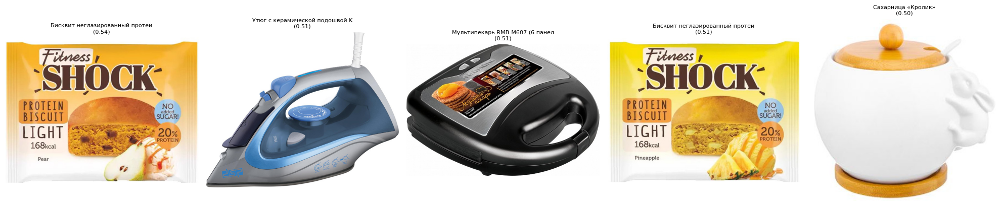

In [123]:
show_results(top_results)

##### FRENCH

In [96]:
query = "machine à café" # coffee machine
query_emb = encode_text_query(query, flip_dual_encoder5000)

# Convert image embeddings to array
image_embs_array = np.array(all_products_combined['image_embedding'].dropna().tolist())

# Compute cosine similarities
sims = cosine_similarity([query_emb], image_embs_array).flatten()

🔁 Final image_embedding: <class 'NoneType'> None
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


In [97]:
top_k_indices = sims.argsort()[-5:][::-1]
top_results = all_products_combined.iloc[top_k_indices][['title', 'windows_image_path']]
top_results['similarity'] = sims[top_k_indices]

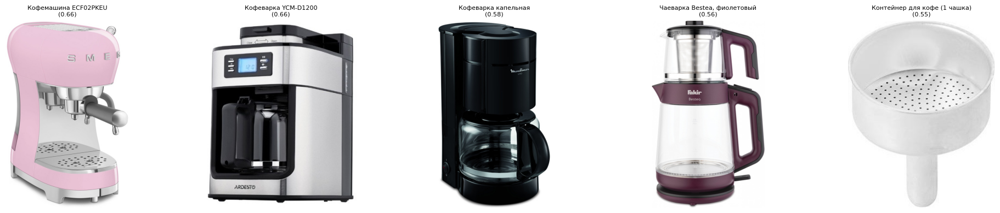

In [98]:
show_results(top_results)

##### SPANISH

In [102]:
query = "suavizante de telas" # fabric softener
query_emb = encode_text_query(query, flip_dual_encoder5000)

# Convert image embeddings to array
image_embs_array = np.array(all_products_combined['image_embedding'].dropna().tolist())

# Compute cosine similarities
sims = cosine_similarity([query_emb], image_embs_array).flatten()

🔁 Final image_embedding: <class 'NoneType'> None
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


In [103]:
top_k_indices = sims.argsort()[-5:][::-1]
top_results = all_products_combined.iloc[top_k_indices][['title', 'windows_image_path']]
top_results['similarity'] = sims[top_k_indices]

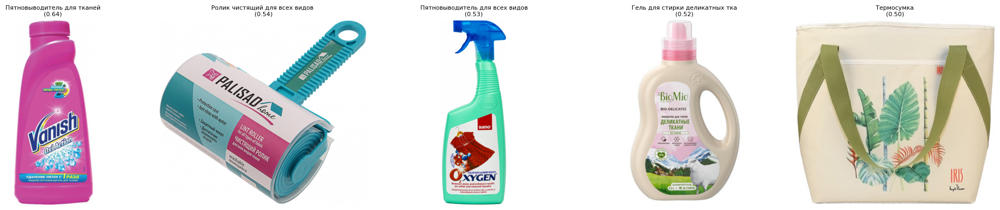

In [104]:
show_results(top_results)

##### ARABIC

In [105]:
query = "دعوى للنساء" # woman suit
query_emb = encode_text_query(query, flip_dual_encoder5000)

# Convert image embeddings to array
image_embs_array = np.array(all_products_combined['image_embedding'].dropna().tolist())

# Compute cosine similarities
sims = cosine_similarity([query_emb], image_embs_array).flatten()

🔁 Final image_embedding: <class 'NoneType'> None
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


In [106]:
top_k_indices = sims.argsort()[-5:][::-1]
top_results = all_products_combined.iloc[top_k_indices][['title', 'windows_image_path']]
top_results['similarity'] = sims[top_k_indices]

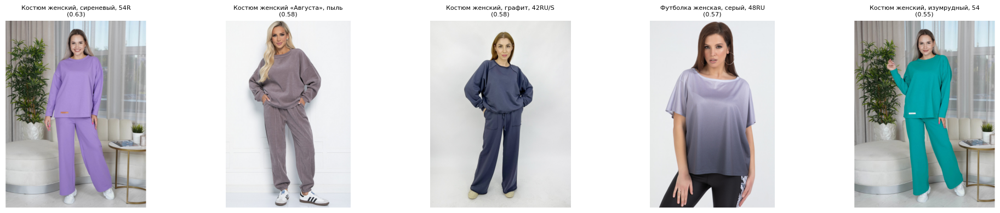

In [107]:
show_results(top_results)

##### CHINESE

In [108]:
query = "牙刷" # toothbrush
query_emb = encode_text_query(query, flip_dual_encoder5000)

# Convert image embeddings to array
image_embs_array = np.array(all_products_combined['image_embedding'].dropna().tolist())

# Compute cosine similarities
sims = cosine_similarity([query_emb], image_embs_array).flatten()

🔁 Final image_embedding: <class 'NoneType'> None
🔁 Final text_embedding: <class 'torch.Tensor'> torch.Size([1, 256])


In [109]:
top_k_indices = sims.argsort()[-5:][::-1]
top_results = all_products_combined.iloc[top_k_indices][['title', 'windows_image_path']]
top_results['similarity'] = sims[top_k_indices]

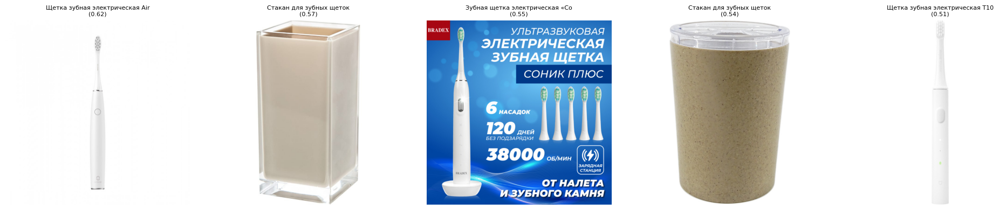

In [110]:
show_results(top_results)

In [21]:
all_products_combined.iloc[42]["windows_image_path"]

'C:\\Users\\User\\Desktop\\flip_vlm\\flip_data_vlm\\category_1/images/Кинезио_тейп_лента_для_лица_и_тела_42.jpg'

In [ ]:
image_path = all_products_combined.iloc[42]["windows_image_path"]
text_query = all_products_combined.iloc[42]['title']

transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# === 3. Load and preprocess image ===
img = Image.open(image_path).convert("RGB")
img_tensor = transform(img).unsqueeze(0).to(device)

# === 4. Encode image and text ===
with torch.no_grad():
    image_embedding, text_embedding = model(img_tensor, [text_query])

# === 5. Inspect embeddings ===
print("📸 Image embedding shape:", image_embedding.shape)
print("📝 Text embedding shape:", text_embedding.shape)

print("📸 Image embedding vector (first 10):", image_embedding.squeeze().cpu().numpy()[:10])
print("📝 Text embedding vector (first 10):", text_embedding.squeeze().cpu().numpy()[:10])